In [454]:
import os, cv2
import numpy as np
import pandas as pd
import random, tqdm
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

import warnings
warnings.filterwarnings("ignore")

from PIL import Image
from fvcore.common.file_io import PathManager
import pycocotools.mask as mask_utils

from detectron2.data import DatasetCatalog, MetadataCatalog
from detectron2.structures import BoxMode
from detectron2.utils.visualizer import Visualizer

from tqdm import tqdm

In [455]:
DatasetCatalog.clear()
MetadataCatalog.clear()

In [456]:
bb2dfull = True
bb2dvis = False
instance = True
semantic = True
panoptic = False

In [457]:
class_names = ['robot', 'person', 'object']#, 'background'] 
# Get class IDs
class_ids = ['10', '20', '30']#, '0'] 
select_colors = [(0, 80, 142), (0, 161, 28), (0, 242, 171)]#, (0, 0, 0),]

stuff_id = {}
counter = 0
for i in class_ids:
    stuff_id[int(i)] = counter
    counter = counter + 1

print('All dataset class names and their corresponding IDs in labels:')
print('Class Names: ', class_names)
print('Class IDs: ', class_ids)
print('Class Colors: ', len(select_colors))
print(stuff_id)

All dataset class names and their corresponding IDs in labels:
Class Names:  ['robot', 'person', 'object']
Class IDs:  ['10', '20', '30']
Class Colors:  3
{10: 0, 20: 1, 30: 2}


In [458]:
# helper function for data visualization
def visualize(**images):
    """
    Plot images in one row
    """
    n_images = len(images)
    plt.figure(figsize=(20,8))
    for idx, (name, image) in enumerate(images.items()):
        plt.subplot(1, n_images, idx + 1)
        plt.xticks([]); 
        plt.yticks([])
        # get title from the parameter names
        plt.title(name.replace('_',' ').title(), fontsize=20)
        plt.imshow(image)
    plt.show()

In [459]:
# Shuffles into train/val dfs and annotates each segmentation instance into Detectron2
path = '/home/danilo/humble_ws/depot_dataset_semantic_nsc_2'
images_dir = os.path.join(path, 'segmentation_data','instance_camera', 'images')
masks_dir = os.path.join(path, 'segmentation_data','instance_camera', 'labels_maps')
bbox_ann_dir = os.path.join(path, 'bounding_box_full_2d_data','boxes')
#bbox_ann_dir = os.path.join(path, 'bounding_box_visible_2d_data','boxes')

image_paths = [os.path.join(images_dir, image_id) for image_id in sorted(os.listdir(images_dir))]
mask_paths = [os.path.join(masks_dir, image_id) for image_id in sorted(os.listdir(masks_dir))]
bbox_ann_paths = [os.path.join(bbox_ann_dir, image_id) for image_id in sorted(os.listdir(bbox_ann_dir))]
    
paths_df = pd.DataFrame()
paths_df['image_path'] = image_paths
paths_df['mask_path'] = mask_paths
paths_df['bbox_ann_path'] = bbox_ann_paths

# Shuffle DataFrame
paths_df = paths_df.sample(frac=1).reset_index(drop=True)
# Perform 90/10 split for train / val
global_valid_df = paths_df.sample(frac=0.1, random_state=42) #pseudorandom seed
global_train_df = paths_df.drop(global_valid_df.index)
print("Total Images = " + str(len(paths_df)),
len(global_train_df), len(global_valid_df))
   
## Normalize label_maps if needed 
#convert_images('train')
#convert_images('valid')
 
for d in ["train", "valid"]:
    DatasetCatalog.register("simulation_" + d, lambda d=d: load_custom_dataset(str(d)))
    MetadataCatalog.get("simulation_" + d).set(stuff_classes=['robot', 'person', 'object'])
simulation_metadata = MetadataCatalog.get("simulation_train")
    

def convert_images(input_df):
    if(input_df == 'train'):
        image_paths = global_train_df['image_path'].tolist()
        mask_paths = global_train_df['mask_path'].tolist()
    else:
        image_paths = global_valid_df['image_path'].tolist()
        mask_paths = global_valid_df['mask_path'].tolist()

    counter = 0
    for image_file, gt_file in zip(image_paths, mask_paths):
        im = np.array(Image.open(gt_file))
        #im[im == 0] = 0
        #im[im == 63] = 1
        #im[im == 98] = 2
        #im[im == 162] = 3
        pil_img_gray = Image.fromarray(im)
        pil_img_gray.save(gt_file)
        
def load_custom_dataset(input_df):
    #print(global_train_df['image_path'].tolist())
    results = []
    if(input_df == 'train'):
        image_paths = global_train_df['image_path'].tolist()
        mask_paths = global_train_df['mask_path'].tolist()
        ann_paths = global_train_df['bbox_ann_path'].tolist()
    else:
        image_paths = global_valid_df['image_path'].tolist()
        mask_paths = global_valid_df['mask_path'].tolist()
        ann_paths = global_valid_df['bbox_ann_path'].tolist()
        
    counter = 0
    for image_file, gt_file , ann_file in tqdm(zip(image_paths, mask_paths, ann_paths)):

        # PIL Image is efficient as it doesn't read image to retrieve size
        im = Image.open(gt_file)
        width, height = im.size
        record = {}
        annotations = {}
        record["file_name"] = image_file
        record["image_id"] = counter
        record["height"] = height
        record["width"] = width
        #ann_df = pd.read_csv(ann_file)
        ann_df = pd.read_csv(ann_file)
        objs = []
        for index, row in ann_df.iterrows():
            # Define the bounding box coordinates (left, upper, width, height)
            bbox = (round(ann_df['x_center'][index]-(0.5*(ann_df['width'][index]))), round(ann_df['y_center'][index]-(0.5*(ann_df['height'][index]))), round(ann_df['width'][index]), round(ann_df['height'][index]))
            #print(bbox)
            # Create an empty binary mask image
            #mask = Image.new('1', im.size)
            other_class = 0
            inst_id_count = []
            dif_ids = []
            final_id = 0
            crowd = 0
            pix_count=0
                        
            # Crop the image to the bbox
            bbox = (bbox[0], bbox[1], bbox[0]+bbox[2], bbox[1]+bbox[3])
            #print(bbox)
            img_crop = im.crop(bbox)

            # Convert the cropped image to a numpy array
            img_arr = np.array(img_crop)

            # Find the indices of pixels with the specific RGB value
            b = ann_df['label'][index]
            mask1 = np.all(img_arr == [2, 0, b], axis=-1)
            mask2 = np.all(img_arr == [1, 0, b], axis=-1)
            mask = mask1 | mask2


            # Create a binary mask of the whole image with the found pixels as 1s
            full_mask = np.zeros((600,800), dtype=np.uint8)
            full_mask[bbox[1]:bbox[3], bbox[0]:bbox[2]] = mask.astype(np.uint8) * 255

            # Plot the binary mask
            # Plot the binary mask using matplotlib
            #plt.imshow(full_mask, cmap='gray')
            #plt.show()
            rle = mask_utils.encode(np.asfortranarray(full_mask))
            #print(rle)
            
             
            obj = {
                "bbox": [round(ann_df['x_center'][index]-(0.5*(ann_df['width'][index]))), round(ann_df['y_center'][index]-(0.5*(ann_df['height'][index]))), round(ann_df['width'][index]), round(ann_df['height'][index])],
                "bbox_mode": BoxMode.XYWH_ABS,
                "segmentation": rle,
                "category_id": (stuff_id[ann_df['label'][index]]),
                "iscrowd": crowd
            }
            objs.append(obj)
        record["annotations"] = objs
        counter = counter + 1
        #print('done with data: ', counter)
        results.append(record)

              
        

    assert len(results),  f"No images found in {image_dir}!"
    #assert PathManager.isfile(results[0]["sem_seg_file_name"]
    #), "Passed"  # noqa

    return results

Total Images = 2613 2352 261


In [399]:
dataset_dicts = load_custom_dataset("train")

2352it [00:22, 106.45it/s]


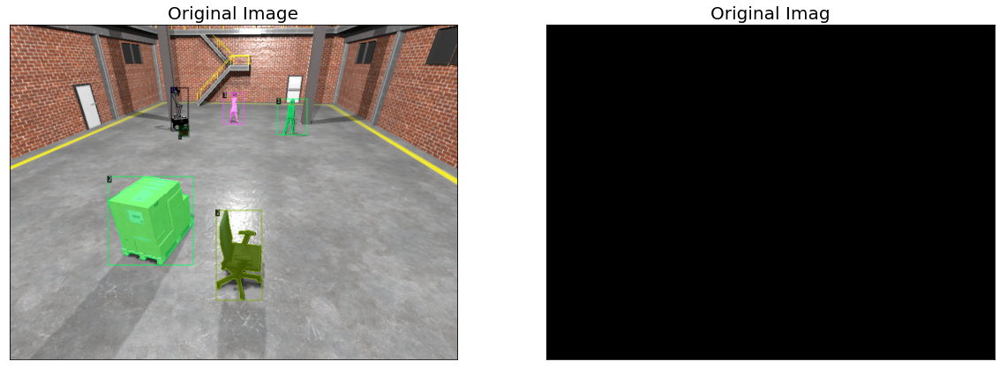

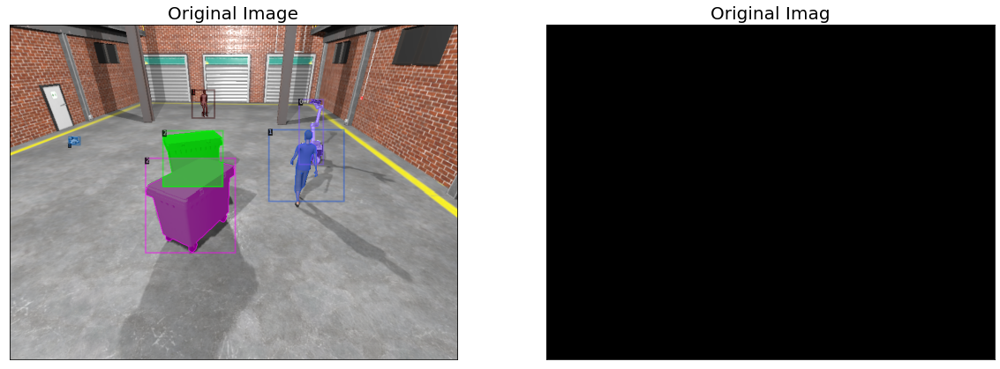

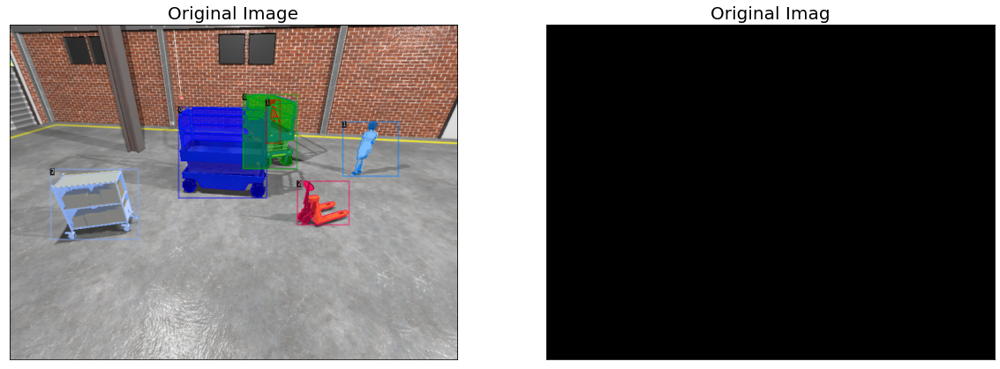

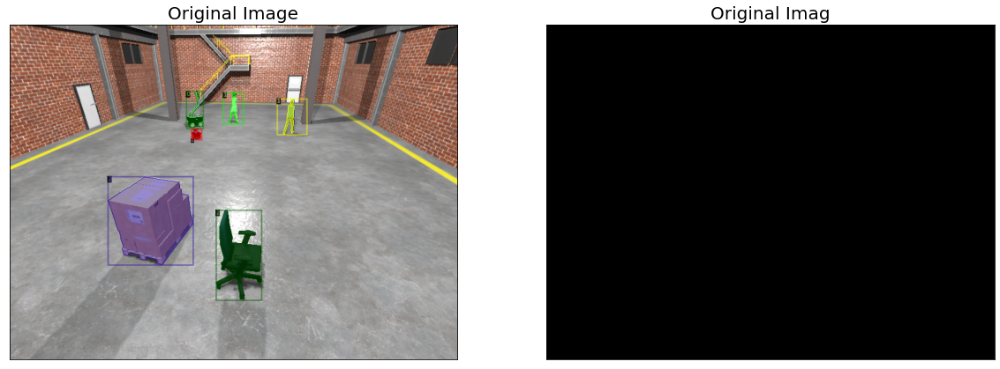

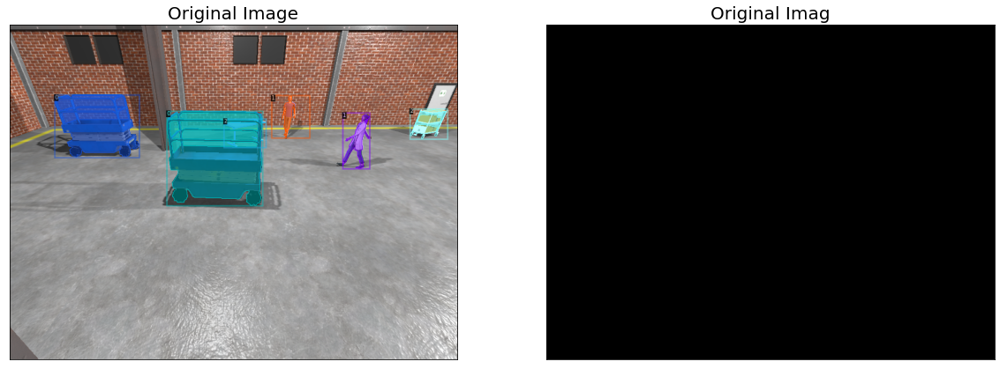

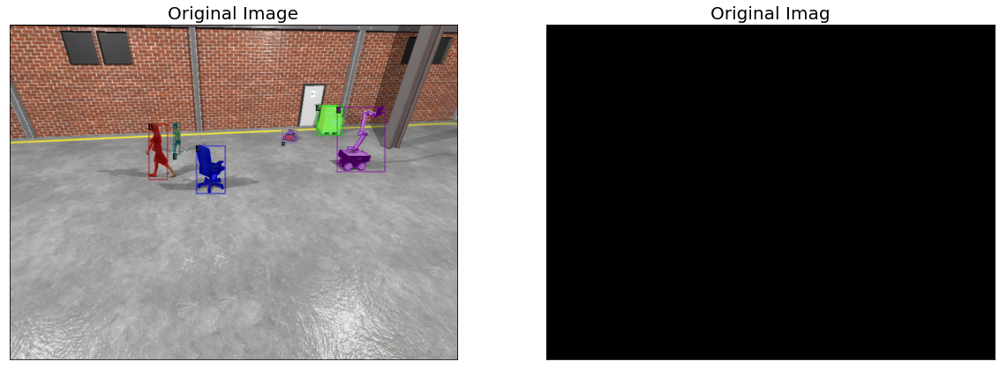

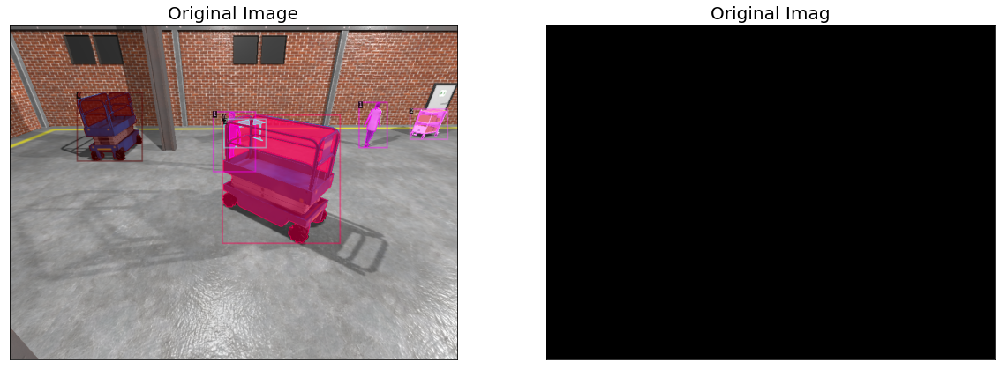

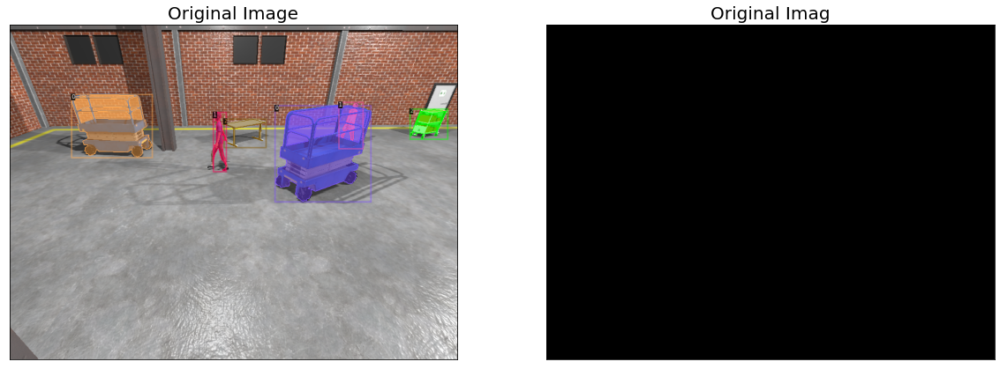

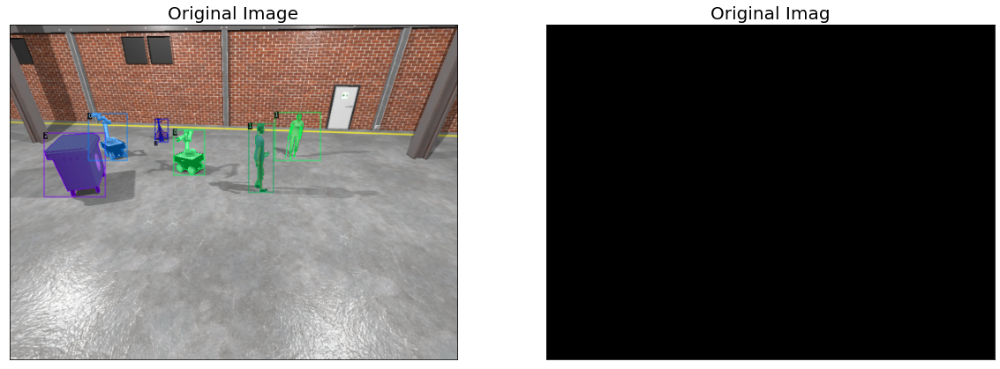

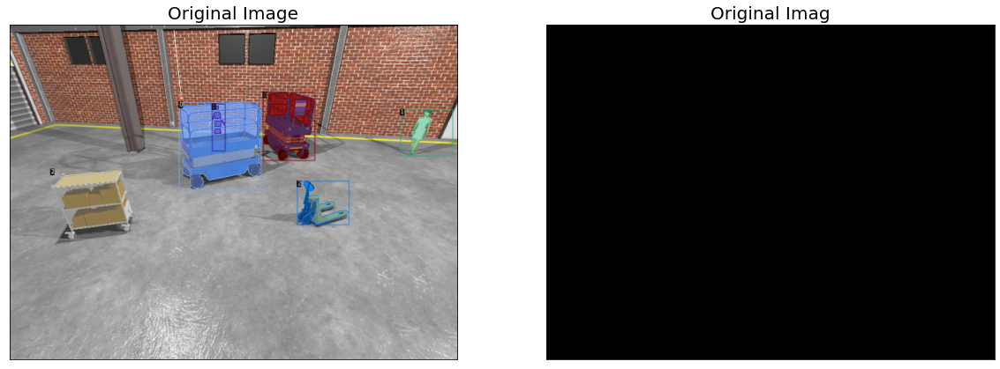

In [460]:
for d in random.sample(dataset_dicts, 10):
    img = cv2.cvtColor(cv2.imread(d["file_name"]),cv2.COLOR_BGR2RGB)
    #mask = cv2.imread(d["sem_seg_file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=simulation_metadata, scale=1, instance_mode=ColorMode.SEGMENTATION)
    out = visualizer.draw_dataset_dict(d)
    
    visualize(
        original_image = out.get_image()[:, :, ::-1],
        original_imag = Image.new('1', (800,600))
    )

In [447]:
# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg

In [448]:
from detectron2.utils.visualizer import Visualizer
dataset_name = "simulation_train"
dataset_dicts = DatasetCatalog.get(dataset_name)

# Print out the first 5 items in the dataset
for d in dataset_dicts[:5]:
    print(d)

10it [00:00, 99.09it/s]

(265, 176, 26, 33)
(265, 176, 291, 209)
{'size': [600, 800], 'counts': b'ZWm42eb03KLa]O5Qb00S^O6ia0NT^O4ia0KV^O:ja0DY^O<da0F^^OLK6ja0Fe^O<na0M00001O000O1000000O1K`]O2cb00O11N^QZ9'}
(278, 220, 22, 21)
(278, 220, 300, 241)
{'size': [600, 800], 'counts': b']fS52eb09AFo]O<oa0EQ^O;oa0FQ^O9oa0Go]O;Qb0Em]O=Sb0400000000000_On]O<Rb0Dn]O<Wb0O11O1O0001Am]O4TZU9'}
(439, 180, 73, 78)
(439, 180, 512, 258)
{'size': [600, 800], 'counts': b'c^Q82fb00\\]O2_b04O01OF:_O`0@JV_OXOj`0?R_O@;2b`00`_OOF9l`0FW_O8L3l`0FT_O<ONm`0GR_O<1Nk`0GT_O;0Ol`0FT_O;0Ol`0FS_O=OOl`0EU_O<OOl`0FS_O<0Om`0ES_O<0Ol`0FT_OS1k`0mNV_OR1j`0GR_ODk`0JU_O411j`0HX_O8M1l`0EW_O:M1m`0DW_O:L2m`0DW_O:M1l`0FV_O9N2k`0EW_O:M1l`0EW_O:M1m`0DW_O:M2k`0DX_O:N1j`0FW_O:N0k`0FW_O:OOj`0GW_O:O0i`0FY_O9N1j`0EX_O;M0k`0FY_O8L2k`0FY_O8L3j`0EY_O9N1i`0FY_O9N1j`0EW_O<NOk`0EW_O<N0j`0EX_O:N1j`0EX_O:N1j`0EX_O;L21ZOg`09[_O<M10\\O11a`05a_OU1NdNO4a`04`_OU10jN``01`_OV10iN_`01a_OV10hN``02__OW10hNa`01__O`1c`01__OWNe`0h1600O1O2OP_O[Nm`0j1N]NU_O=14j`0^OV_O>04j`0^OV_O=17g`0[OY_

32it [00:00, 97.18it/s] 

{'size': [600, 800], 'counts': b'R_[84cb02_]OK[b0=M1O1O2N1O1O00Nm]O_OSb0c00O10000O101O0000000000000000001OO1O001O100O2N1O1M2L5N3N^O]^OCN<ca0Mh^O2Xa0Im^O6Sa0Jn^O6Pa0KT_OK]O1`a03o0O100OO200O10O02OO100O3NOO2O10`gV5'}
(233, 168, 46, 64)
(233, 168, 279, 232)
{'size': [600, 800], 'counts': b'WfX44cb02U^ONn`02R_O2i`00V_O1h`00X_O1g`00W_O2h`0OW_O2^ODO1Ua0:]_O1^OKRa05__O:a`0^On^O2?a0c`0\\Oo^O3>b0b`0[OQ_O3<b0c`0[OR_O3:b0d`0[OS_O38c0d`0ZOU_O35d0f`0YOV_O33e0f`0XOX_O31f0f`0WOZ_O3Og0f`0VO\\_O3Mg0g`0VO]_O2Kj0g`0TO^_O3Ji0h`0TO__O3Hi0i`0TO`_O4Eg0k`0VOa_OS1]`0oNd_OP1\\`0POe_Om0]`0SOb_Ol0_`0UOa_Oj0_`0WOa_Oh0``0XO`_Oh0``0ZO^_Of0b`0ZO^_Of0f`0VOZ_Oi0g`0VO]_Og0c`0YOa_Oc0``0ZOb_Og0Xa00O010O0001O0O2CQ^OOoa0OT^ONSb0Mo]ONJO`da9'}
(387, 167, 51, 70)
(387, 167, 438, 237)
{'size': [600, 800], 'counts': b'ZoR71gb05J1_NV1T_OkNm`0^11\\Nb_O0O0_O4Pa0Ma_O0O0h`00Q_O9N0Pa0GR_O9M1Pa0HR_O7N1Pa0HQ_O8N1Qa0GQ_O8N1Pa0HQ_O9N0Pa0GR_O9N0Pa0GR_O9N0o`0IR_O7O0o`0IR_O7N2o`0GS_O8L2Pa0GQ_O:OOPa0GQ_O:N0Qa0FQ_O:N11]ON3g`07Z_O9O12Bd`04[_Oo01

52it [00:00, 93.64it/s]

{'size': [600, 800], 'counts': b'bPc896Mka05P^O1ma0?M2N3N1001OK5N1100N2O1000TOTOl_Ol0Z?POa@;6e0V?0j@0V?0i@1W?Oe@5[?K_@;a?oNc@JE^1h?`Nl@j1YORNh?5o@l1n>WNQAj1m>WNSA<_O@Kk0b?YOTA6La0P?XOUA11h0j>TOWA12k0g>TO[Bj0g=TO^@1d1l0m=UO^@Ne1l0o=SOYBm0e=TO\\Bk0_=@\\B?e=A[B=f=DZB7k=IUB1Q>DU@5j13T>GV@3g12X>IS@4f1Kj>2n101N0010SkV5'}
(365, 179, 16, 18)
(365, 179, 381, 197)
{'size': [600, 800], 'counts': b'aQf65cb04L1N2LEi]O;Vb040O001Ch]O:Xb0Fh]O:]b0N001O01O00IfZe7'}
(148, 244, 33, 33)
(148, 244, 181, 277)
{'size': [600, 800], 'counts': b'jnf23eb01N4M2N2M3N2N2N2M4M2N1N2O001O0O10000O10O10000O2O001N2O0O8I6J5J7Ji]Z;'}
(386, 138, 24, 40)
(386, 138, 410, 178)
{'size': [600, 800], 'counts': b'jYR71gb00[^O1a`01\\_O0e`07f^OH1O[a0e0d^O\\O\\a0e0c^O[O]a0e0c^O[O^a0d0b^O\\OJ0_a0e0f^O[OIO01ba0d0e^O^Oca0=\\^OCia0MT^O82HUb0<KDn]O5Xb0Lh]O4Xb051Jd]ON^b0O7O1000PTV7'}
(530, 121, 29, 67)
(530, 121, 559, 188)
{'size': [600, 800], 'counts': b'iff9292na0=N1OK6L301OU^OIVa08l^OHTa07l^OJn`0;S_OEi`0=X_ODd`0m0n^OTOm`0^1M3I\\NY_O\\1m`

73it [00:00, 95.47it/s]

{'size': [600, 800], 'counts': b'f``55`b0<D<h^OTOo?W1h_OSOn?W1h_OQOQ`0Ei_Ok1V`0UNT@b16[NKMc>5eA[1LhNFKh>2fA[1KiND2e>KkA1Ge04_OC2f>DXA1d04O?KGC2f>DYA0c00]O0c0c0JHC3f>BZA0c00]O0b0d0J=X>nN]A1a00_O0`0f0J;X>oN^A0a00_O0`0f0I=X>lN`A1?0A0>j0F:\\>kN`A1?0A0=l0B;a>iN`A0>0C0<Z2R>eMbA1=0C0;[2S>dMbA1<0FO8]2T>cMbA1<0FO8]2T>fM`AM=1HO6^2V>kMjAGK04_2X>[NbAVO6]2[>`N[ASO9]2[>lN_AU1`>a10SL_AN4Z3_>gL^AO:f2BcMe>H`AO91H0JV2Q?jMTA070K01P2g>oMWA16OL10R2e>mMYA16OL10S2d>lMZA15ON1OU2b>jM\\A15ON10V2_>iM^A15OO0OX2^>hM_A15OO0OY2]>gM`A15OO0OY2]>gM`A15OO0OY2]>gM`A16OM00Z2\\>gM`A07OM00Z2\\>gM`A07OM00Z2\\>gM`A07OM00Z2\\>gM`A07OM00Z2\\>gMaAO60M00Z2\\>gMaAO60M1OY2^>fM`A060M1OY2^>fM`A060M1OY2^>fM`A060M1OZ2]>eMaA060M10Y2\\>fMaA060M10Y2\\>fMaA15ON10Y2\\>fMaA15OO0OZ2\\>fMaA15OO0OZ2\\>fMaA15OO0OZ2\\>fMaA15OO0OZ2\\>fMaA15OO0OZ2\\>fMaA150NO0Z2\\>fMaA16OM00[2[>eMbA16OM00[2[>eMbA16OM00[2[>eMbA16OM1OZ2\\>eMbA16OM1OZ2\\>eMbA16OM1OZ2\\>eMbA16OM10Y2[>gMaA07OM10Y2[>gMbAO60M10Y2[>gMbAO60M10Z2Z>fMcAO60N0O[2Z>fMcAO60N0O[2Z>fMcAO60N0O[2Z>fM

93it [00:00, 95.25it/s]

{'size': [600, 800], 'counts': b'jR^43`b0Nc]O8Xb05N1MBk]O`0Sb0300O2O0O2O0O101N2N4M4K5L3L5L4K4M4K5L3L5L4K4M4K5L4K4M2M2O1N101N7J1N2O1N101QO]LfBd3Z=aLaB_3_=fL[BZ3f=kLUBU3k=PMoAP3R>j01O11O00001O001O001O001O001O001O001O001O001O001O00001O001O007I1O1O1O001O0000O100O1O1N2O1M3F[B^Kh=a48O1O1O1O1O100O1O1O1O1O1O1O1O1O1O1O1O1O1O1O100O1O1O1O1O1O1O1O1O1O1O1O1O1O1O1O8I1N11O1O010O000000O2N1N2N2G^@YMf?e27O1O1WOj0ROm0I700O2N1O100O2_Om]O:^SZ7'}
(273, 191, 107, 100)
(273, 191, 380, 291)
{'size': [600, 800], 'counts': b'QUP512001P2>l=LoA5P>OmA1S>1jA0V>2hANX>5dAL\\>6bAJ^>8_AIa>9]AGc>>WACh>c0SA]Om>h0m@YOS?l0h@TOX?Q1b@PO^?U1]@kNc?Z1W@gNi?T2000000O1000000000000000000O10000000000000000O1000000000000000000O1000000000000000000O10000000000000000O1000000000000000000O1000000000000000000O1001O001O1O1O1O001O1O1O1O1iMl@h0T?UOPAj0Q?UOo@k0R?hNQ@8m0P1S?gNQ@7m0R1Y?kNh@T1e[f7'}
(321, 116, 32, 49)
(321, 116, 353, 165)
{'size': [600, 800], 'counts': b'bjS61cb0>E4M2M?R^OmNVa03g^On05oNSa0Y154LhNg^O227NN_a00b^O60Aka01U^O73GSb00S^

113it [00:01, 95.94it/s]

{'size': [600, 800], 'counts': b'W]U7340Yb09\\ON_^O3S`09[@G_O2U`09Z@F@6Q`05^@F@8o?3`@F@8V>l1YBgNc=]1[BeNc=]1\\BdN_=b1_B`N^=b1aB`N\\=b1cB`N[=a1cBaN\\=fNTC1Ke0De0\\=eNUC1Kg0Bd0^=dNTCLZOMa0S1_Oa0a=cNVCJ[ON?n2Q=TM^BOf01]ON=o2Q=SM`BOd02^OM<P3Q=RMbBOb02@M:Q3R=QMbBNc02@N8Q3S=QMcBNa02BN6R3T=oLdB0>1EN4n2ERM_=2eBO=1GN2P3Y=QMbB0;2HN0P3Z=QMcBO;1IONP3[=QMdBO91KOLl2a=TM`B080L0Jb2O^Md=0_B08ON0Hd2k=]MXB060OOFg2l=\\MXBMKo3m=g0N3N100MYLcBmNIQ3`=TM`BL812NFS3^=oLeBO5O40DT3\\=mLiB0205OES3Z=nLkB01O60DT3Y=lLnB0O061CS3Z=lLnB0O061CS3Y=mLoB0NN82BS3Y=lLPC1MN91AT3Y=lLPC1MN91AU3X=kLQC1MO80CT3W=lLQC1MO80CT3W=lLQC1MO81BS3X=lLQC1MO81BT3W=lLQC0NO81BT3W=lLQC0NO81BT3X=kLQC0M090AU3X=kLQC1LO:0BT3W=lLQC1MN91BU3V=kLRC1MO80CU3V=kLRC1MO81BT3W=kLRC1MO81BT3W=kLRC1MO81BU3V=jLSC1MO81BU3V=jLSC1MO90AV3V=jLSC1MO90BU3U=lLSCOM090BU3U=lLSC0MN92AU3V=jLSC1MO81BU3V=jLSC1MO81BU3V=jLSC1MO81BU3V=jLSC1MO90AW3U=iLTC1MO90BV3T=jLTC1MO90BV3T=jLTC1MO90BV3T=jLTC1MO91AU3U=jLTC1NN82AV3T=jLUC0MO81BV3T=jLUC0MO81BV3T=jLUC0MO90BV3S=kLUC0MO90BW3S=iLUC1MO9

133it [00:01, 94.93it/s]

{'size': [600, 800], 'counts': b'Z\\`71h00Ua03W^ONM1;N`a02W^O:4Eca01Y^Oe0ea0[OZ^O901[a0>Q_OWOe`01S_Oi0;UO_`07R_Od0>VO``06Q_Oe0?UO_`0\\1Z_OeNe`0g11O1]NR_Oi01UO`a0a0_^O@ja01a^OLfTl6'}
(344, 235, 43, 49)
(344, 235, 387, 284)
{'size': [600, 800], 'counts': b'_jY63ab0O`]O3_b05N2N1O1N101O1O1O0000O1O10000O10000Fh]O4Xb05100000N1O2O1N2O1H^OZ^Oa0fa09O1O1O@[^OCN70Hfa05i^O4Xa0Kj^O5Pa0J_^O0b06m`01T_ONk`03Y_OHh`08Z_OEf`09n0M2Jb]O2mZb7'}
(523, 281, 33, 33)
(523, 281, 556, 314)
{'size': [600, 800], 'counts': b'[gb928OTb04e]O3Xb07O2O0O5L2N1O1O001O000N20O001O02O0O010O10WOX^Ob0ha0^OX^Ob0ha0]O[^O`0ga0_OY^O`0ha0_OZ^O`0oa0O2O001I6N4Lke^4'}
(439, 180, 73, 78)
(439, 180, 512, 258)
{'size': [600, 800], 'counts': b'c^Q82fb00\\]O2_b04O01OF:_O`0@JV_OXOj`0?R_O@;2b`00`_OOF9l`0FW_O8L3l`0FT_O<ONm`0GR_O<1Nk`0GT_O;0Ol`0FT_O;0Ol`0FS_O=OOl`0EU_O<OOl`0FS_O<0Om`0ES_O<0Ol`0FT_OS1k`0mNV_OR1j`0GR_ODk`0JU_O411j`0HX_O8M1l`0EW_O:M1m`0DW_O:L2m`0DW_O:M1l`0FV_O9N2k`0EW_O:M1l`0EW_O:M1m`0DW_O:M2k`0DX_O:N1j`0FW_O:N0k`0FW_O:OOj`0GW_O:O

153it [00:01, 95.09it/s]

{'size': [600, 800], 'counts': b'kbP72eb010001O00001N10000000O1O010O1O10c]Og0[a0XOf^Oh0Za0WOg^Oi0Xa0XOd^OOYb00h]O0Xb00g]O1_b0100O1O1O101N1O100O1O100O10O10O100000O1000O1000OP[2KgkNLlhNOg^O1Pa08P_OHPa07R_OIn`06R_OJn`06R_OJn`06R_OKm`05T_OJm`05Q_ONn`01a^Oa0_a0<10O@i^O_OWa03W_OMi`02Y_ONg`01Y_ONh`02o00001N10hiX6'}
(73, 260, 156, 125)
(73, 260, 229, 385)
{'size': [600, 800], 'counts': b'kQ[12eb03N2N200M4L3MHk]O1Rb00P^O0ma00V^O0ga01\\^ONaa03a^ON[a03g^OMVa04l^OLQa05Q_OKl`06V_OJg`07\\_OHa`09a_OG[`0;[_O^OL8e`0:__OAL5b`0;a_OCM2Z`0J]_Ob0;ENOX`0a0h_ODOLW`0`0i_OHKL[`0;i_OLICO0_`0?h_O9KYOh0Hf>f0e@;OWOc0Jh>d0e@;3WO=Kk>c0d@<7UO8Lm>b0e@=8UO4Lo>b0e@=:UO0LQ?c0d@<=UOLLFNX?h0f@9b0VOG2o>c1]AZNB3P?d1`AYN^O4Q?;k@>i0SOYO4S?;m@<<oNK6G5T?:m@=<QOL`0k>1m@?:TOK=n>0l@`0:VOH<R?Nl@`08DHDT?8l@`07DJCT?9k@`05FLAT?9k@`03HOTOM6W?>j@?3J3WOP?a0j@>1L6ROQ?d0h@>0Md?E\\@b1d?]N]@b1d?^N[@c1e?]N[@c1e?]N[@c1e?]N[@c1e?]N[@c1e?]N[@c1d?^N\\@b1d?^N\\@a1e?_N[@a1e?^N[@c1e?]N[@c1e?]N[@c1e?]N[@c1e?]N[@c1e?]N[@b1f?^NZ@b1f?^NZ@b1e?_N[@a1e?_N[@a

163it [00:01, 94.50it/s]

(453, 178, 109, 121)
(453, 178, 562, 299)
{'size': [600, 800], 'counts': b'gWk84db02M3M1N1NLh]ONT1Lj?7X_OJl01h?6d@JkNOQ`08VAJgNOo?9\\AIdNNk?;Y@Ff0NQO35Ni?;X@o0IjN6Kf?=Y@[10YNd?=Y@i1e?f000OL5J5I800@?N3O]OcNl_O\\1U`0fNj_OX1W`0d01O1N2O1O1M3M4]N]_On0e`0PO\\_Ol0LiN21b`07c_O?7ZOCON0f`06c_O=:Ed`07^_OIc`0>l^OLTa0j03H8J6JQnP5'}
(373, 173, 45, 74)
(373, 173, 418, 247)
{'size': [600, 800], 'counts': b']hj69_b01O0hNHl^OOQ1:ROKe`0LW_O0R19PO0d`0G[_O0o0;QONe`0KZ@8PONe`0KZ@d0f?[O[@e0f?ZOZ@f0f?[OX@f0h?ZOX@e0j?Ao_O=S`0Dl_O<T`0Di_O`0V`0@h_Oe0_OoNd`0<l_Oi0S`0P1N1O000000_Nh_Ob0X`0UOS@i0m?VOS@j0n?SOU@k0m?TOT@l0l?SOU@m0k?SOU@m0k?SOU@m0k`0O2O4L1O0O20O01O0O1CT^ONma01T^ONla02V^OKla04W^OFla09;Ofco6'}
(216, 159, 48, 88)
(216, 159, 264, 247)
{'size': [600, 800], 'counts': b'hhn35cb04L1N101kNGi_O9W`0Jf_O7TOIl`01o_O7UOJi`00R@6TOMg`0NU@b0h?@X@a0e?AZ@`0a?EW@C_Oh0Z`0EV@d0i?UOe_OMa0m0k?TOf_O1<l0n?QOh_O67f0EnNY`00i_O53:3c0HnNW`04i_O06>Oc0KkNT`0:S@:Lc0P`0TOT@:Jc0Q`0SO\\@`1b?`Na@]1_?cNd@Z1\\?_NR@Nf0`1X?bNQA[1o>eNTAX1l>hNUA

183it [00:01, 94.35it/s]


{'size': [600, 800], 'counts': b'niP76_b04M3M3N1N3N101N1O10000O001O2N101N2M2O2M2O2N2JjNh^OV1Xa0jNg^OX1Wa0501O1N1010TOm^O1Sa00l^O1Ta0i004M1N10O01O1O0010O0000001N1O1O2YOn^OESa0o02M2N3M3L4L4XO[^O<ea0A]^O?ea0^O[^Oc0ga0YO[^Og0ka000O1O2N1N3N2M2N3LZS\\6'}
(547, 146, 47, 53)
(547, 146, 594, 199)
{'size': [600, 800], 'counts': b'fXQ:6]b07K4L400E@\\^Oa0]a0Ec^O=Va0Ii^O8Qa0Mo^O4Pa0LP_O4Pa0Lo^O5Qa0i0000M300000000001O1O1O1O000000N2N2000000001O1O1O10O001O1O1L3I8K4ZO_^O1fa0Ga^O4Ub0K[ah3'}
(339, 169, 14, 53)
(339, 169, 353, 222)
{'size': [600, 800], 'counts': b'PjV65i0Oa`01k^O0d0NZONUa0k0S_OXORa0i0l^OWOUa0T12O2PO_^Of0ca0UO]^O02h0ma0ZOS^O4N2oa0I^^O7aa0Ga^O:\\a0Gh^O7Ua0IP_O6m`0JV_O2VXV8'}
(333, 218, 51, 85)
(333, 218, 384, 303)
{'size': [600, 800], 'counts': b'eZS62db0;F8V_O\\ObN1\\`0g0m@^OR?f0j@[OU?i0j_OZO<Mj?Z1U@fNm?Y1S@eNo?\\1P@cNQ`0]1o_OcNR`0]1m_OcNS`0]1m_OcNS`0]1l_OcNV`0]1i_OcNW`0]1e_O`NI3b`0^1`_OdNMNc`0^1__OeNNMd`0^1]_OkNc`0U1^_OcNN0d`0]1__OhNc`0X1\\_OhN5HT`0`1h_OgN1OU`0Z1j_OgNM2[`0Q22Gc_OPNf`0e1^

204it [00:02, 95.93it/s]

{'size': [600, 800], 'counts': b'lSZ53bb0N_]O3ab0N_]O2`b0300O101O000000000O2OOO1N3IDQ^O<Pb06O01En]O0Qb0JV^ONH6Qb0MZ^O1fa00[^OOea00\\^O0ea0N\\^O2Ub00g\\k8'}
(298, 222, 23, 25)
(298, 222, 321, 247)
{'size': [600, 800], 'counts': b'ij^51fb02N4]]ONZb09N2KBn]O?Qb0Ao]O?Pb050O001O010^On]O?Qb0Ao]O?Qb0@Q^O?Ub0O1O0N22O0O00Ki]OHXb09T^h8'}
(439, 180, 73, 78)
(439, 180, 512, 258)
{'size': [600, 800], 'counts': b'c^Q82fb00\\]O2_b04O01OF:_O`0@JV_OXOj`0?R_O@;2b`00`_OOF9l`0FW_O8L3l`0FT_O<ONm`0GR_O<1Nk`0GT_O;0Ol`0FT_O;0Ol`0FS_O=OOl`0EU_O<OOl`0FS_O<0Om`0ES_O<0Ol`0FT_OS1k`0mNV_OR1j`0GR_ODk`0JU_O411j`0HX_O8M1l`0EW_O:M1m`0DW_O:L2m`0DW_O:M1l`0FV_O9N2k`0EW_O:M1l`0EW_O:M1m`0DW_O:M2k`0DX_O:N1j`0FW_O:N0k`0FW_O:OOj`0GW_O:O0i`0FY_O9N1j`0EX_O;M0k`0FY_O8L2k`0FY_O8L3j`0EY_O9N1i`0FY_O9N1j`0EW_O<NOk`0EW_O<N0j`0EX_O:N1j`0EX_O:N1j`0EX_O;L21ZOg`09[_O<M10\\O11a`05a_OU1NdNO4a`04`_OU10jN``01`_OV10iN_`01a_OV10hN``02__OW10hNa`01__O`1c`01__OWNe`0h1600O1O2OP_O[Nm`0j1N]NU_O=14j`0^OV_O>04j`0^OV_O=17g`0[OY_O>0MNGj`0MX_O>26g`0[OY_O=

224it [00:02, 93.65it/s]

{'size': [600, 800], 'counts': b'jYR71gb00[^O1a`01\\_O0e`07f^OH1O[a0e0d^O\\O\\a0e0c^O[O]a0e0c^O[O^a0d0b^O\\OJ0_a0e0f^O[OIO01ba0d0e^O^Oca0=\\^OCia0MT^O82KRb0;LBP^O53Lla00Q^O43Lla09U^OHja02o]O07Nja0OR^O34Nja0NS^O25NG0Qb00T^O14OG2oa0NV^O144la0LT^O1GOVb00T^OOPb00k[T7'}
(564, 121, 32, 67)
(564, 121, 596, 188)
{'size': [600, 800], 'counts': b'hcZ:3k02i`0OV_O0k`0OU_O1m`0NR_O2o`0Nm^OO\\O5ga0Ll^O6Ta0Kk^O6Ua0Jk^O5Va0Ki^O7Va0Ii^O7Wa0Ja^ONL8da0I^^O`0ba0A\\^Of07WOk`03k^Ok08SOl`0V1R_OjNl`0Z1Q_OgNn`0i0T_OAJFn`00S_Of0?A[`0LU_Oc0f0\\OS`0j0n0I8M3Co]O2Sb0LP^O3oa0LU^O3Zb001N10_]OL[b073L101MX\\g3'}
(348, 166, 73, 88)
(348, 166, 421, 254)
{'size': [600, 800], 'counts': b'c^h63]b08@HZ^O>ba0G[^O7OBaa0l0UOVOR@k0P`0]Oc_Og0^`0]OZ_Oe0a`0i01O2200000000001O1ZN[_OW1Sa0012O2OO5nNc^O>Va0Gl^O=k`0VOS_OJ0<5LO6j`0EV_O:4F62a`0LX_O:d0I``06__OJd`04[_OLi`00Y_ONj`00[VZ7'}
(322, 159, 40, 73)
(322, 159, 362, 232)
{'size': [600, 800], 'counts': b'okl54cb06J1O1k]OFka0;P^OLma05R^OMla0a0gNVO^_OOP1l0b?TO^_O1P1l0a?SO__O1P1l0a?SO__O114

244it [00:02, 93.36it/s]

{'size': [600, 800], 'counts': b'UUU64]b0Of]O3Wb0Oh]O2Wb09N0000012M10000001O00000000010O1O001Di]O5Wb0600[OE^^OM1O8`0Wa0Mg^O3Wa0Of^OBM>_a0Ob^O6_a0I`^O8`a0a02N7H001ZOU^O=ka0AX^O=ia0BX^O=ia0BY^O<Sb0N1O1O101Ie]OOmag7'}
(525, 281, 33, 34)
(525, 281, 558, 315)
{'size': [600, 800], 'counts': b'klc964OTb0<N10001N10004L1O1O1O0001ON2O1O1O1O00O21OVOX^Oc0ia0\\OY^Oc0ga0\\O\\^Ob0da0\\O^^Od0ka0N3N1O101O1O1Gi]OL\\b00^`]4'}
(439, 180, 73, 78)
(439, 180, 512, 258)
{'size': [600, 800], 'counts': b'c^Q82fb01[]O1`b04O10NG:_O`0@JW_OWOi`0`0R_O@;2b`00`_OOF9l`0FW_O9L1l`0HS_O;0Nm`0GR_O<1Nl`0FS_O<0Ol`0FT_O;0Ol`0FS_O=OOl`0FT_O;0Ol`0FS_O<0Om`0ES_O<0Ol`0FT_OS1k`0mNV_OR1j`0GS_OCj`0KU_O411j`0HX_O8M1m`0DV_O;M1m`0DW_O:L2m`0DW_O:M2k`0EW_O:M1l`0EW_O:M1l`0EW_O:M1m`0DW_O:M2k`0DX_O:N1j`0FW_O:N0k`0FW_O:OOj`0GW_O:O0j`0EX_O:N1j`0EX_O;M0k`0FY_O8L3j`0EZ_O8L3j`0EY_O9N1i`0FY_O:M0k`0EW_O<N0j`0EW_O;O0j`0EX_O:N1j`0EX_O:N1j`0EX_O;L21ZOg`09[_O<M10\\O11a`06`_OT1OdNO4a`04a_OT1OkN``01`_OV10iN_`01a_OV10hN``02__OW10hNb`0k11G__OWNe`0h1600O10

264it [00:02, 95.55it/s]

{'size': [600, 800], 'counts': b'd[m23eb0N\\]O2bb06L1N2O00000O1003Dc]O6_b0101OO2O0O3N001NoW\\;'}
(436, 144, 35, 65)
(436, 144, 471, 209)
{'size': [600, 800], 'counts': b'jdo74ab04O1c]OOQb01n]O1Qb00n]OI03Qb0`0000O13M2N1I2Z^OVOea0o000\\ORO]_Om0c`0UO]_Ok0b`0VO__Oi0a`0WO__Oi0a`0WO__Oi0``0YO^_Oh0a`0YOT_OR1l`0=0000LYNX_O?4DLc0h`0Em_O0YOMi`0NU@4ROOh`0NV@2ROOi`0OU@2RO0l`0IT@6RONk`0LS@6TOGL0Qa01Q@7W`0Ij_O6V`0Ik_O0[`00ZeP6'}
(242, 240, 160, 169)
(242, 240, 402, 409)
{'size': [600, 800], 'counts': b'jR^43`b0Nc]O8Xb05N1MBk]O`0Sb0300O2N101N100O2O1N4M4K5L3L5L4K4M4K5L3L5L4K4M4K5L3L5L2M2O1N101N7J1N2O1N101QO]LfBd3Z=aLaB_3_=fL[BZ3f=kLUBU3k=PMoAP3R>j01O1001O001O001O001O001O001O001O001O001O001O00001O001O001O007I1O1O1O001O0000O1O1O100N2O1M3F[B^Kh=a48O1O1O1O1O1O100O1O1O1O1O1O1O1O1O1O1O1O1O1O1O100O1O1O1O1O1O1O1O1O1O1O1O1O1O1O8H1010O1O0010O00000O2N1N2N2G^@YMf?e27O1O1WOj0ROm0I7O101N1O100O2_Om]O:^SZ7'}
(273, 191, 107, 100)
(273, 191, 380, 291)
{'size': [600, 800], 'counts': b'QUP512001P2>l=LoA5P>OmA1S>1jA0V>2hA

285it [00:02, 97.32it/s]

{'size': [600, 800], 'counts': b']Rh65cb06I3N0O101nL8QCIl<d0jB\\OR=l0lAdN0>T>U1gA`N^O0<5@HP?i1bAdNML`>g1^A_N1J^>m1]AZN4I]>T2WAWN<EZ>n2eARMY>Q3gAoLX>o2jAQMW>n2jARMV>o2hAQMY>P3fAPMZ>Q3dAoL`>n2`ARMf>i2XAXMo>b2PA]MY?\\2e@eM`?W2_@hMg?S2X@nMl?o1S@PNS`0l1k_OUNY`0Kk_Ol1a`000O100001O00102M4L5XOeMi@`2o>dMPA`2l>`MTAl2`>TM`An2^>RMbAi1DROj>UObAh1IoNe>YO`Ai11iN_>^O]Al19aNZ>C[Ab1JaNe06V>GXAd1N_Ni0OS>NSAg12[Nk0HU>V2PASNo?n1P@RNo?o1Q@QNo?o1Q@QNo?>o_Oh03iNn?<R@k00iNn?9U@n0MiNn?7W@P1KjNm?3[@S1HjNn?0\\@W1FhNn?O^@Y1DhNn?0]@X1EhNo?O]@X1DiNo?O]@X1DiNo?O]@X1DjNo?M]@Y1EiNn?N]@Y1EiNo?M\\@Z1EiNo?L]@\\1ChNf`0X1Z_OhNf`0X1[_OgNf`0X1Z_OiNe`0W1[_OlNb`0T1^_OnN``0R1`_OnN``0Q1a_OoN_`0P1c_OoN]`0c0Q@]OQ`01_@OZa0ISW]6'}
(542, 144, 38, 74)
(542, 144, 580, 218)
{'size': [600, 800], 'counts': b'ihm9=Ub014NN31N2M2011O1N2O1K5a^O^O_`00o^Of0b0ZO]`0m0c_OSO\\`0n0d_OROZ`0Y1\\_OhNc`0^1X_ObN[`06b_Ob1]`0_Nc_Oa1]`0Fg_OoNX`0R1g0XOh0N2DQ^OMQb02P^OKTb02;MgVW4'}
(396, 126, 36, 102)
(396, 126, 432, 228)
{'size': [600, 800], 'counts': b'nVX72

305it [00:03, 97.44it/s]

{'size': [600, 800], 'counts': b'ZoR71gb05J1_NV1T_OkNm`0^11\\Nb_O0O0_O4Pa0Ma_O0O0h`00Q_O9N0Pa0GR_O9M1Pa0HR_O7N1Pa0HQ_O8N1Qa0GQ_O8N1Pa0HQ_O9N0Pa0GR_O9N0Pa0GR_O9N0o`0IR_O7O0o`0IR_O7N2o`0GS_O8L2Pa0GQ_O:OOPa0GQ_O:N0Qa0FQ_O:N13@c`07Z_O9O12Bd`04[_Oo01mNd`04[_OY1d`04\\_O`Nd`0`1]_OZNh`0e150100ON30O3N0O2O0O100O100O2eNj^OR1Va0nNj^O=O0Xa0Bj^O>N0Xa0Bj^O=0OWa0Di^O=0OWa0Cj^O=0OMA12Ra01Q_O<O0MGSa0LQ_O=OONHRa0K__O0Cd0o`0\\OP_Ol03WOl`0=Xoc6'}
(470, 199, 56, 70)
(470, 199, 526, 269)
{'size': [600, 800], 'counts': b'Rdc84bb08J1N2jNFf_OMZO=o`0BR_O0d01ZO?o`0@P_O000<5EON=Sa0_OP_O01e0MLn`0_OR_O01g0OOn`0R1O1OXNW_OO7U1h`0kNY_Om0DZOQa0J[_Ol0DZOQa0I\\_Om0DZOj`0IV_O1>j0C\\O^a0d0c^O\\O]a0c0d^O\\O\\a0d0d^O]O[a0c0f^O]OZa0c0e^O]Oba0<_^ODca0:\\^OFga07Z^OIga06X^OJka03V^OMka02T^O0ma0MT^O3la0MS^O3ma0NS^O1na0NR^O2na0OR^O0oa0OQ^O0Pb01P^ONQb01o]O0Pb01P^ONQb01P^ONPb03P^OLQb03P^OKQb069O010O03N0O01O001N1O20O01O001O1O[YP5'}
(230, 142, 30, 73)
(230, 142, 260, 215)
{'size': [600, 800], 'counts': b'mmV463LWb05_ONg^O2[a01_^O1k0J_?7

325it [00:03, 95.32it/s]

{'size': [600, 800], 'counts': b'lVR66ab03M2O1N2IFn]O:Qb0Go]O:oa080O010O0101O2M2O1NYOW^Oa0ia08N100O10O010O0TOZ^Og0ga0YOZ^Oe0ga0ZO[^Ob0ia0]OW^Oc0Pb0O0O2O0O101N10001O001N2O1N3Mhmi7'}
(517, 301, 57, 77)
(517, 301, 574, 378)
{'size': [600, 800], 'counts': b'gX_95ab02M4M2N2M4M2M3N2M4M2M2f^OSOi`0m0U_OWOh`0k0U_OYOk`0g0R_O\\Om`0GQ_OY1n`080N3MGaN__O5Ik01oNe`01Z_ON7V1MmNb`0M]_O03a1^`0_Na_O00a1MbNZ`0Mj_O0O\\1KmN\\`0Gk_O00T1LXOX`0Dm_O0NS1J^OZ`0_Oo_O0Ii1Y`0WNo_O0Gf1]`0ZNl_O0Gb1b`0]Nh_Ob1\\`0^N`_Ob1d`0^NX_Od1j`0501ObNT_OE0X11iNf`04__OKJ]1g`0dNZ_OO5OL]1f`0dNZ_OO31M32o0e`0mNY_O031:P1Y`0oN[_O010>o0V`0ROZ_OO20a0l0S`0UO[_OOO1a0n0U`0QO[_O0O1=R1Y`0nN^_OO6W1]`0iN]_O04Y1_`0hN[_O05Z1_`0gNZ_OO85Gl0h`0SOa_OS1Sa0M4L5WO[^O9ia074K5L6J6JTfT4'}
(350, 295, 65, 94)
(350, 295, 415, 389)
{'size': [600, 800], 'counts': b'VVf68Vb0h0_O3NGa^O^O]a08o^OBB0`a0:j0N16i]OJba0h0N1AUOo^Om0m`0WOQ_Ok0l`0WOS_Ok0k`0b0m_OXNS?j1g@[NY?e1c@_N]?m1U@UNk?Z22N2kMP@`1S`0^No_O^1U`0`Nl_O_1V`0^Nm_Oa1U`0XNP@_1EdNm`0Y1T_OhNl`0Q1Z_OoNg`02R_O<?@b`04X_

345it [00:03, 94.08it/s]

(289, 185, 30, 25)
(289, 185, 319, 210)
{'size': [600, 800], 'counts': b'TaY51fb02MN^]O3`b0301O00001O00001OO1O010000N1O2HGo]O;Qb060O0Gm]OOSb0JT^ONI6Sb0LW^O3ia0MW^O2ia0NY^O2fa0N[^O1ea0O\\^OOea01a0OPei8'}
(289, 221, 23, 24)
(289, 221, 312, 245)
{'size': [600, 800], 'counts': b'oaY52eb0103\\]OOZb09O1JDm]O>Rb0Bn]O>Qb050O001O10O_On]O>Rb0Bo]O>Pb0AR^O>Ub0O000N22O0OKh]OJXb06i]OHXb03g]OOXYn8'}
(439, 180, 73, 78)
(439, 180, 512, 258)
{'size': [600, 800], 'counts': b'c^Q82fb00\\]O2_b04O01OF:_O`0@JV_OXOj`0?R_O@;2b`00`_OOF9l`0FW_O8L3l`0FT_O<ONm`0GR_O<1Nk`0GT_O;0Ol`0FT_O;0Ol`0FS_O=OOl`0EU_O<OOl`0FS_O<0Om`0ES_O<0Ol`0FT_OS1k`0mNV_OR1j`0GR_ODk`0JU_O411j`0HX_O8M1l`0EW_O:M1m`0DW_O:L2m`0DW_O:M1l`0FV_O9N2k`0EW_O:M1l`0EW_O:M1m`0DW_O:M2k`0DX_O:N1j`0FW_O:N0k`0FW_O:OOj`0GW_O:O0i`0FY_O9N1j`0EX_O;M0k`0FY_O8L2k`0FY_O8L3j`0EY_O9N1i`0FY_O9N1j`0EW_O<NOk`0EW_O<N0j`0EX_O:N1j`0EX_O:N1j`0EX_O;L21ZOg`09[_O<M10\\O11a`05a_OU1NdNO4a`04`_OU10jN``01`_OV10iN_`01a_OV10hN``02__OW10hNa`01__O`1c`01__OWNe`0h1600O1O2OP_O[Nm`0j1N]NU_

365it [00:03, 93.40it/s]

{'size': [600, 800], 'counts': b'`k_79_b01N1i]OIma07R^OMka03T^ONka04R^O0la0>O101N0100OVOXO__Oo0a`0RO]_Om0e`0SOZ_On0e`0SO[_Om0d`0TO\\_Om0b`0TO^_Ol0^`0WOc_Oi0\\`0YOc_Og0\\`0ZOe_Of0Z`0ZOe_Oi0Y`0WOf_Ol0X`0nNi_OX1V`0hNc_O`1]`0=01OlN__O1a`0E`_O@Ok0a`0_Og_OCJm0``0YOU@g0k?TOZ@k0i?SOX@k0i?SOY@l0h?SOY@l0j`001N10000O1DS^OMna01S^OMoa03R^OMma02V^OIma07;N10X[Y6'}
(368, 178, 16, 18)
(368, 178, 384, 196)
{'size': [600, 800], 'counts': b'iig62fb06I2O00O12J5N100O10@l]O;[b0M1O10001MYbc7'}
(148, 244, 33, 33)
(148, 244, 181, 277)
{'size': [600, 800], 'counts': b'jnf23eb01N4M2N2M3N2N2N2M4M2N1N2O001O0O10000O10O10000O2O001N2O0O8I6J5J7Ji]Z;'}
(386, 138, 24, 40)
(386, 138, 410, 178)
{'size': [600, 800], 'counts': b'jYR71gb00[^O1a`01\\_O0e`07f^OH1O[a0e0d^O\\O\\a0e0c^O[O]a0e0c^O[O^a0d0b^O\\OJ0_a0e0f^O[OIO01ba0d0e^O^Oca0=\\^OCia0MT^O82KRb0;LBP^O53Lla00Q^O43Lla09U^OHja02o]O07Nja0OR^O34Nja0NS^O25NG0Qb00T^O14OG2oa0NV^O144la0LT^O1GOVb00T^OOPb00k[T7'}
(433, 121, 17, 67)
(433, 121, 450, 188)
{'size': [600, 800], 'counts

375it [00:03, 92.06it/s]

{'size': [600, 800], 'counts': b'kQ[12eb03N2N200M4L3MHk]O1Rb00P^O0ma00V^O0ga01\\^ONaa03a^ON[a03g^OMVa04l^OLQa05Q_OKl`06V_OJg`07\\_OHa`09a_OG[`0;[_O^OL8e`0:__OAL5b`0;a_OCM2Z`0J]_Ob0;ENOX`0a0h_ODOLW`0`0i_OHKL[`0;i_OLICO0_`0?h_O9KYOh0Hf>f0e@;OWOc0Jh>d0e@;3WO=Kk>c0d@<7UO8Lm>b0e@=8UO4Lo>b0e@=:UO0LQ?c0d@<=UOLLFNX?h0f@9b0VOG2o>c1]AZNB3P?d1`AYN^O4Q?;k@>i0SOYO4S?;m@<<oNK6G5T?:m@=<QOL`0k>1m@?:TOK=n>0l@`0:VOH<R?Nl@`08DHDT?8l@`07DJCT?9k@`05FLAT?9k@`03HOTOM6W?>j@?3J3WOP?a0j@>1L6ROQ?d0h@>0Md?E\\@b1d?]N]@b1d?^N[@c1e?]N[@c1e?]N[@c1e?]N[@c1e?]N[@c1e?]N[@c1d?^N\\@b1d?^N\\@a1e?_N[@a1e?^N[@c1e?]N[@c1e?]N[@c1e?]N[@c1e?]N[@c1e?]N[@b1f?^NZ@b1f?^NZ@b1e?_N[@a1e?_N[@a1e?^N]@a1c?_N^@`1b?`N^@_1c?aN`@\\1`?dNa@[1_?eN_@:J2g?D^@;K1g?D\\@=MOg?DZ@?OMf?EZ@>1Me?DZ@`00Lg?DY@`00Lg?DY@`00Lg?DY@`00Lg?DY@c1g?]NY@c1g?g00O100fMX@d1g?]NY@c1g?]NY@c1g?]NY@c1g?]NY@c1g?]NY@b1h?g00000000000O10O1000000000000O1000O10000000O100000000000O_MY@S2g?kM[@T2c?mM_@S2a?kMa@U2_?kMa@U2c?kM\\@R2KgMg?7_@n1IlMl?6Z@k1JoMP`05W@g1JTNR`06S@c1KWN1Oo?6U@a1

395it [00:04, 92.45it/s]

{'size': [600, 800], 'counts': b'YmQ:1:1la05Q^O0ha04W^ONha02W^O1ga00W^O1ha00V^O2ja0NV^O3ha0?0O10O100O01O10O1O1L5M2O101O00003M3M011OOUOhNV@X1i?jNU@X1i?iNV@X1e?mNY@U1b?POZ@T1a?QO\\@R1_?SO^@o0Z?TNe@Q1Mn0[?POg@Y1X?cNn@MH^O2l0Y?EQANH\\O2P1V?AUA0O?l>\\OZA2Ma0j>XO^A4Lc0f>VOaA4Le0d>WOaA1Mh0b>XO`AN1i0_>ZOdBe0]=\\Og@Hc1l0f=]Od@Je1h0h=_Oa@Jh1;WNIa?3_@Gk1<WNI`?4\\B3WNCd?6VB5S>JnA6S>Hn_OOj18[>Gj_O2k17Z>NgA0Z>0fAL]>6bAG`>:l13O101O01Eo]OMQb02Q^OLPb04Q^OLna03S^OMma01U^OOSd[3'}
(429, 186, 17, 18)
(429, 186, 446, 204)
{'size': [600, 800], 'counts': b'hak7233[b06O0O1LFj]O:Vb0221N1000Bi]O;Wb0Ei]O;Wb0Ek]O:Zb000Kd]OL\\b0441OJeW_6'}
(148, 244, 33, 33)
(148, 244, 181, 277)
{'size': [600, 800], 'counts': b'jnf23eb01N4M2N2M3N2N2N2M4M2N1N2O001O0O10000O10O10000O2O1O0O2O0O8I6J5J7Ji]Z;'}
(386, 138, 24, 40)
(386, 138, 410, 178)
{'size': [600, 800], 'counts': b'jYR71gb00[^O1a`01\\_O0e`07f^OH1O[a0e0d^O\\O\\a0e0c^O[O]a0e0c^O[O^a0d0b^O\\OJ0_a0e0f^O[OIO01ba0d0e^O^Oca0=\\^OCia0MT^O82KRb0;LBP^O53Lla00Q^O43Lla09U^OHja02o]O0

415it [00:04, 91.17it/s]

{'size': [600, 800], 'counts': b'kP]7a0na09O100000000MM5IT^OEga0MW^Oi0fa05O10000001O00000000000000000001O0000RO[^Oh0ga0WOY^Oa00Bia0KX^Od0ODia0f03L0000000000;^ORl`6'}
(547, 146, 47, 53)
(547, 146, 594, 199)
{'size': [600, 800], 'counts': b'fXQ:6]b07K4L4K5J6I8I6J6O00000000M300000000001O1O1O1O000000IP_OdNRa0[16O1001O00000j^OdNPa0[1P_OfNPa0Y1Q_OfNQa0X1801Ng^OjNSa0U19N101N1ZO_^O1fa0Ga^O4Ub0K[ah3'}
(229, 167, 20, 51)
(229, 167, 249, 218)
{'size': [600, 800], 'counts': b'P[V43db03N1`]O0Vb0=L6J10\\OS^O=la0BT^O`0Tb000Om]O\\ORb0i0M1NXOR^O4:Mia01X^ONia02l]O03ORb0>3Ek]OMab0O1O00adR:'}
(333, 218, 51, 85)
(333, 218, 384, 303)
{'size': [600, 800], 'counts': b'eZS62db0;F8V_O\\ObN1\\`0g0m@^OR?f0j@[OU?i0j_OZO<Mj?Z1U@fNm?Y1S@eNo?\\1P@cNQ`0]1o_OcNR`0]1m_OcNS`0]1m_OcNS`0]1l_OcNV`0]1i_OcNW`0]1e_O`NI3b`0^1`_OdNMNc`0^1__OeNNMd`0^1]_OkNc`0U1^_OcNN0d`0]1__OhNc`0X1\\_OhN5HT`0`1h_OgN1OU`0Z1j_OgNM2[`0Q22Gc_OPNf`0e1^_OZNi`0\\1`0I2^Oj^OBVa0>i^OCWa0<j^ODWa0;i^OEWa0:i^OGWa09h^OHYa07d^OMZa05d^OL[a05b^OA0O10\\a0c0g^O^OM

435it [00:04, 94.13it/s]

(505, 226, 75, 102)
(505, 226, 580, 328)
{'size': [600, 800], 'counts': b'dTX91fb02OO10N101O1\\^OOa`01X_O7CEG1l`03j_O9_ONc`0In_O:]OOc`0In_O:]OOc`0Jn_O7_O0b`0Io_O8]O0c`0HQ@k0o?UOQ@k0n?WOQ@i0o?]Ok_Oc0Q`0lNe_Oa09c0Q`0oNe_O>9b0S`0ROd_O:8d0U`0QOe_O:6d0W`0QO__OM0?;d0X`0_Oi_Ob0GlNN1Z`0?Q@e0ETOU`0Lj_OK07=Z1h?fNm_ON<_1d?cNP@N<`1c?bNe@`1Z?`Nf@`1Z?bNd@^1\\?dNb@\\1]?fNa@[1_?eN`@\\1`?dN`@\\1`?dN^@^1b?bNZ@a1g?_NV@b1o?[Nm_Oi1V`0<O00OM4F`MY@c2e?`NZ@`0d?_O_@a0`?\\Od@d0[?ZOi@e0W?XOm@f0T?YOm@g0S?UORAj0o>TORAl0n>SOSAm0m>ROTAn0m>POUAo0k>oNWAQ1i>nNYAQ1g>nN[AQ1e>nN_AP1a>nNaAl0hNlNh?8aAo0_>POcAo0]>QOdAn0\\>ROdAm0^>ROcA>cNGj?GhAa0aNDaa0:a^O]OL1ga0b0<O1O1O1O001N2K5KncP4'}
(411, 260, 38, 34)
(411, 260, 449, 294)
{'size': [600, 800], 'counts': b'TSa74_b07L2O100O2K4O0001O1000H@V^Oc0ia0]OV^Od0ja0\\OV^Od0ja0\\OV^Od0ja0\\OV^Od0ja0\\OV^O5O6ka0?O000001O00000O15KTOY^Og0ga0YOY^Og0la001O0[OS^O?na0^OS^Oc0Qb0O1L4O1O1Mj\\]6'}
(547, 146, 47, 53)
(547, 146, 594, 199)
{'size': [600, 800], 'counts': b'fXQ:6]b07K4L4K5J6I8I6J6O000

455it [00:04, 93.53it/s]

(73, 260, 156, 125)
(73, 260, 229, 385)
{'size': [600, 800], 'counts': b'kQ[12eb03N2N200M4L3MHk]O1Rb00P^O0ma00V^O0ga01\\^ONaa03a^ON[a03g^OMVa04l^OLQa05Q_OKl`06V_OJg`07\\_OHa`09a_OG[`0;[_O^OL8e`0:__OAL5b`0;a_OCM2Z`0J]_Ob0;ENOX`0a0h_ODOLW`0`0i_OHKL[`0;i_OLICO0_`0?h_O9KYOh0Hf>f0e@;OWOc0Jh>d0e@;3WO=Kk>c0d@<7UO8Lm>b0e@=8UO4Lo>b0e@=:UO0LQ?c0d@<=UOLLFNX?h0f@9b0VOG2o>c1]AZNB3P?d1`AYN^O4Q?;k@>i0SOYO4S?;m@<<oNK6G5T?:m@=<QOL`0k>1m@?:TOK=n>0l@`0:VOH<R?Nl@`08DHDT?8l@`07DJCT?9k@`05FLAT?9k@`03HOTOM6W?>j@?3J3WOP?a0j@>1L6ROQ?d0h@>0Md?E\\@b1d?]N]@b1d?^N[@c1e?]N[@c1e?]N[@c1e?]N[@c1e?]N[@c1e?]N[@c1d?^N\\@b1d?^N\\@a1e?_N[@a1e?^N[@c1e?]N[@c1e?]N[@c1e?]N[@c1e?]N[@c1e?]N[@b1f?^NZ@b1f?^NZ@b1e?_N[@a1e?_N[@a1e?^N]@a1c?_N^@`1b?`N^@_1c?aN`@\\1`?dNa@[1_?eN_@:J2g?D^@;K1g?D\\@=MOg?DZ@?OMf?EZ@>1Me?DZ@`00Lg?DY@`00Lg?DY@`00Lg?DY@`00Lg?DY@c1g?]NY@c1g?g00O100fMX@d1g?]NY@c1g?]NY@c1g?]NY@c1g?]NY@c1g?]NY@b1h?g00000000000O10O1000000000000O1000O10000000O100000000000O_MY@S2g?kM[@T2c?mM_@S2a?kMa@U2_?kMa@U2c?kM\\@R2KgMg?7_@n1IlMl

475it [00:05, 93.73it/s]

{'size': [600, 800], 'counts': b'c^Q82fb00\\]O2_b04O01OF:_O`0@JV_OXOj`0?R_O@;2b`00`_OOF9l`0FW_O8L3l`0FT_O<ONm`0GR_O<1Nk`0GT_O;0Ol`0FT_O;0Ol`0FS_O=OOl`0EU_O<OOl`0FS_O<0Om`0ES_O<0Ol`0FT_OS1k`0mNV_OR1j`0GR_ODk`0JU_O411j`0HX_O8M1l`0EW_O:M1m`0DW_O:L2m`0DW_O:M1l`0FV_O9N2k`0EW_O:M1l`0EW_O:M1m`0DW_O:M2k`0DX_O:N1j`0FW_O:N0k`0FW_O:OOj`0GW_O:O0i`0FY_O9N1j`0EX_O;M0k`0FY_O8L2k`0FY_O8L3j`0EY_O9N1i`0FY_O9N1j`0EW_O<NOk`0EW_O<N0j`0EX_O:N1j`0EX_O:N1j`0EX_O;L21ZOg`09[_O<M10\\O11a`05a_OU1NdNO4a`04`_OU10jN``01`_OV10iN_`01a_OV10hN``02__OW10hNa`01__O`1c`01__OWNe`0h1600O1O2OP_O[Nm`0j1N]NU_O=14j`0^OV_O>04j`0^OV_O=17g`0[OY_O>0MNGj`0MX_O>26g`0[OY_O=2LLD00j`03X_O6OHN9=F^`02Y_O038\\a0Hg^O8aa0GW^O9Qb005KRUY5'}
(470, 167, 14, 53)
(470, 167, 484, 220)
{'size': [600, 800], 'counts': b'ggd81fb01d]O0na02R^O1ja01U^O0aa0OX^O38O]a09c^OG]a09c^OF^a0:b^OBH0fa06Y^O0Vb00k]OOWb0JR^O2\\b0NWoh5'}
(92, 176, 109, 97)
(92, 176, 201, 273)
{'size': [600, 800], 'counts': b'Wl_23cb06ZOJ`^O<[a0Gc^O=Xa0Ff^O>Va0Dg^O`0Ua0Ak^Oc0Qa0^Om^Od0Ra0]

496it [00:05, 95.22it/s]

{'size': [600, 800], 'counts': b'Pek22eb03N2N2M3N3M2M3N2N2M3N2N1N101O0O2O00O01000O101O0O101N101O0O9H6I7JhgU;'}
(452, 280, 78, 106)
(452, 280, 530, 386)
{'size': [600, 800], 'counts': b'ZUY83U1OX`02h_O0U`00V_O012g`0OW_O1M4l`0KU_O3O2k`0LU_O3O1l`0NU_OO02l`0OT_ON1NENVa08S_OK20n`06Q_OI11g`0NP_O97I00i`0Oo^O99GO1i`00m^O::FN0k`01m^O9;EM1k`0b0W_O^OM0l`0b0W_O^OL0o`0c0T_O]OL0Pa0d0S_O\\OL0Sa0c0R_O]OJ0Ta0d0Q_O\\OJ0Va0e0P_O[OI0Va0f0Q_OZOH1Wa0i0m^O\\OSa0f0m^OYORa0h0n^OWOSa0j0m^OUOTa0j0l^OVOTa0j0l^OVOUa0V10101N2NDk^OWOTa0f0n^ORON4Ra0h0R_OTON4o`0g0S_OUO04k`0g0U_OUO24MKo?N_@m0DUO35HMP`0Ma@l0DVO49f?G`@k0FUO68c?H]@n0KRO75b?LX@o00PO:0_?1S@R15mN:N`?^1V@dN``0[1b_OdN]`0\\1d_OdNZ`0^1f_OcNX`0]1i_OcNW`0\\1j_OdNU`0]1k_OcNU`0\\1m_OcNR`0]1o_OcNQ`0\\1P@dNo?\\1R@dNn?[1S@eNl?\\1T@jNf?U1[@kNd?U1^@kN`?d0m_O_Od0M_?a0U@\\O=2^?`0\\A[Od>c0`A[O`>c0l1M2N2N2N2N3M30O01O100O1O100O1Oimm4'}
(257, 122, 112, 114)
(257, 122, 369, 236)
{'size': [600, 800], 'counts': b'jff45ab08I7I7J6]^OSOn`01l^Oj0O\\Oo`0H[_OV1b`0kNc_Oo0\\`0ROc_Oo0MPOn

517it [00:05, 97.74it/s]

(73, 260, 156, 125)
(73, 260, 229, 385)
{'size': [600, 800], 'counts': b'kQ[12eb03N2N200M4L3MHk]O1Rb00P^O0ma00V^O0ga01\\^ONaa03a^ON[a03g^OMVa04l^OLQa05Q_OKl`06V_OJg`07\\_OHa`09a_OG[`0;[_O^OL8e`0:__OAL5b`0;a_OCM2Z`0J]_Ob0;ENOX`0a0h_ODOLW`0`0i_OHKL[`0;i_OLICO0_`0?h_O9KYOh0Hf>f0e@;OWOc0Jh>d0e@;3WO=Kk>c0d@<7UO8Lm>b0e@=8UO4Lo>b0e@=:UO0LQ?c0d@<=UOLLFNX?h0f@9b0VOG2o>c1]AZNB3P?d1`AYN^O4Q?;k@>i0SOYO4S?;m@<<oNK6G5T?:m@=<QOL`0k>1m@?:TOK=n>0l@`0:VOH<R?Nl@`08DHDT?8l@`07DJCT?9k@`05FLAT?9k@`03HOTOM6W?>j@?3J3WOP?a0j@>1L6ROQ?d0h@>0Md?E\\@b1d?]N]@b1d?^N[@c1e?]N[@c1e?]N[@c1e?]N[@c1e?]N[@c1e?]N[@c1d?^N\\@b1d?^N\\@a1e?_N[@a1e?^N[@c1e?]N[@c1e?]N[@c1e?]N[@c1e?]N[@c1e?]N[@b1f?^NZ@b1f?^NZ@b1e?_N[@a1e?_N[@a1e?^N]@a1c?_N^@`1b?`N^@_1c?aN`@\\1`?dNa@[1_?eN_@:J2g?D^@;K1g?D\\@=MOg?DZ@?OMf?EZ@>1Me?DZ@`00Lg?DY@`00Lg?DY@`00Lg?DY@`00Lg?DY@c1g?]NY@c1g?g00O100fMX@d1g?]NY@c1g?]NY@c1g?]NY@c1g?]NY@c1g?]NY@b1h?g00000000000O10O1000000000000O1000O10000000O100000000000O_MY@S2g?kM[@T2c?mM_@S2a?kMa@U2_?kMa@U2c?kM\\@R2KgMg?7_@n1IlMl

538it [00:05, 98.40it/s]

(290, 178, 27, 32)
(290, 178, 317, 210)
{'size': [600, 800], 'counts': b'kSZ54bb0M_]O3ab0201N10001O000000001N01OFIS^O9ka0JS^O6la0NP^O4Pb0GQ^O=ma0CV^O;ia0GY^O7fa0I_^O3aa0Lc^O0^a0Oc^O1\\a0Li^O3na00002Mnij8'}
(295, 222, 23, 24)
(295, 222, 318, 246)
{'size': [600, 800], 'counts': b'We]54db02]]OOZb09O1KCm]O>Qb0Cn]O>Rb04O10O0O21N10]OP^O>Pb0BP^O>Wb0N00000Bh]O<Zb01NMh]OHYb06i]OIWb08]Vj8'}
(439, 180, 73, 78)
(439, 180, 512, 258)
{'size': [600, 800], 'counts': b'c^Q82fb00\\]O2_b04O01OF:_O`0@JV_OXOj`0?R_O@;2b`00`_OOF9l`0FW_O8L3l`0FT_O<ONm`0GR_O<1Nk`0GT_O;0Ol`0FT_O;0Ol`0FS_O=OOl`0EU_O<OOl`0FS_O<0Om`0ES_O<0Ol`0FT_OS1k`0mNV_OR1j`0GR_ODk`0JU_O411j`0HX_O8M1l`0EW_O:M1m`0DW_O:L2m`0DW_O:M1l`0FV_O9N2k`0EW_O:M1l`0EW_O:M1m`0DW_O:M2k`0DX_O:N1j`0FW_O:N0k`0FW_O:OOj`0GW_O:O0i`0FY_O9N1j`0EX_O;M0k`0FY_O8L2k`0FY_O8L3j`0EY_O9N1i`0FY_O9N1j`0EW_O<NOk`0EW_O<N0j`0EX_O:N1j`0EX_O:N1j`0EX_O;L21ZOg`09[_O<M10\\O11a`05a_OU1NdNO4a`04`_OU10jN``01`_OV10iN_`01a_OV10hN``02__OW10hNa`01__O`1c`01__OWNe`0h1600O1O2OP_O[Nm`0j1N]NU_O=14

548it [00:05, 97.87it/s]

{'size': [600, 800], 'counts': b'UP]721O`b0>G4M1O1O000000O10000O101O00001O0000000Ej]O4Vb0700000000O1O1QO_Ok^OOj0a0^`0CV_OLHb0Sa0En^Og0Ra0ZOi^Oi0Xa0;1M2UOe^O;[a0WOc^O78?Wa0^Om^ONE?Wb0M1O1N1Jg]OL[b03\\T_6'}
(235, 169, 44, 61)
(235, 169, 279, 230)
{'size': [600, 800], 'counts': b'bkY44R1O]`02a_O4Y`0Nf_O3Z`0Md_O4\\`0Mb_O4^`0Ma_O5]`0La_O5ZOGn`05e_O?Y`0Bf_O?Z`0Ad_O`0\\`0XOS_O4?8ALm`0HT_O4=e0_`0WOU_O4:f0a`0WOU_O38f0d`0WOV_O34f0g`0VOV_O42f0h`0VOW_O40f0i`0VOX_O4Nf0j`0VOY_O4Lf0k`0WOY_O6Hc0o`0WOZ_OT1g`0kN[_OS1e`0mN\\_OR1d`0nN\\_OR1d`0nN\\_OR1d`0oN[_OP1f`0PO]_Oo0b`0PO__Oo0a`0QO`_On0``0ROc_Ok0]`0VOb_Oj0^`0WOa_Oi0[`0[Oe_Od0\\`0]Oc_O=c`0A__O?a`0_Oa_Ob0_`0\\Ob_O7[OK0MSa02a_O6\\O0Ta0J__O4@0Ra0L__O2B0o`0N]1L_]OObb013OXSa9'}
(387, 167, 51, 70)
(387, 167, 438, 237)
{'size': [600, 800], 'counts': b'ZoR71gb05J1_NV1T_OkNm`0^11\\Nb_O0O0_O4Pa0Ma_O0O0h`00Q_O9N0Pa0GR_O9M1Pa0HR_O7N1Pa0HQ_O8N1Qa0GQ_O8N1Pa0HQ_O9N0Pa0GR_O9N0Pa0GR_O9N0o`0IR_O7O0o`0IR_O7N2o`0GS_O8L2Pa0GQ_O:OOPa0GQ_O:N0Qa0FQ_O:N11]ON3g`07Z_O9O12Bd`04[_

568it [00:05, 97.85it/s]

{'size': [600, 800], 'counts': b'RfT<127Zb03O2O0O02OO10002M2O1O1N2N3N1N2N3\\^OUO5O]`0m1K5N20H`_OXN_`0d1g_OZNZ`0`1l_O`Nk?3i_OW1b0fNc?e1]@[Nb?e1_@[N`?T1l_OjNS11R?X1n@hNQ?o0n_OSO[a09d^O15CYa0;d^OOfa02[^OLfa04\\^OCL2ia0:`0N1N3N2LUki1'}
(318, 270, 44, 46)
(318, 270, 362, 316)
{'size': [600, 800], 'counts': b'jcj56`b0=D2O00000000O1N22NO10000000001O^OCi^O<Xa0Dh^O<Xa0Eg^O;Wa0Hh^O8Wa0Jh^O6Wa0Lh^O4Wa0Fa^O169Xa0Fd^O139Ya0Fe^O119Ya0Fi^OON;Ya0Ek^O0I=\\a0@o^O2D?\\a0_OQ_Og0Pa0WOR_Oh0_a001O000O201O2M1O2M4L1J604LoZP8'}
(248, 159, 49, 75)
(248, 159, 297, 234)
{'size': [600, 800], 'counts': b'c`a45bb05L0O1O102f]OCO10OPb0h0M2N10GU^OFia0d002OO00nNXOU@i0k?WOU@i0k?WOU@i0k?WOV@h0j?XOV@h0j?YOn_OM^Oj0d`0YOm_Oo0S`0ROl_On0T`0VOh_Ok0W`0XOf_Oh0Y`0]Ob_Oc0_`0@__O`0``0D\\_O=c`0lN]_OM3i1_`0[Ng_Oa1Y`0_Nk_O]1U`0cNn_OZ1n?iNW@S1i?mNY@m0YOlN``07Y@g0m?YOS@h0l?YOU@JWOf0c`0A[@2QO0d`0N[@2QO0d`0I]_OMo0:QOOc`0J`@5POOa`0Kd@1POL_`05i101OOM_]O0bb00^]O0bb00^]O0eb00nTW9'}
(387, 167, 51, 70)
(387, 167, 438, 237)
{'size': [600, 800], 'c

588it [00:06, 98.34it/s]

{'size': [600, 800], 'counts': b'S\\f54i0MPa05o^OKo`06Q_OKk`04_^OMf0Oh`04R_OMH0``04`_OJG6`0=W`0F\\_O588\\`0B[_O>0Io`0R15K4M4jNe^Oo0ca000SO_^O5K0fa0Ka^ONO7`a0Jl^O6]ae8'}
(501, 156, 71, 82)
(501, 156, 572, 238)
{'size': [600, 800], 'counts': b'cd[91fb01O2O0gNNk_O3S`0Oj_O4T`0Od_O6\\`0LW_OJH:Ta0NP_OKH7\\a0Ni^O;Va0]Od^O74<Ya0^Oc^O70;_a0^Ob^Oj0ba0WO]^Og0aa0^O_^Oa0_a0^Oc^Oc0[a0>O1O100O2V_OcNn?6b_OX1?cNn?j1l_OXNS`0l1h_OVNX`0U20O1^Oc_O`N0N_`0e0n_ODb`09R1]OT^O4Zb0M3L^]f4'}
(317, 195, 27, 38)
(317, 195, 344, 233)
{'size': [600, 800], 'counts': b'kmi51ib05j]OMZa02T^OM?2^a03a^OM_a04_^ONaa01_^OOda0OZ^O3ga0KR^O0M9Pb0<O3ON2M7J001Ah]O<Zb0000001N2O00001N1Ja]O3`b0L`]O4bb001OnnZ8'}
(428, 257, 28, 30)
(428, 257, 456, 287)
{'size': [600, 800], 'counts': b'[Qk7451Tb01j]O2Tb0:N2O000M3O10O001001N101N100OZOU^Oa0ka0^OV^Ob0ja0^OX^O>ka0@V^Oc0oa0O0]Om]Oa0Sb0_Om]O<0GUb09500O2H7OdYY6'}
(439, 180, 73, 78)
(439, 180, 512, 258)
{'size': [600, 800], 'counts': b'c^Q82fb00\\]O2_b04O01OF:_O`0@JV_OXOj`0?R_O@;2b`00`_OOF9l`0FW

608it [00:06, 98.22it/s]

{'size': [600, 800], 'counts': b'oYi2133[b0Od]O2[b0Oe]O2da0Ko^O;Qa0Hk^O9Va0Gh^O9Ya0Hf^O7[a0Id^O9[a0Hd^O8]a0Ha^O9`a0G_^O9aa0BW^O38;da0E[^O;fa0EY^O;ga0FY^O9ha0GW^O9ja0GU^O9la0FT^O:ma0FR^O:na0GR^O8oa0GQ^O9Pb0Go]O9Qb0Go]O9Qb0Go]O9Rb0Fm]O;Sb050001O0001N3_Oi]O=Yb0O4L100O00101OONb]OL_b02`]S;'}
(328, 170, 48, 104)
(328, 170, 376, 274)
{'size': [600, 800], 'counts': b'f]P6:]b03L2N2N4n]OCda0k0L2N2N200000O1000000000UOiNU@W1j?POi_OMES1g?lNh@:KR1\\?Dc@=]?Cc@=]?Cc@=]?Cc@=]?Cc@=]?hNk@OHY1]?eNo@1DZ1]?eNo@3CW1]?gNPA8]Oo0e?iNn@m1o>SNQAn1m>SNRAn1n>QNTAn1l>QNUAo1j>QNZAMXOg1^?[NjA]1V>eNjAP1`>oNaAQ1_>oNjAh0U>XOlA9ZNLl?KjA7f>GaA0a>0T20O0101O]kh7'}
(387, 167, 51, 70)
(387, 167, 438, 237)
{'size': [600, 800], 'counts': b'ZoR71gb05J1_NV1T_OkNm`0^11\\Nb_O0O0_O4Pa0Ma_O0O0h`00Q_O9N0Pa0GR_O9M1Pa0HR_O7N1Pa0HQ_O8N1Qa0GQ_O8N1Pa0HQ_O9N0Pa0GR_O9N0Pa0GR_O9N0o`0IR_O7O0o`0IR_O7N2o`0GS_O8L2Pa0GQ_O:OOPa0GQ_O:N0Qa0FQ_O:N11]ON3g`07Z_O9O12Bd`04[_Oo01mNd`04[_OY1d`04\\_O_Ne`0`1]_O[Ng`0e150100ON30O3N0O2O0O100O100O1fNk^OQ1Va0nNj^O=

628it [00:06, 95.04it/s]

{'size': [600, 800], 'counts': b'ZoR71gb05J1_NV1T_OkNm`0^11\\Nb_O0O0_O4Pa0Ma_O0O0h`00Q_O9N0Pa0GR_O9M1Pa0HR_O7N1Pa0HQ_O8N1Qa0GQ_O8N1Pa0HQ_O9N0Pa0GR_O9N0Pa0GR_O9N0o`0IR_O7O0o`0IR_O7N2o`0GS_O8L2Pa0GQ_O:OOPa0GQ_O:N0Qa0FQ_O:N11]ON3g`07Z_O9O12Bd`04[_Oo01mNd`04[_OY1d`04\\_O_Ne`0`1]_O[Ng`0e150100ON30O3N0O2O0O100O100O1fNk^OQ1Va0nNj^O=O0Xa0Bj^O>N0Xa0Bj^O=0OWa0Di^O=0OWa0Cj^O=0OMA12Ra01Q_O<O0MGSa0LQ_O=OONHRa0K__O0Ce0n`0[OQ_Ol03WOl`0=Xoc6'}
(469, 200, 57, 70)
(469, 200, 526, 270)
{'size': [600, 800], 'counts': b'YQc87`b06K0lNEk_O<R`0Dn^OOh01[O<n`0CR_O0;3EOM>Pa0@T_O04`0H0Ra0@P_O0Ni0OHo`0_OR_Of032k`0P1ObNZ_Oj0f`0lNW_O06U1b`0kNW_O08m0DZOl`0IW_O0:m0CZOl`0IV_O0=l0B[Ok`0Je_Oj0A\\O^a0d0c^O\\O]a0c0c^O]O]a0c0d^O]O\\a0b0d^O^O\\a0c0d^O]Oca0;]^OEfa09Z^OGga07Y^OIja05V^OKla02T^ONna01R^OOoa0OQ^O3na0MR^O3ma0MS^O4ma0LS^O3ma0MS^O2oa0NQ^O1oa0OQ^O0Qb00o]OOQb01o]OORb01n]OOQb01o]OOQb02o]OMRb02o]OLRb059O0100O2O0O01N101N101O01O01O1N2O[YP5'}
(492, 145, 57, 77)
(492, 145, 549, 222)
{'size': [600, 800], 'counts': b'e]P9j0oa0

648it [00:06, 95.96it/s]

{'size': [600, 800], 'counts': b'^XR921>c0Di`0Me^O>;MNGg`09^_O1GLh`03a_O4DJk`0Oc_O8_OLm`0Hh_O<[OLha04X^OMga0c0N2O1O1O1O1O0SNlNVBU1h=nNUBV1g=kNYBV1f=jNZBW1e=jNVBZ1j=gNSB\\1l=eNSB[1l=gNSBY1b=cNTA5X1Y1d=bNTA6W1X1e=bNSA8W1U1g=cNQA:X1R1h=lNPAJW1Z1i=kNRAKT1Z1j=jNTAKQ1Z1n=iNSAMm0Z1Q>iNSAMj0[1S>gNUANf0Y1X>hNTAOc0W1Z>jNUAO>Y1]>hNVAO;Z1^>gNYAO6\\1a>cN\\A10]1g>aNYA2N^1h>aN[A1J`1i>aN^A3C1Il0V?PO_A3_O2Oi0T?RO^A3]O13k0W?lNYA7[O36l0S?kN]Ad0Ba0Q?jN^Ad0Ca0P?iN^Ad0De0j?YOX@f0i?WOZ@h0e?WO]@j0b?UO`@j0`?TOc@k0]?TOd@k0\\?TOg@k0Y?TOi@k0W?TOj@j0X?UOj@=nNFY`0Kk@>lNF[`0Ki@?nNAha0=Z^O_OMOja0?<01O1O001M3Jnh[4'}
(470, 222, 31, 28)
(470, 222, 501, 250)
{'size': [600, 800], 'counts': b'ncc88]b03O100N2N20N2000O1JCP^O>oa0CQ^O>na0BR^O>na0BQ^O?oa0AP^O`0Qb030Do]O1Qb0<O0000\\OQ^Oa0ma0_OS^Ob0ma0]OS^Oc0ma0]OT^Ob0Qb010]Om]O>Tb0Am]O>Wb0M301M2LRo^5'}
(547, 146, 47, 53)
(547, 146, 594, 199)
{'size': [600, 800], 'counts': b'fXQ:6]b07K4L4K5J6I8I6J6O00000000M300000000001O1O1O1O000000N2N2000000001O1O1O10O001O1O1L3I8K4ZO_^O1fa0Ga^O4

668it [00:07, 95.55it/s]

{'size': [600, 800], 'counts': b'TkV31fb04M3L4L4M3L4L4M3L4L4M3L4L5L3L4L4M3L3M1O4M3L4f_OcMR`0e2M3L4[@UMV?o2f@UMW?Y3L4L101N1O100O2N10O1O001O000100O1O2O0O1O101N1O101N1O100O2N2cAiKW>]4N1O101N1O100O2N10O2N1O1N2O11O00010O0000001O01O0001O000000100mA_Km=g4O001O0001O01O0000O1O1O2M2O1O1N2O1O2M2O1O1N2O1O1N3N1O1N2O1O1N3N1O1N2O1O1N2O2N1N7J8H1N3N8H2M2O2N1N2O1O1N3N1O1N2O5K9F;F9G:E5L1O5Jkid8'}
(428, 136, 22, 66)
(428, 136, 450, 202)
{'size': [600, 800], 'counts': b'Vnj71f09Pa0Jk^O8Va0If^O9[a0Ed^O;]a0Eb^O;_a0F^^O;ca0;N2HWOe^Oh0Za0]Oc^Ob0_a0_O`^Ob0_a0`0L3N2M2OcNn^Oa01G3Ec`00e_O5N4GG\\a04n^O4DHaa02l^O6@Iga02g^O7Za0Hh^O6Za0Ig^O5]^]6'}
(368, 333, 81, 161)
(368, 333, 449, 494)
{'size': [600, 800], 'counts': b']Rh65cb06I3N0O101nL8QCIl<d0jB\\OR=l0lAdN0>T>U1gA`N^O0<5@HP?i1bAdNML`>g1^A_N1J^>m1]AZN4I]>T2WAWN<EZ>n2eARMY>Q3gAoLX>o2jAQMW>n2jARMV>o2hAQMY>P3fAPMZ>Q3dAoL`>n2`ARMf>i2XAXMo>b2PA]MY?\\2e@eM`?W2_@hMg?S2X@nMl?o1S@PNS`0l1k_OUNY`0Kk_Ol1a`000O100001O00102M4L5XOeMi@`2o>dMPA`2l>`MTAl2`>TM`An2^>RMbAi1DROj>UObAh1I

688it [00:07, 94.79it/s]

{'size': [600, 800], 'counts': b'ZoR71gb05J1_NV1T_OkNm`0^11\\Nb_O0O0_O4Pa0Ma_O0O0h`00Q_O9N0Pa0GR_O9M1Pa0HR_O7N1Pa0HQ_O8N1Qa0GQ_O8N1Pa0HQ_O9N0Pa0GR_O9N0Pa0GR_O9N0o`0IR_O7O0o`0IR_O7N2o`0GS_O8L2Pa0GQ_O:OOPa0GQ_O:N0Qa0FQ_O:N11]ON3g`07Z_O9O12Bd`04[_Oo01mNd`04[_OY1d`04\\_O_Ne`0`1]_O[Ng`0e150100ON30O3N0O2O0O100O100O1fNk^OQ1Va0nNj^O=O0Xa0Bj^O>N0Xa0Bj^O=0OWa0Di^O=0OWa0Cj^O=0OMA12Ra01Q_O<O0MGSa0LQ_O=OONHRa0K__O0Ce0n`0[OQ_Ol03WOl`0=Xoc6'}
(469, 200, 57, 70)
(469, 200, 526, 270)
{'size': [600, 800], 'counts': b'YQc87`b06K0lNEk_O<R`0Dn^OOh01[O<n`0CR_O0;3EOM>Pa0@T_O04`0H0Ra0@P_O0Ni0OHo`0_OR_Of032k`0P1ObNZ_Oj0f`0lNW_O06U1b`0kNW_O08m0DZOl`0IW_O0:m0CZOl`0IV_O0=l0B[Ok`0Je_Oj0A\\O^a0d0c^O\\O]a0c0c^O]O]a0c0d^O]O\\a0b0d^O^O\\a0c0d^O]Oca0;]^OEfa09Z^OGga07Y^OIja05V^OKla02T^ONna01R^OOoa0OQ^O3na0MR^O3ma0MS^O4ma0LS^O3ma0MS^O2oa0NQ^O1oa0OQ^O0Qb00o]OOQb01o]OORb01n]OOQb01o]OOQb02o]OMRb02o]OLRb059O0100O2O0O01N101N101O01O01O1N2O[YP5'}
(475, 140, 37, 73)
(475, 140, 512, 213)
{'size': [600, 800], 'counts': b'i_f85g0NZ

709it [00:07, 96.90it/s]

{'size': [600, 800], 'counts': b']Rh65cb06I3N0O101nL8QCIl<d0jB\\OR=l0lAdN0>T>U1gA`N^O0<5@HP?i1bAdNML`>g1^A_N1J^>m1]AZN4I]>T2WAWN<EZ>n2eARMY>Q3gAoLX>o2jAQMW>n2jARMV>o2hAQMY>P3fAPMZ>Q3dAoL`>n2`ARMf>i2XAXMo>b2PA]MY?\\2e@eM`?W2_@hMg?S2X@nMl?o1S@PNS`0l1k_OUNY`0Kk_Ol1a`000O100001O00102M4L5XOeMi@`2o>dMPA`2l>`MTAl2`>TM`An2^>RMbAi1DROj>UObAh1IoNe>YO`Ai11iN_>^O]Al19aNZ>C[Ab1JaNe06V>GXAd1N_Ni0OS>NSAg12[Nk0HU>V2PASNo?n1P@RNo?o1Q@QNo?o1Q@QNo?>o_Oh03iNn?<R@k00iNn?9U@n0MiNn?7W@P1KjNm?3[@S1HjNn?0\\@W1FhNn?O^@Y1DhNn?0]@X1EhNo?O]@X1DiNo?O]@X1DiNo?O]@X1DjNo?M]@Y1EiNn?N]@Y1EiNo?M\\@Z1EiNo?L]@\\1ChNf`0X1Z_OhNf`0X1[_OgNf`0X1Z_OiNe`0W1[_OlNb`0T1^_OnN``0R1`_OnN``0Q1a_OoN_`0P1c_OoN]`0c0Q@]OQ`01_@OZa0ISW]6'}
(385, 123, 36, 56)
(385, 123, 421, 179)
{'size': [600, 800], 'counts': b']]V73db000O01N1[^ONd`04^_OL_`05h^O77DQa0m0j^OUOk`03o^OU1Pa0lNP_Oo0Ua09o^OaNk`0Z1P_OjN3Mm`0T1X_OROi`0NP_Of0;YOn`02m^OM?Oe`03X111O1N20N0gPR7'}
(204, 166, 52, 74)
(204, 166, 256, 240)
{'size': [600, 800], 'counts': b'Wfg32fb00\\]O0`b00`]O

729it [00:07, 97.42it/s]

{'size': [600, 800], 'counts': b'SV]31?0ha03T^O1ia01U^O3ga00U^O5ga0MW^O6fa0KX^O:da0`0M4L4L3M4L3M4L4W_ORN``0V2M4L3f_OcMS`0d2M4NN4LO2O0O100O100O100OKT@`Mk?a2U@`Mj?`2V@`Mj?`2V@`Mj?`2V@`Mj?`2V@`Mj?`2V@`Mj?`2V@`Mj?`2W@_Mi?b2V@^Mj?b2V@_Mi?a2W@_Mj?`2V@`Mj?`2V@`Mj?`2V@`Mj?`2V@`Mj?`2V@`Mj?`2V@`Mj?a2V@^Mj?b2V@_Mi?b2V@^Mj?h200000000001O01O000000IW@_Mi?a2W@_Mi?a2W@_Mj?`2V@`Mj?a2V@_Mi?a2W@_Mi?a2W@_Mi?a2W@_Mi?a2W@_Mi?a2W@_Mi?a2W@_Mi?a2W@_Mi?a2W@_Mi?b2W@^Mh?b2X@^Mh?b2X@^Mh?b2X@^Mi?a2W@_Mi?a2W@_Mi?a2W@_Mi?a2W@_Mi?h201O000006J3M6J6J2N1O0O1H`_OWNa`0h1b_OUN_`0j18O10000001O00O2N7Bo^OhNYa0P1?I6J7I3M00001N6J_ST9'}
(183, 200, 23, 24)
(183, 200, 206, 224)
{'size': [600, 800], 'counts': b'd][31gb02M4M2N3L3N3M2M2O1O0O10000000000001O00004L8Hkjk:'}
(350, 156, 24, 82)
(350, 156, 374, 238)
{'size': [600, 800], 'counts': b'YU`639Noa06m]Od0[a0`0b^OhNONUa0a10O1N^_OdN_ONX`0;e_Og0a0WOj?1h_Oh0:ZOm?Ni_On02UOY`0Jg_Oc1]`0XNf_Og1i`0L;HNfNn^Om0Qa0TOP_Oj0Qa0UOW_OMG;Sa0Fe^OOT12`a0000V\\i7'}
(598, 152, 37, 81)
(598, 152, 635, 23

750it [00:07, 98.62it/s]

{'size': [600, 800], 'counts': b'cSU92cb0100[^ONe`03l^O2LKUa04l^O6LIQa06k^OIMa03ASa04k^Om0Ta092]Oi^OB\\a0k02NJ52K6L4L4VO[^O>Rb0E:011032N2LngR5'}
(342, 148, 51, 92)
(342, 148, 393, 240)
{'size': [600, 800], 'counts': b'h\\a61n`01R@2YO8HJd`01S@n0k?WOm_On0Q`0e0`_OXNT`0NQ@j1NVNP`0n1Z@QNd?6P@Y1b0`N^?g1h@XNX?h1l001N2_NR_OQ1]a0M43L5L3L5<MJK11OiNe^Oi0_a0SOg^O?IDab0O1O1O1O1Ojmb7'}
(333, 142, 53, 34)
(333, 142, 386, 176)
{'size': [600, 800], 'counts': b'[XS61gb01O00001o]ONYa0<^^OEaa0i00YOT^Ob0la0^Ob^O4^a0Li^ONVa02j^ONVa02k^OMTa05k^OKUa05k^OLTa04m^OKSa05m^OKSa05m^OKSa05g01000O10000000O10O1000000000O0100000000<D3M@o]O9Qb0Ga0O00o]ON\\a02d^ON\\a01f^ONZa02f^ONZa03e^OM\\a03d^OM[a02f^ONZa01g0O10hPc7'}
(278, 230, 72, 98)
(278, 230, 350, 328)
{'size': [600, 800], 'counts': b'TUS53cb02N2M3N2M3N2N2M3N2N2`_OYOl>j0TAVOj>l0UAUOi>n0VAROg>R1XAnNf>T1ZAlNd>\\1VAdNg>f1RAZNl>n1m@SNP?W2i@iMW?^2b@bM^?d2\\@\\Md?[1\\@Nd?1d@H\\?8Z@bN?o0W?a0QAWOo>i0XAPOh>P1_AhNb>X1bAdN^>\\1bAdN^>\\1bAdN^>\\1bAdN^>\\1cAcN]>]1cAcN]>]1cAcN]

770it [00:08, 95.33it/s]

{'size': [600, 800], 'counts': b'kQ[12eb03N2N200M4L3MHk]O1Rb00P^O0ma00V^O0ga01\\^ONaa03a^ON[a03g^OMVa04l^OLQa05Q_OKl`06V_OJg`07\\_OHa`09a_OG[`0;[_O^OL8e`0:__OAL5b`0;a_OCM2Z`0J]_Ob0;ENOX`0a0h_ODOLW`0`0i_OHKL[`0;i_OLICO0_`0?h_O9KYOh0Hf>f0e@;OWOc0Jh>d0e@;3WO=Kk>c0d@<7UO8Lm>b0e@=8UO4Lo>b0e@=:UO0LQ?c0d@<=UOLLFNX?h0f@9b0VOG2o>c1]AZNB3P?d1`AYN^O4Q?;k@>i0SOYO4S?;m@<<oNK6G5T?:m@=<QOL`0k>1m@?:TOK=n>0l@`0:VOH<R?Nl@`08DHDT?8l@`07DJCT?9k@`05FLAT?9k@`03HOTOM6W?>j@?3J3WOP?a0j@>1L6ROQ?d0h@>0Md?E\\@b1d?]N]@b1d?^N[@c1e?]N[@c1e?]N[@c1e?]N[@c1e?]N[@c1e?]N[@c1d?^N\\@b1d?^N\\@a1e?_N[@a1e?^N[@c1e?]N[@c1e?]N[@c1e?]N[@c1e?]N[@c1e?]N[@b1f?^NZ@b1f?^NZ@b1e?_N[@a1e?_N[@a1e?^N]@a1c?_N^@`1b?`N^@_1c?aN`@\\1`?dNa@[1_?eN_@:J2g?D^@;K1g?D\\@=MOg?DZ@?OMf?EZ@>1Me?DZ@`00Lg?DY@`00Lg?DY@`00Lg?DY@`00Lg?DY@c1g?]NY@c1g?g00O100fMX@d1g?]NY@c1g?]NY@c1g?]NY@c1g?]NY@c1g?]NY@b1h?g00000000000O10O1000000000000O1000O10000000O100000000000O_MY@S2g?kM[@T2c?mM_@S2a?kMa@U2_?kMa@U2c?kM\\@R2KgMg?7_@n1IlMl?6Z@k1JoMP`05W@g1JTNR`06S@c1KWN1Oo?6U@a1

790it [00:08, 94.30it/s]

{'size': [600, 800], 'counts': b'e[V93_b07g]OGK100Pb08U^OMja04U^O0ha01V^O0ja00T^O3ja0NV^O2ja0=02OO10O01O10O1J6ZNQObAQ1\\>QObAP1^>RO`An0`>TO^Am0a>VO\\Aj0d>YOYAj0d>XOZAj0d>YO\\@^Oh0Y1g>nNa@:f0i0g>nNf@6a0n0i>lNh@4=R1k>hNm@34Z1n>aNRA3Ka1P?VNf@5b02Ch1S?TNg@2d01^Og0N6Y?XO[Ak0]OMX?WO\\Ab0\\O[O0k0X?ZO[A<B\\ONl0V?@VA35<g>[Oe@H?=9`0g>\\OPAO>d0d>[Oo@Na0f0a>XORA0>g0`>ZO\\Bf0d=TO]@3P2i0f=VO[Bi0d=XO\\Bg0e=XO\\B<nMLf?G^B<lMLg?G^B=mMJla05V^ODL1Qb0;:N100O2Lam_4'}
(400, 181, 17, 18)
(400, 181, 417, 199)
{'size': [600, 800], 'counts': b'laZ75bb03N2N1O1K4O0010N2Ch]O:^b0NO00001O00Ih]OMZb00dWP7'}
(148, 244, 33, 33)
(148, 244, 181, 277)
{'size': [600, 800], 'counts': b'jnf23eb01N4M2N2M3N2N2N2M4M2N1N2O001O0O10000O10O10000O2O001N2O0O8I6J5J7Ji]Z;'}
(386, 138, 24, 40)
(386, 138, 410, 178)
{'size': [600, 800], 'counts': b'jYR71gb00[^O1a`01\\_O0e`07f^OH1O[a0e0d^O\\O\\a0e0c^O[O]a0e0c^O[O^a0d0b^O\\OJ0_a0e0f^O[OIO01ba0d0e^O^Oca0=\\^OCia0MT^O82KRb0;LBP^O53Lla00Q^O43Lla09U^OHja02o]O07Nja0OR^O34Nja0NS^O25NG0Qb00T^O14OG2

810it [00:08, 95.19it/s]

{'size': [600, 800], 'counts': b'kQ[12eb03N2N200M4L3MHk]O1Rb00P^O0ma00V^O0ga01\\^ONaa03a^ON[a03g^OMVa04l^OLQa05Q_OKl`06V_OJg`07\\_OHa`09a_OG[`0;[_O^OL8e`0:__OAL5b`0;a_OCM2Z`0J]_Ob0;ENOX`0a0h_ODOLW`0`0i_OHKL[`0;i_OLICO0_`0?h_O9KYOh0Hf>f0e@;OWOc0Jh>d0e@;3WO=Kk>c0d@<7UO8Lm>b0e@=8UO4Lo>b0e@=:UO0LQ?c0d@<=UOLLFNX?h0f@9b0VOG2o>c1]AZNB3P?d1`AYN^O4Q?;k@>i0SOYO4S?;m@<<oNK6G5T?:m@=<QOL`0k>1m@?:TOK=n>0l@`0:VOH<R?Nl@`08DHDT?8l@`07DJCT?9k@`05FLAT?9k@`03HOTOM6W?>j@?3J3WOP?a0j@>1L6ROQ?d0h@>0Md?E\\@b1d?]N]@b1d?^N[@c1e?]N[@c1e?]N[@c1e?]N[@c1e?]N[@c1e?]N[@c1d?^N\\@b1d?^N\\@a1e?_N[@a1e?^N[@c1e?]N[@c1e?]N[@c1e?]N[@c1e?]N[@c1e?]N[@b1f?^NZ@b1f?^NZ@b1e?_N[@a1e?_N[@a1e?^N]@a1c?_N^@`1b?`N^@_1c?aN`@\\1`?dNa@[1_?eN_@:J2g?D^@;K1g?D\\@=MOg?DZ@?OMf?EZ@>1Me?DZ@`00Lg?DY@`00Lg?DY@`00Lg?DY@`00Lg?DY@c1g?]NY@c1g?g00O100fMX@d1g?]NY@c1g?]NY@c1g?]NY@c1g?]NY@c1g?]NY@b1h?g00000000000O10O1000000000000O1000O10000000O100000000000O_MY@S2g?kM[@T2c?mM_@S2a?kMa@U2_?kMa@U2c?kM\\@R2KgMg?7_@n1IlMl?6Z@k1JoMP`05W@g1JTNR`06S@c1KWN1Oo?6U@a1

830it [00:08, 94.84it/s]

(434, 186, 13, 11)
(434, 186, 447, 197)
{'size': [600, 800], 'counts': b'a_n72`b07O00001N100001O0000000Ond^6'}
(468, 173, 12, 10)
(468, 173, 480, 183)
{'size': [600, 800], 'counts': b'b\\b83ab05N10001OO1000001Ia]O3bb003L]Zk5'}
(475, 118, 52, 64)
(475, 118, 527, 182)
{'size': [600, 800], 'counts': b']en83:21L[a03d^O6MIZa03g^O=IBWa08k^OENj01VOQa09o^O>;YOe`0n0`_OSOa`0h0W_OXOL4l`0b0S_OMo`0h0N52O2K5G9RO_^Oa0oa0E;K44M5e]OBTb00n]O:ab0Eb[Z5'}
(363, 155, 54, 98)
(363, 155, 417, 253)
{'size': [600, 800], 'counts': b'[Yn6:3Jba02a^Oc0Z`0]OZ@S1d?ROT@R1k?e0f_OUNX`0h1n_OVNf?OX@e1:[N\\?n1i@QNW?k1o@SNP?m1n00001K4aNS_OP12gNk`06T_OS1\\a04K4L4Mb0^O7`0XO6J4gNj^O`0M_O]a0Lb_O2ca000O0OhcV7'}
(333, 142, 53, 34)
(333, 142, 386, 176)
{'size': [600, 800], 'counts': b'[XS61gb01O00001o]ONYa0<^^OEaa0i00YOT^Ob0la0^Ob^O4^a0Li^ONVa02j^ONVa02k^OMTa05k^OKUa05k^OLTa04m^OKSa05m^OKSa05m^OKSa05g01000O10000000O10O1000000000O0100000o]OK_a05a^OK_a0a0U^O_Oka0h0O\\OS^O=ma0Cd^OL]a03c^OM]a03c^ON\\a02d^ON\\a01f^ONZa02f^ONZa03e^OM\\a

840it [00:08, 93.51it/s]

(73, 260, 156, 125)
(73, 260, 229, 385)
{'size': [600, 800], 'counts': b'kQ[12eb03N2N200M4L3MHk]O1Rb00P^O0ma00V^O0ga01\\^ONaa03a^ON[a03g^OMVa04l^OLQa05Q_OKl`06V_OJg`07\\_OHa`09a_OG[`0;[_O^OL8e`0:__OAL5b`0;a_OCM2Z`0J]_Ob0;ENOX`0a0h_ODOLW`0`0i_OHKL[`0;i_OLICO0_`0?h_O9KYOh0Hf>f0e@;OWOc0Jh>d0e@;3WO=Kk>c0d@<7UO8Lm>b0e@=8UO4Lo>b0e@=:UO0LQ?c0d@<=UOLLFNX?h0f@9b0VOG2o>c1]AZNB3P?d1`AYN^O4Q?;k@>i0SOYO4S?;m@<<oNK6G5T?:m@=<QOL`0k>1m@?:TOK=n>0l@`0:VOH<R?Nl@`08DHDT?8l@`07DJCT?9k@`05FLAT?9k@`03HOTOM6W?>j@?3J3WOP?a0j@>1L6ROQ?d0h@>0Md?E\\@b1d?]N]@b1d?^N[@c1e?]N[@c1e?]N[@c1e?]N[@c1e?]N[@c1e?]N[@c1d?^N\\@b1d?^N\\@a1e?_N[@a1e?^N[@c1e?]N[@c1e?]N[@c1e?]N[@c1e?]N[@c1e?]N[@b1f?^NZ@b1f?^NZ@b1e?_N[@a1e?_N[@a1e?^N]@a1c?_N^@`1b?`N^@_1c?aN`@\\1`?dNa@[1_?eN_@:J2g?D^@;K1g?D\\@=MOg?DZ@?OMf?EZ@>1Me?DZ@`00Lg?DY@`00Lg?DY@`00Lg?DY@`00Lg?DY@c1g?]NY@c1g?g00O100fMX@d1g?]NY@c1g?]NY@c1g?]NY@c1g?]NY@c1g?]NY@b1h?g00000000000O10O1000000000000O1000O10000000O100000000000O_MY@S2g?kM[@T2c?mM_@S2a?kMa@U2_?kMa@U2c?kM\\@R2KgMg?7_@n1IlMl

860it [00:09, 95.48it/s]

{'size': [600, 800], 'counts': b'kQ[12eb03N2N200M4L3MHk]O1Rb00P^O0ma00V^O0ga01\\^ONaa03a^ON[a03g^OMVa04l^OLQa05Q_OKl`06V_OJg`07\\_OHa`09a_OG[`0;[_O^OL8e`0:__OAL5b`0;a_OCM2Z`0J]_Ob0;ENOX`0a0h_ODOLW`0`0i_OHKL[`0;i_OLICO0_`0?h_O9KYOh0Hf>f0e@;OWOc0Jh>d0e@;3WO=Kk>c0d@<7UO8Lm>b0e@=8UO4Lo>b0e@=:UO0LQ?c0d@<=UOLLFNX?h0f@9b0VOG2o>c1]AZNB3P?d1`AYN^O4Q?;k@>i0SOYO4S?;m@<<oNK6G5T?:m@=<QOL`0k>1m@?:TOK=n>0l@`0:VOH<R?Nl@`08DHDT?8l@`07DJCT?9k@`05FLAT?9k@`03HOTOM6W?>j@?3J3WOP?a0j@>1L6ROQ?d0h@>0Md?E\\@b1d?]N]@b1d?^N[@c1e?]N[@c1e?]N[@c1e?]N[@c1e?]N[@c1e?]N[@c1d?^N\\@b1d?^N\\@a1e?_N[@a1e?^N[@c1e?]N[@c1e?]N[@c1e?]N[@c1e?]N[@c1e?]N[@b1f?^NZ@b1f?^NZ@b1e?_N[@a1e?_N[@a1e?^N]@a1c?_N^@`1b?`N^@_1c?aN`@\\1`?dNa@[1_?eN_@:J2g?D^@;K1g?D\\@=MOg?DZ@?OMf?EZ@>1Me?DZ@`00Lg?DY@`00Lg?DY@`00Lg?DY@`00Lg?DY@c1g?]NY@c1g?g00O100fMX@d1g?]NY@c1g?]NY@c1g?]NY@c1g?]NY@c1g?]NY@b1h?g00000000000O10O1000000000000O1000O10000000O100000000000O_MY@S2g?kM[@T2c?mM_@S2a?kMa@U2_?kMa@U2c?kM\\@R2KgMg?7_@n1IlMl?6Z@k1JoMP`05W@g1JTNR`06S@c1KWN1Oo?6U@a1

880it [00:09, 93.71it/s]

{'size': [600, 800], 'counts': b'jR^43`b0Nc]O8Xb05N1MBk]O`0Sb0300O2N101N100O2O1N4M4K5L3L5L4K4M4K5L3L5L4K4M4K5L3L5L2M2O1N101N7J1N2O1N101QO]LfBd3Z=aLaB_3_=fL[BZ3f=kLUBU3k=PMoAP3R>j01O1001O001O001O001O001O001O001O001O001O001O00001O001O001O007I1O1O1O001O0000O1O1O100N2O1M3F[B^Kh=a48O1O1O1O1O1O100O1O1O1O1O1O1O1O1O1O1O1O1O1O1O100O1O1O1O1O1O1O1O1O1O1O1O1O1O1O8H1010O1O0010O00000O2N1N2N2G^@YMf?e27O1O1WOj0ROm0I7O101N1O100O2_Om]O:^SZ7'}
(273, 191, 107, 100)
(273, 191, 380, 291)
{'size': [600, 800], 'counts': b'QUP512001P2>l=LoA5P>OmA1S>1jA0V>2hANX>5dAL\\>6bAJ^>8_AIa>9]AGc>>WACh>c0SA]Om>h0m@YOS?l0h@TOX?Q1b@PO^?U1]@kNc?Z1W@gNi?T2000000O10000000000000000O1000000000000000000O1000000000000000000O10000000000000000O1000000000000000000O10000000000000000O100000000000000000000O1001O001O1O1O1O001O1O1O1O0jMm@g0T?UOo@k0R?TOo@k0R?hNQ@8m0P1S?gNQ@7m0R1Y?kNg@U1f[f7'}
(500, 135, 23, 66)
(500, 135, 523, 201)
{'size': [600, 800], 'counts': b'[mV92db02SO0o^O4i`05Q_OJBLYa0`0Q_ODILSa0h0m^OALGUa0V1k^OkN1NSa0U1l^OQOVa0T1j

900it [00:09, 94.88it/s]

{'size': [600, 800], 'counts': b'YT`63eb01m]O4Xa0Mg^O:Qa0Jl^O9Ra0Hl^O8Sa0Ac^O581GO^a0Ke^O548Ya0Cf^Ok0Ya0TOj^Oj0Ua0WOm^Og0Sa0YOP_Od0Pa0\\OP_Od0o`0\\OT_Ob0l`0^OX_O>h`0BX_O>c`0Aj^O1c0?b`0@j^O1e0?``0Ak^O0f05ZOKO0Ua01l^O0g02g`02P1O2N1N20000Na\\e7'}
(404, 211, 21, 22)
(404, 211, 425, 233)
{'size': [600, 800], 'counts': b'lm\\72eb0:G2M100LCm]O=Sb0Cm]O=Sb021101N1000_Om]O=Rb0Co]O=Rb0BP^O;Xb01N0001K410Hb`k6'}
(175, 273, 152, 158)
(175, 273, 327, 431)
{'size': [600, 800], 'counts': b'TkV31fb04M3L4L4M3L4L4M3L4L4M3L4L5L3L4L4M3L3M1O4M3L4f_OcMR`0e2M3L4[@UMV?o2f@UMW?Y3L4L101N1O100O2N10O1O001O000100O1O2O0O1O101N1O101N1O100O2N2cAiKW>]4N1O101N1O100O2N10O2N1O1N2O11O00010O0000001O01O0001O000000100mA_Km=g4O001O0001O01O0000O1O1O2M2O1O1N2O1O2M2O1O1N2O1O1N3N1O1N2O1O1N3N1O1N2O1O1N2O2N1N7J8H1N3N8H2M2O2N1N2O1O1N3N1O1N2O5K9F;F9G:E5L1O5Jkid8'}
(428, 136, 21, 66)
(428, 136, 449, 202)
{'size': [600, 800], 'counts': b'Vnj7110c09Ra0Kj^O7Wa0Gh^O;Ya0Ed^O;]a0Eb^O;_a0F^^O;ca0;N2GXOf^Og0Ya0^Od^Oa0_a0_O`^Ob0_a0`0L4M2M2ObNo^O

921it [00:09, 96.74it/s]

{'size': [600, 800], 'counts': b'jTn81_b08i]OHJ0Qb09R^ONla04Q^OMna04Q^ONna0>00O10CS^ONna0?N10001N10001O0O102N1N1TOPOP@P1n?SOQ@m0o?SOQ@m0o?TOP@l0P`0TOP@k0P`0VOm_Ok0U`0WOf_Oj0\\`0ZO`_Oc0b`0A[_O?d`0FX_O:h`0IU_O9h`0ROX_Oe1f`0\\N[_ONO`1f`0aNe_O[1Z`0eNk_OW1U`0iNo_OS1P`0mNT@c0XODc`0JW@`0VODe`0KX@?TOEc`0L[@0QO83EMOg`04X@NTO8l`0JX@5g?LZ@4f?LZ@3f?M\\@Mi?3[1Mb]O2^b0Nb]O3]b0Mc]O3]b04O1O10M4L30000000000O1000O100001Ok\\_4'}
(383, 374, 67, 62)
(383, 374, 450, 436)
{'size': [600, 800], 'counts': b'PjP75`b05K4M2O2M2O2N101N1000O0001O2N1N3M2N3N1O2N1O2K401N101O0OXOk^O0Ua0Ok^O1Ua0Ol^O1Ta0Ok^O1Ua0Ok^O2Ua0h0000015J001O001O010O0001O000O2N1O2N2M2N3M3K5SO^^O?fa0_O[^Oa0ga0\\OY^Of0la000O2N1O2N1N2N3M3KUf\\6'}
(547, 146, 47, 53)
(547, 146, 594, 199)
{'size': [600, 800], 'counts': b'fXQ:6]b07K4L4K5J6IQOb^OR1Wa0SOh^Oo0Ra0?O00000000M300000000001O1O1O1O000000N2N2000000001O1O1O10O001O1O1L3I8K4ZO_^O1fa0Ga^O4Ub0K[ah3'}
(337, 169, 14, 53)
(337, 169, 351, 222)
{'size': [600, 800], 'counts': b'VdU6184>Oh`01g^O0a0Oh`0h0f^OVOO

941it [00:09, 95.78it/s]

{'size': [600, 800], 'counts': b'dgX41gb00O100j]O2aa0O^^O2aa0O^^O31Ko`04n^O10OPa03m^OO3NPa06j^OL6NPa0Oe^O3219IE0\\a01h^O?6A_`00i_OOF=2D^`09b_OE1<OF\\`0d0i_OEKG\\`0l0a_O]O3G\\`0o0]_O[O7FJ3W`0n0f_OYO9FI4X`0]1n_O_NI5Y`0\\1n_O_NH1O0[`0`1m_O_NI1``0`1g_O_NH1b`0`1f_OdNZ`0\\1f_OcN[`0`1]_OdNd`0g12N1C\\_OfNd`0X1b_OcN_`0]1a_OdN^`0[1c_OeN]`0[1c_OeN]`0[1c_OfN\\`0Y1d_OdNF0f`0\\1d_OdNF0f`0Z1f_OfNE0d`01b_On04QOF0e`0Nm_Og0HZOG1]a00c^O:9FH0[a0Oh^O76JG0ga00V^ON=2G3Ub0Mk]O3Ub0Ln]O2Qb01n]ONRb03:O2NmPa9'}
(371, 148, 33, 101)
(371, 148, 404, 249)
{'size': [600, 800], 'counts': b'Vci6<Yb03M5k]O]O04h?MUBQ1g=oNYBQ1g=POTBT1k=mN^@Md1V1n=ROoAo0Q>ROmAj0X>VOgAo0U>QOhAR1X>nNeAU1[>lNaAW1_>kN\\AX1e>iNVAZ1j>hNe@A0a0Ic0b?^Ol@NEd0`?nNZ@=851`0g?WOU@77b0f?XOP@4=c0f?XOk_O2d0d0c?D`@<c?_O_@a0c?\\O^@`0h?^OX@:VOF``0MZ@k0f?TOZ@l0h?ROX@m0i?ROX@j0UOTOe`0NX@l0SOTOha0e09JY]X7'}
(169, 156, 48, 63)
(169, 156, 217, 219)
{'size': [600, 800], 'counts': b'nVS31gb03L4M1N100O3N0g]ODO1Pa02n_Oc0n?_OQ@b0n?@o_Oa0P`0Cm_O1ZONh`04j_O<U`0Gi_O9X`0Id_

962it [00:10, 97.66it/s]

{'size': [600, 800], 'counts': b'mQa2111cb0O]]O3ab06L1O0O10000O11O1O3M00O02O001N2O1Nfah;'}
(518, 154, 57, 74)
(518, 154, 575, 228)
{'size': [600, 800], 'counts': b'of_93;Nia07R^O0ka04P^ONPb0=O1O10DR^OMna04R^OLma0`000O2N100000001O0001N13nNUOk_OQ1T`0POk_OQ1U`0POi_OR1V`0nNj_OQ1W`0oNi_OP1X`0ROf_Ol0\\`0BW_O;k`0i00000O01]N[_OR1f`0kNg_Oa0[OAQa0Ng_O1XO7Xa0H`_OOZO7Wa0Ke_O5[`0Jf_O5[`0Kf_OO_`01T10O100O002O0b]OKYb05e]OM\\b071Lc]OKWb02i]O5Yb0410O10Hg]O1Yb0Mj]ONM1Yb0Oo]O0]b00[XT4'}
(242, 240, 160, 169)
(242, 240, 402, 409)
{'size': [600, 800], 'counts': b'jR^43`b0Nc]O8Xb05N1MBk]O`0Sb0300O2N101N100O2O1N4M4K5L3L5L4K4M4K5L3L5L4K4M4K5L3L5L2M2O1N101N7J1N2O1N101QO]LfBd3Z=aLaB_3_=fL[BZ3f=kLUBU3k=PMoAP3R>j01O1001O001O001O001O001O001O001O001O001O001O00001O001O001O007I1O1O1O001O0000O1O1O100N2O1M3F[B^Kh=a48O1O1O1O1O1O100O1O1O1O1O1O1O1O1O1O1O1O1O1O1O100O1O1O1O1O1O1O1O1O1O1O1O1O1O1O8H1010O1O0010O00000O2N1N2N2G^@YMf?e27O1O1WOj0ROm0I7O101N1O100O2_Om]O:^SZ7'}
(273, 191, 107, 100)
(273, 191, 380, 291)
{'size': [600,

982it [00:10, 94.96it/s]

{'size': [600, 800], 'counts': b'deh22fb0O\\]O2`b0N_]O30N^b04b]ON\\b0700O10000001O3M00000O2O001N2Onm`;'}
(459, 156, 37, 62)
(459, 156, 496, 218)
{'size': [600, 800], 'counts': b'VT]88_b02e]ONna02Q^O0na01P^O0Pb04P^OHPb0`00002P^OXOla0k0O1OKV^O\\Oga0l0L301_OPOZ_Oo0g`0QOY_Oo0g`0QOY_Oo0g`0QOY_Oo0g`0QOZ_On0b`0WO]_Oi0c`0WO\\_Oj0c`0WO[_Ok0e`0UOW_On0j`0QOS_O8N9m`05S_OKl`06U_OKn`0GT_OA1;LMl`06c_OMAE0000l`0:h_O0\\ONl`0Ol_O2XONm`00k_O1ZOFN5n`0OP@5[`0Ih_O6X`0Jh_O6Y`0Hi_O3[`0MX10Qoa5'}
(242, 240, 160, 169)
(242, 240, 402, 409)
{'size': [600, 800], 'counts': b'jR^43`b0Nc]O8Xb05N1MBk]O`0Sb0300O2N101N100O2O1N4M4K5L3L5L4K4M4K5L3L5L4K4M4K5L3L5L2M2O1N101N7J1N2O1N101QO]LfBd3Z=aLaB_3_=fL[BZ3f=kLUBU3k=PMoAP3R>j01O1001O001O001O001O001O001O001O001O001O001O00001O001O001O007I1O1O1O001O0000O1O1O100N2O1M3F[B^Kh=a48O1O1O1O1O1O100O1O1O1O1O1O1O1O1O1O1O1O1O1O1O100O1O1O1O1O1O1O1O1O1O1O1O1O1O1O8H1010O1O0010O00000O2N1N2N2G^@YMf?e27O1O1WOj0ROm0I7O101N1O100O2_Om]O:^SZ7'}
(273, 191, 107, 100)
(273, 191, 380, 291)
{'size': [

1002it [00:10, 94.66it/s]

{'size': [600, 800], 'counts': b'YP]55cb01O0O2d_OMQ>4nA2l=OSB1m=1PB0P>1oA0o=2PB0UNCN0b?`0XBNXNH]?;ZB8f=IXB9h=]Ob@Od1d0k=VOa@O37`1e0X>[O]ALjNj0k?ZOWA0lNf0n?ZOTA2mNd0P`0ZOn@V1T?jNd@]1\\?cN^@b1c?^NV@h1l?b00O2aNj_O8W`0AR@=n?]OZ@`0g?YO_@i0_?ROe@o0]?nNd@S1\\?lNd@T1]?jNc@W1_`0000O11M200M3M`^OnNaa0o0500O2O0O11O011NO110O00000AX^ONia01W^ONja02W^OLja02Y^OEK4oa05Z^OGia09RYV8'}
(61, 195, 109, 114)
(61, 195, 170, 309)
{'size': [600, 800], 'counts': b'lnS13db01O6K2M4L3M2N1O1O1O1O1O1O1O100O3M3M3M4L3M3M3M3M3M3M3M3N2M3M3M3N2M3N3M2N2N2N2N2N2N2N2M1000O1004L3M2N001O00O10OGh@TMX?l2l@nLV?R3800O1000000000000O0100000000000O100000000000O010000000000O100000003M04L3M1O11N1UMc@Y2]?eMi@j1GWNc?Jk@i1HYNW`0`1f0J5J7I7J5M4L4Bk]O1Xb0Io]O3_^a;'}
(259, 170, 23, 41)
(259, 170, 282, 211)
{'size': [600, 800], 'counts': b'cmg4120g02o`0No^O7ia0000M3N21Kf]OJ_b00gg1OnXN3_O3M01N1N10O100001OVm_9'}
(495, 180, 95, 105)
(495, 180, 590, 285)
{'size': [600, 800], 'counts': b'in`93Zb0Ok]O5Sb03OIk]O8Tb07[O@P_Ob0o`0@k^O;KEj`04Q_OK232=3@^`0

1022it [00:10, 95.55it/s]

(73, 260, 156, 125)
(73, 260, 229, 385)
{'size': [600, 800], 'counts': b'kQ[12eb03N2N200M4L3MHk]O1Rb00P^O0ma00V^O0ga01\\^ONaa03a^ON[a03g^OMVa04l^OLQa05Q_OKl`06V_OJg`07\\_OHa`09a_OG[`0;[_O^OL8e`0:__OAL5b`0;a_OCM2Z`0J]_Ob0;ENOX`0a0h_ODOLW`0`0i_OHKL[`0;i_OLICO0_`0?h_O9KYOh0Hf>f0e@;OWOc0Jh>d0e@;3WO=Kk>c0d@<7UO8Lm>b0e@=8UO4Lo>b0e@=:UO0LQ?c0d@<=UOLLFNX?h0f@9b0VOG2o>c1]AZNB3P?d1`AYN^O4Q?;k@>i0SOYO4S?;m@<<oNK6G5T?:m@=<QOL`0k>1m@?:TOK=n>0l@`0:VOH<R?Nl@`08DHDT?8l@`07DJCT?9k@`05FLAT?9k@`03HOTOM6W?>j@?3J3WOP?a0j@>1L6ROQ?d0h@>0Md?E\\@b1d?]N]@b1d?^N[@c1e?]N[@c1e?]N[@c1e?]N[@c1e?]N[@c1e?]N[@c1d?^N\\@b1d?^N\\@a1e?_N[@a1e?^N[@c1e?]N[@c1e?]N[@c1e?]N[@c1e?]N[@c1e?]N[@b1f?^NZ@b1f?^NZ@b1e?_N[@a1e?_N[@a1e?^N]@a1c?_N^@`1b?`N^@_1c?aN`@\\1`?dNa@[1_?eN_@:J2g?D^@;K1g?D\\@=MOg?DZ@?OMf?EZ@>1Me?DZ@`00Lg?DY@`00Lg?DY@`00Lg?DY@`00Lg?DY@c1g?]NY@c1g?g00O100fMX@d1g?]NY@c1g?]NY@c1g?]NY@c1g?]NY@c1g?]NY@b1h?g00000000000O10O1000000000000O1000O10000000O100000000000O_MY@S2g?kM[@T2c?mM_@S2a?kMa@U2_?kMa@U2c?kM\\@R2KgMg?7_@n1IlMl

1042it [00:10, 95.68it/s]

{'size': [600, 800], 'counts': b'jYR71gb00[^O1a`01\\_O0e`07f^OH1O[a0e0d^O\\O\\a0e0c^O[O]a0e0c^O[O^a0d0b^O\\OJ0_a0e0f^O[OIO01ba0d0e^O^Oca0=\\^OCia0MT^O82KRb0;LBP^O53Lla00Q^O43Lla09U^OHja02o]O07Nja0OR^O34Nja0NS^O25NG0Qb00T^O14OG2oa0NV^O144la0LT^O1GOVb00T^OOPb00k[T7'}
(327, 172, 87, 92)
(327, 172, 414, 264)
{'size': [600, 800], 'counts': b'UW`65[b09E8Q^O\\Oea0d09N4K5M4O12l]O1Ya0m0@?K2N2N3N5m_OkMZ?i2000MT@ZMn?`29bMn_OQ2^`0N1Bb_O`Na`0_1`_O_Na`08[_Oj0Pa0WOl^O40Maa0O`^O1oa0OP^O0Rb0;3L3M2Bf]O:\\b0001O0003L4L\\k^7'}
(139, 228, 44, 39)
(139, 228, 183, 267)
{'size': [600, 800], 'counts': b'Vfa25bb03`]OJYb0<O1O000000O0011OO1000000O101O0000O10O1000O1M3M30OJ_OW^Oa0ha0AT^Ob0ka06O10AU^O0ka00V^O1ia0Fb^O8^a0Gc^O9[a0Ie^O7Za0Jh^O3Ya0Mh^O0Ya00h^ONZa02g^OMYa02g001N0NfYY;'}
(324, 177, 60, 98)
(324, 177, 384, 275)
{'size': [600, 800], 'counts': b'eRn59^b03M100O3l]OAL0ka0a0U^OGha0f0N101NL[^OWOda0d0\\^OBca0j0O010O1O1mNmN`@T1^?PO_@Q1a?PO^@P1b?PO^@Q1a?oN_@Q1`?PO`@P1`?PO`@P1_?QOb@n0]?TO[@S1e?nNY@S1f?POX@P1g?TOU@m0

1062it [00:11, 95.34it/s]

{'size': [600, 800], 'counts': b'kQ[12eb03N2N200M4L3MHk]O1Rb00P^O0ma00V^O0ga01\\^ONaa03a^ON[a03g^OMVa04l^OLQa05Q_OKl`06V_OJg`07\\_OHa`09a_OG[`0;[_O^OL8e`0:__OAL5b`0;a_OCM2Z`0J]_Ob0;ENOX`0a0h_ODOLW`0`0i_OHKL[`0;i_OLICO0_`0?h_O9KYOh0Hf>f0e@;OWOc0Jh>d0e@;3WO=Kk>c0d@<7UO8Lm>b0e@=8UO4Lo>b0e@=:UO0LQ?c0d@<=UOLLFNX?h0f@9b0VOG2o>c1]AZNB3P?d1`AYN^O4Q?;k@>i0SOYO4S?;m@<<oNK6G5T?:m@=<QOL`0k>1m@?:TOK=n>0l@`0:VOH<R?Nl@`08DHDT?8l@`07DJCT?9k@`05FLAT?9k@`03HOTOM6W?>j@?3J3WOP?a0j@>1L6ROQ?d0h@>0Md?E\\@b1d?]N]@b1d?^N[@c1e?]N[@c1e?]N[@c1e?]N[@c1e?]N[@c1e?]N[@c1d?^N\\@b1d?^N\\@a1e?_N[@a1e?^N[@c1e?]N[@c1e?]N[@c1e?]N[@c1e?]N[@c1e?]N[@b1f?^NZ@b1f?^NZ@b1e?_N[@a1e?_N[@a1e?^N]@a1c?_N^@`1b?`N^@_1c?aN`@\\1`?dNa@[1_?eN_@:J2g?D^@;K1g?D\\@=MOg?DZ@?OMf?EZ@>1Me?DZ@`00Lg?DY@`00Lg?DY@`00Lg?DY@`00Lg?DY@c1g?]NY@c1g?g00O100fMX@d1g?]NY@c1g?]NY@c1g?]NY@c1g?]NY@c1g?]NY@b1h?g00000000000O10O1000000000000O1000O10000000O100000000000O_MY@S2g?kM[@T2c?mM_@S2a?kMa@U2_?kMa@U2c?kM\\@R2KgMg?7_@n1IlMl?6Z@k1JoMP`05W@g1JTNR`06S@c1KWN1Oo?6U@a1

1072it [00:11, 95.52it/s]

{'size': [600, 800], 'counts': b'mX`42_b02d]OO[b02c]OO]b07a^OKZ`05e_OMY`03g_ONX`03g_ONVOIl`00S_O5j02UOMk`0MZ_O0`0O]O7NNk`0J\\_O2<f0X`0YO[_O1=g0W`0XO]_O1;g0Y`0WO]_O29h0d`0XO\\_Oi0d`0WOY_Ol0g`0TOX_Ol0h`0UOU_Om0l`0TOo^O6K<Va0^Om^OP1Ua0oNh^O;08Xa0Hn^O6Ta0Go^O8Ra0FP_O:o`0DT_O<l`0BV_O=l`0@V_O`0k`0^OU_Oc0`a000101N01O010O001O2OTh^9'}
(273, 182, 17, 18)
(273, 182, 290, 200)
{'size': [600, 800], 'counts': b'^TP5<\\b01O2N00001O00000011@h]O=Zb0O000O1N3O00ddZ9'}
(175, 273, 152, 158)
(175, 273, 327, 431)
{'size': [600, 800], 'counts': b'TkV31fb04M3L4L4M3L4L4M3L4L4M3L4L5L3L4L4M3L3M1O4M3L4f_OcMR`0e2M3L4[@UMV?o2f@UMW?Y3L4L101N1O100O2N10O1O001O000100O1O2O0O1O101N1O101N1O100O2N2cAiKW>]4N1O101N1O100O2N10O2N1O1N2O11O00010O0000001O01O0001O000000100mA_Km=g4O001O0001O01O0000O1O1O2M2O1O1N2O1O2M2O1O1N2O1O1N3N1O1N2O1O1N3N1O1N2O1O1N2O2N1N7J8H1N3N8H2M2O2N1N2O1O1N3N1O1N2O5K9F;F9G:E5L1O5Jkid8'}
(481, 133, 19, 64)
(481, 133, 500, 197)
{'size': [600, 800], 'counts': b'YPj8b0Tb0N22OJ5MOJh]O6Yb0301Z^OEi`0a0Y_O_Ob`0h0\\_

1093it [00:11, 97.69it/s]

{'size': [600, 800], 'counts': b'Zd]52fb02[]O0fa0Nn^O8Sa0Il^O6Ua0La^OMJ8fa0M]^O9da0IW^O9ja0:1WOT^O506Rb0EQ^O:Xb0O3M000000005KjTm8'}
(339, 231, 24, 26)
(339, 231, 363, 257)
{'size': [600, 800], 'counts': b'jkV62eb02_]OOXb0;N1N2KAo]O`0Pb0Ao]O?Pb050O1O0010O2O\\OP^O`0oa0AR^O>oa0@S^O?Tb0O00000Ai]O>Xb00OLj]OHWb075J]jo7'}
(439, 180, 73, 78)
(439, 180, 512, 258)
{'size': [600, 800], 'counts': b'c^Q82fb00\\]O2_b04O01OF:_O`0@JV_OXOj`0?R_O@;2b`00`_OOF9l`0FW_O8L3l`0FT_O<ONm`0GR_O<1Nk`0GT_O;0Ol`0FT_O;0Ol`0FS_O=OOl`0EU_O<OOl`0FS_O<0Om`0ES_O<0Ol`0FT_OS1k`0mNV_OR1j`0GR_ODk`0JU_O411j`0HX_O8M1l`0EW_O:M1m`0DW_O:L2m`0DW_O:M1l`0FV_O9N2k`0EW_O:M1l`0EW_O:M1m`0DW_O:M2k`0DX_O:N1j`0FW_O:N0k`0FW_O:OOj`0GW_O:O0i`0FY_O9N1j`0EX_O;M0k`0FY_O8L2k`0FY_O8L3j`0EY_O9N1i`0FY_O9N1j`0EW_O<NOk`0EW_O<N0j`0EX_O:N1j`0EX_O:N1j`0EX_O;L21ZOg`09[_O<M10\\O11a`05a_OU1NdNO4a`04`_OU10jN``01`_OV10iN_`01a_OV10hN``02__OW10hNa`01__O`1c`01__OWNe`0h1600O1O2OP_O[Nm`0j1N]NU_O=14j`0^OV_O>04j`0^OV_O=17g`0[OY_O>0MNGj`0MX_O>26g`0[OY_O=2LLD00j`03X_O

1114it [00:11, 98.40it/s]

{'size': [600, 800], 'counts': b'jYR71gb00[^O1a`01\\_O0e`07f^OH1O[a0e0d^O\\O\\a0e0c^O[O]a0e0c^O[O^a0d0b^O\\OJ0_a0e0f^O[OIO01ba0d0e^O^Oca0=\\^OCia0MT^O82KRb0;LBP^O53Lla00Q^O43Lla09U^OHja02o]O07Nja0OR^O34Nja0NS^O25NG0Qb00T^O14OG2oa0NV^O144la0LT^O1GOVb00T^OOPb00k[T7'}
(597, 123, 62, 68)
(597, 123, 659, 191)
{'size': [600, 800], 'counts': b'VWd;21O`b063Lchn2'}
(322, 176, 96, 95)
(322, 176, 418, 271)
{'size': [600, 800], 'counts': b'[ab69_b02N5Q^O7d`0NQ_O9o`0h0Dg0D7I7I1000E;C=O2O1O<KQ_OXNb`0Q2NO001WN]_On05jNa`08Y_OF1o0Xa0]Og^O022Za0:e0N4K3M2O1N00002M4Lm]_7'}
(372, 133, 35, 48)
(372, 133, 407, 181)
{'size': [600, 800], 'counts': b'PTj66bb01O1a]OOUb0;O0WOAY_O?f`0CY_O`0e`0_O[_Oa0e`0@T_Of0l`0^OP_Ob0Pa0Ck^O;Wa0c01gNe^OS1[a0mNj^On0Va0ROo^Oi0Qa0WOR_Of0o`0ZOQ_Oe0o`0[OU_Oa0k`0_OV_O`0j`0@V_O7]OO\\a0JX_O6\\O0\\a0JY_O5\\O0Ya0If^O3d04^ONXa01[_O0n`00m0M3O2OO101O0000O3N00`TV7'}
(518, 232, 26, 26)
(518, 232, 544, 258)
{'size': [600, 800], 'counts': b'Th_93bb04`]OKZb0<M3N1O001O0000OO2N10001O10]OP^O>Pb0AQ^O`

1134it [00:11, 94.70it/s]

{'size': [600, 800], 'counts': b'dSa51[b0e0E;G8n^OoNl?[1j_OoNl?Io_OQ1KYOS`0F\\@^1c?]Nn_ONd0a1NbNIN\\>0ZAOa09Ai0=WODLa>L]AO?3@M<i01BD0_>EbAO>3AN<i0NDE0_>JPBKCM;k0L8V>ZOkAEIN9l0K9Y>@`A]O4N6n0K:[>F`ASO9n0K;Y>OiAZ1V>_MdAO1h3Z>XLgA09^3o=bLiA0;[3l=eLiA0:0H0Mh2Y>WMiA180J02b2S>]MiA18OK11c2R>\\MjA18OK11c2R>\\MjA18OK11b2S>]MiA170L01b2S>]MiA170L01a2T>^MhA170L01_2V>`MfA170L01_2V>`MfA170L01m1J\\N]>FfA061L01m1KRNL2c>NcA061L01n1g>QNVA070K11o1f>PNWA070K11P2e>oMXA070K11Q2d>nMYA070K11S2b>lM[A070K11U2`>jM]A070K11V2_>iM^A070K11X2]>gM`A070K11Y2\\>fMaA070K11Z2[>eMbA070K12Y2Z>fMbA070K12Y2Z>fMbA070K12Y2Z>fMbA070K12Y2Z>fMbA070L01Z2Z>fMbA070L01Z2Z>fMbA070L01Z2Z>fMbA070L01Z2Z>fMbA070L01Z2Z>fMbA070L01Z2Z>fMbA070L01Z2Z>fMbA070L01Z2Z>fMbA070L01Z2Z>fMbA070L01Z2Z>fMbA070L01Z2Z>fMbA070L01Z2Z>fMbA070L01Z2Z>fMbA070L01Z2Z>fMbA070L01Z2Z>fMbA070L01Z2Z>fMbA070L01Z2Z>fMbA070L01Z2Z>fMbA070L01Z2Z>fMbA070L01Z2Z>fMbA070L01Z2Z>fMbA070L01Z2Z>fMbA070L01Z2Z>fMbA070L01Z2Z>fMbA070L01Z2Z>fMbA070L01Z2Z>fMbA070L01Z2Z>fMbA070L01Z2Z>fMbA07

1154it [00:12, 90.43it/s]

{'size': [600, 800], 'counts': b']Rh65cb06I3N0O101nL8QCIl<d0jB\\OR=l0lAdN0>T>U1gA`N^O0<5@HP?i1bAdNML`>g1^A_N1J^>m1]AZN4I]>T2WAWN<EZ>n2eARMY>Q3gAoLX>o2jAQMW>n2jARMV>o2hAQMY>P3fAPMZ>Q3dAoL`>n2`ARMf>i2XAXMo>b2PA]MY?\\2e@eM`?W2_@hMg?S2X@nMl?o1S@PNS`0l1k_OUNY`0Kk_Ol1a`000O100001O00102M4L5XOeMi@`2o>dMPA`2l>`MTAl2`>TM`An2^>RMbAi1DROj>UObAh1IoNe>YO`Ai11iN_>^O]Al19aNZ>C[Ab1JaNe06V>GXAd1N_Ni0OS>NSAg12[Nk0HU>V2PASNo?n1P@RNo?o1Q@QNo?o1Q@QNo?>o_Oh03iNn?<R@k00iNn?9U@n0MiNn?7W@P1KjNm?3[@S1HjNn?0\\@W1FhNn?O^@Y1DhNn?0]@X1EhNo?O]@X1DiNo?O]@X1DiNo?O]@X1DjNo?M]@Y1EiNn?N]@Y1EiNo?M\\@Z1EiNo?L]@\\1ChNf`0X1Z_OhNf`0X1[_OgNf`0X1Z_OiNe`0W1[_OlNb`0T1^_OnN``0R1`_OnN``0Q1a_OoN_`0P1c_OoN]`0c0Q@]OQ`01_@OZa0ISW]6'}
(427, 129, 37, 61)
(427, 129, 464, 190)
{'size': [600, 800], 'counts': b'W[j75ab01N1000001i]OO:Jl`0g0Q_O[Oh`0Om^Oi05\\Ol`0Nn^OV1Qa09OO22N0001DS_OkNPa0o04SOi^Oi0[a0YOb^Ol0Ya0<N2Q_O_Nc`0X1X_OoN2If`08U_O=4]O25LJj`04V_O26JO225e`0IW_O4P1OQ`03o_OKT`04[1O0O21NO1L`WX6'}
(299, 190, 18, 18)
(299, 190, 317, 208)
{'siz

1175it [00:12, 93.00it/s]

{'size': [600, 800], 'counts': b'bQP72cb05L2J4LON6N12N3M4MY^OHSa0;d^O<l`0i0L4F>I6L2M4m_OdMd?h2000WOZ@`Nf?`1W@cNj?j1U@hMm?OX@h1MTNOO[`0i1i_OWN]`0f1g_OXN[`0:__Ol0n`0UOQ_Og0Ta0[Oj^ON44Va08R_O_ORa0?h0K2O0Ah]O<Zb00100O0O4M3L3MdXm6'}
(714, 152, 67, 54)
(714, 152, 781, 206)
{'size': [600, 800], 'counts': b'faR=2cb0301L2OKc]O2[b01e]OL\\b08f]OGTb0;m]OEQb0=o]OCna0`0R^OAka01T^O;0Dia02Y^O:LD0Oia02W^OO3?fa0CY^ON1>ea0CZ^O21;ba0D]^O408aa0C_^O805^a0Db^O903\\a0Cf^O;N2[a0Ch^O;M3\\a0Af^O=M24AQa00m^O>N11ESa0Ln^O>N10FSa0Lo^O=N9Ta0ZOn^O=N8Ua0[Om^O>M10@Ya02i^O=N01@Ya03h^O=N0]a0Cf^O<M1]a0Cf^O<N0\\a0Df^O=MO\\a0Eg^Om0Ya0TOf^O;NN]a0Gd^O<OM]a0Gd^O;1M[a0Hd^O;1M[a0Hd^O;1M[a0Hd^O;1L\\a0Jb^O:2L\\a0<e^OCZa0Lc^O93KZa0Lc^O84LYa0Lc^O84LXa0Lf^O72LZa0Ld^O83KNITa04k^O83KLKWa01j^O93KKLXa00j^O84HK3Wa0Mj^O85EL5Va0Nm^O45JEO\\a02k^O52IKNYa04j^O50I^a02b^O5NIca01_^O6LIga01]^O5JKka00\\^OOK1la00Y^OML2ma01[^OOga00W^O1la0NR^O2Pb0Nn]O1Ub0Oi]O1Yb0Oe]O1]b032N1NXb;'}
(279, 156, 171, 169)
(279, 156, 450, 325)
{'size': [600, 800], 'counts':

1185it [00:12, 91.81it/s]

{'size': [600, 800], 'counts': b'kch76`b03O0000001O0O1002M2O2N2MZ`d6'}
(450, 171, 12, 10)
(450, 171, 462, 181)
{'size': [600, 800], 'counts': b'QkW82ab05O20O000000O12N2N1O1NPlU6'}
(557, 113, 37, 57)
(557, 113, 594, 170)
{'size': [600, 800], 'counts': b']T^:2:Oma08P^OHka0a0o]OAla01[^O;`a0Im^OKn`07f04LN6MMIn]O5\\b00111N1O^]OM_b034O0NZel3'}
(267, 138, 30, 79)
(267, 138, 297, 217)
{'size': [600, 800], 'counts': b'jcl43db01N1O1d^OKY?4Y@18MSO1\\`04T@N<6^?Je_OK0690a09a?Gg_O32L:KL<GFZ`05f_O;8FJ:O_OY`0S2j_OlMV`0P2n_OPNS`0l1?YNW_OZ1Ua0N3H9N002N5K3M1XOV^Ob0ha0_OZ^O?fa0@^^O>`a0Ca^O>]a0Be^O?Wa0Bj^OMD=`a0FR_O;l`0EV_O:j`0DZ_O9ea0Ok`V9'}
(333, 142, 53, 34)
(333, 142, 386, 176)
{'size': [600, 800], 'counts': b'[XS61gb01O00001o]ONYa0<^^OEaa0i00YOT^Ob0la0^Ob^O4^a0Li^ONVa02j^ONVa02k^OMTa05k^OKUa05k^OLTa04m^OKSa05m^OKSa05m^OKSa05g01000O10000000O10O1000000000O0100000o]OK_a05a^OK_a0a0U^O_Oka0h0O\\OS^O=ma0Cd^OL]a03c^OM]a03c^ON\\a02d^ON\\a01f^ONZa02f^ONZa03e^OM\\a03d^OM[a02f^ONZa01g0O10hPc7'}
(278, 230, 72, 98

1205it [00:12, 91.21it/s]

{'size': [600, 800], 'counts': b'ZUY83U1OX`02h_O0U`00V_O012g`0OW_O1M4l`0KU_O3O2k`0LU_O3O1l`0NU_OO02l`0OT_ON1NENVa08S_OK20n`06Q_OI11g`0NP_O97I00i`0Oo^O99GO1i`00m^O::FN0k`01m^O9;EM1k`0b0W_O^OM0l`0b0W_O^OL0o`0c0T_O]OL0Pa0d0S_O\\OL0Sa0c0R_O]OJ0Ta0d0Q_O\\OJ0Va0e0P_O[OI0Va0f0Q_OZOH1Wa0i0m^O\\OSa0f0m^OYORa0h0n^OWOSa0j0m^OUOTa0j0l^OVOTa0j0l^OVOUa0V10101N2NDk^OWOTa0f0n^ORON4Ra0h0R_OTON4o`0g0S_OUO04k`0g0U_OUO24MKo?N_@m0DUO35HMP`0Ma@l0DVO49f?G`@k0FUO68c?H]@n0KRO75b?LX@o00PO:0_?1S@R15mN:N`?^1V@dN``0[1b_OdN]`0\\1d_OdNZ`0^1f_OcNX`0]1i_OcNW`0\\1j_OdNU`0]1k_OcNU`0\\1m_OcNR`0]1o_OcNQ`0\\1P@dNo?\\1R@dNn?[1S@eNl?\\1T@jNf?U1[@kNd?U1^@kN`?d0m_O_Od0M_?a0U@\\O=2^?`0\\A[Od>c0`A[O`>c0l1M2N2N2N2N3M30O01O100O1O100O1Oimm4'}
(266, 122, 111, 115)
(266, 122, 377, 237)
{'size': [600, 800], 'counts': b'cok43bb0:H7I7J7\\^OTOn`0R1k^OUOn`0G\\_OU1c`0kNc_Oo0LoNP`03T@n0LTOJKg?3b@OIb04BFNMLj?3f@O0;LJF2g?Jf@01;KIF3h?FW@0?31;KIF5f?DY@0?0A0??KIF6f?BZ@0?0A0??K;Z?WO\\@O>1B0>b0C]O1i0c?XO[@0=0C0>d1W?\\N[@0=0C0=e1X?[N[@0=OD1<f1W?YN]

1225it [00:12, 90.31it/s]

(73, 260, 156, 125)
(73, 260, 229, 385)
{'size': [600, 800], 'counts': b'kQ[12eb03N2N200M4L3MHk]O1Rb00P^O0ma00V^O0ga01\\^ONaa03a^ON[a03g^OMVa04l^OLQa05Q_OKl`06V_OJg`07\\_OHa`09a_OG[`0;[_O^OL8e`0:__OAL5b`0;a_OCM2Z`0J]_Ob0;ENOX`0a0h_ODOLW`0`0i_OHKL[`0;i_OLICO0_`0?h_O9KYOh0Hf>f0e@;OWOc0Jh>d0e@;3WO=Kk>c0d@<7UO8Lm>b0e@=8UO4Lo>b0e@=:UO0LQ?c0d@<=UOLLFNX?h0f@9b0VOG2o>c1]AZNB3P?d1`AYN^O4Q?;k@>i0SOYO4S?;m@<<oNK6G5T?:m@=<QOL`0k>1m@?:TOK=n>0l@`0:VOH<R?Nl@`08DHDT?8l@`07DJCT?9k@`05FLAT?9k@`03HOTOM6W?>j@?3J3WOP?a0j@>1L6ROQ?d0h@>0Md?E\\@b1d?]N]@b1d?^N[@c1e?]N[@c1e?]N[@c1e?]N[@c1e?]N[@c1e?]N[@c1d?^N\\@b1d?^N\\@a1e?_N[@a1e?^N[@c1e?]N[@c1e?]N[@c1e?]N[@c1e?]N[@c1e?]N[@b1f?^NZ@b1f?^NZ@b1e?_N[@a1e?_N[@a1e?^N]@a1c?_N^@`1b?`N^@_1c?aN`@\\1`?dNa@[1_?eN_@:J2g?D^@;K1g?D\\@=MOg?DZ@?OMf?EZ@>1Me?DZ@`00Lg?DY@`00Lg?DY@`00Lg?DY@`00Lg?DY@c1g?]NY@c1g?g00O100fMX@d1g?]NY@c1g?]NY@c1g?]NY@c1g?]NY@c1g?]NY@b1h?g00000000000O10O1000000000000O1000O10000000O100000000000O_MY@S2g?kM[@T2c?mM_@S2a?kMa@U2_?kMa@U2c?kM\\@R2KgMg?7_@n1IlMl

1245it [00:13, 89.97it/s]

{'size': [600, 800], 'counts': b'omd6;]b00O1O2k]OGia09V^OKfa06Y^OKga0e0M2OO02N2`NROTAm0m>SORAn0n>ROk@0POn0U`0ROi@V1X?kNg@U1Y?lNe@S1V?jNP@5h0P1X?ZOf@f0Z?ZOf@f0Z?[Oe@f0Z?YOg@g0Y?YOh@f0X?lNQ@6g0n0X?lNU@2b0T1X?jNV@2a0U1Y?iNV@2Mk1NnMk?5Z@[2e?eM[@[2K`Mh?5]@]2c?cM]@]2b?dM^@]2a?cM_@c0Ol0b?\\NZ@157a0NZOS1f?gNZ@172k0V1d>gNZ@1_1X1W>gNZ@1_1W1X>hNY@1`1V1n?O1O1N201N1O1O1O101N100BW^OLja03X^OKja04X^OJha05Y^OIia06=O10TPo6'}
(156, 249, 34, 35)
(156, 249, 190, 284)
{'size': [600, 800], 'counts': b'Pek22eb03N2N2M3N3M2M3N2N2M3N2N1N101O0O2O00O01000O101O0O101N101O0O9H6I7JhgU;'}
(452, 280, 78, 106)
(452, 280, 530, 386)
{'size': [600, 800], 'counts': b'ZUY83U1OX`02h_O0U`00V_O012g`0OW_O1M4l`0KU_O3O2k`0LU_O3O1l`0NU_OO02l`0OT_ON1NENVa08S_OK20n`06Q_OI11g`0NP_O97I00i`0Oo^O99GO1i`00m^O::FN0k`01m^O9;EM1k`0b0W_O^OM0l`0b0W_O^OL0o`0c0T_O]OL0Pa0d0S_O\\OL0Sa0c0R_O]OJ0Ta0d0Q_O\\OJ0Va0e0P_O[OI0Va0f0Q_OZOH1Wa0i0m^O\\OSa0f0m^OYORa0h0n^OWOSa0j0m^OUOTa0j0l^OVOTa0j0l^OVOUa0V10101N2NDk^OWOTa0f0n^ORON4Ra0h0R_OTON4o`0g0S_OUO04k`0g0

1265it [00:13, 89.68it/s]

{'size': [600, 800], 'counts': b'[\\U7>Yb04M2N001O00O1O1000000000001O@_Oi^O`0Ua0Dj^O<Ua0El^O:Sa0Gm^O9Ta0Fl^O:Ta0Fl^O:Sa0Gm^O9Sa0Fn^O:Qa0EQ_O;o`0Gc^OJ7?Va0Of^O2Za00c^O1_a0O^^O2da0`03M3QOW^Oi0na0N1O1O01O06J3M2N0If]OO[b019Mlgf6'}
(237, 167, 40, 65)
(237, 167, 277, 232)
{'size': [600, 800], 'counts': b'QQ[42db03O1O000\\^O6[`0Ja_O<\\`0Fb_O:^`0Ga_O:^`0H`_O=\\`0Db_Oa0Y`0@f_Ob0Y`0_Oe_Oa0[`0UOV_O7=d0]`0UOX_O71F3n0d`0UOZ_O6NMNh0j`0VO[_O[1g`0eNZ_OZ1g`0eN[_OY1e`0gN]_OW1c`0iN__OU1a`0lN__OS1a`0mNa_OQ1``0nN`_OR1``0nNb_Oo0_`0QOb_On0^`0ROc_Om0]`0TOc_OM^Ok0Pa0WOe_Oi0[`0WOe_Oi0V`0WOU_O0d0h0Y`0_Oe_Od0X`0\\Oh_Od0X`0\\Oi_Oc0W`0]Oo_O7WOCk`0Oi@OW?2g10001L^]O1ab0O_]O1_kb9'}
(387, 167, 51, 70)
(387, 167, 438, 237)
{'size': [600, 800], 'counts': b'ZoR71gb05J1_NV1T_OkNm`0^11\\Nb_O0O0_O4Pa0Ma_O0O0h`00Q_O9N0Pa0GR_O9M1Pa0HR_O7N1Pa0HQ_O8N1Qa0GQ_O8N1Pa0HQ_O9N0Pa0GR_O9N0Pa0GR_O9N0o`0IR_O7O0o`0IR_O7N2o`0GS_O8L2Pa0GQ_O:OOPa0GQ_O:N0Qa0FQ_O:N11]ON3g`07Z_O9O12Bd`04[_Oo01mNd`04[_OY1d`04\\_O_Ne`0`1]_O[Ng`0e150100ON30O3N0O2O0O

1285it [00:13, 89.40it/s]

(387, 167, 438, 237)
{'size': [600, 800], 'counts': b'ZoR71gb05J1_NV1T_OkNm`0^11\\Nb_O0O0_O4Pa0Ma_O0O0h`00Q_O9N0Pa0GR_O9M1Pa0HR_O7N1Pa0HQ_O8N1Qa0GQ_O8N1Pa0HQ_O9N0Pa0GR_O9N0Pa0GR_O9N0o`0IR_O7O0o`0IR_O7N2o`0GS_O8L2Pa0GQ_O:OOPa0GQ_O:N0Qa0FQ_O:N11]ON3g`07Z_O9O12Bd`04[_Oo01mNd`04[_OY1d`04\\_O_Ne`0`1]_O[Ng`0e150100ON30O3N0O2O0O100O100O1fNk^OQ1Va0nNj^O=O0Xa0Bj^O>N0Xa0Bj^O=0OWa0Di^O=0OWa0Cj^O=0OMA12Ra01Q_O<O0MGSa0LQ_O=OONHRa0K__O0Ce0n`0[OQ_Ol03WOl`0=Xoc6'}
(470, 199, 56, 70)
(470, 199, 526, 269)
{'size': [600, 800], 'counts': b'jme85bb0Lc]O0\\b00d]O0<2^a0NU^O0;4\\a0LW^O012:ND4ia06b^OL^a07Y^OCO9ha0G\\^O069da0G]^O:aa0G_^O:`a0Ea^O;Za0EZ^O1>:la0010O1W^OKm`0c0f^O]OZa0c0e^O]Oca0;^^OEca0:\\^OFga07Z^OIga06X^OJka03V^OMka02T^O0ma0MT^O3la0MS^O3ma0NS^O1na0NR^O2na0OR^O0oa0OQ^O0Pb01P^ONQb01o]O0Pb01P^ONQb01P^ONPb03P^OLQb03P^OKQb069O010O03N0O01O001N1O20O01O001O1O[YP5'}
(230, 142, 30, 73)
(230, 142, 260, 215)
{'size': [600, 800], 'counts': b'mmV463LWb05_ONg^O2[a01_^O1k0J_?7a_O1P1J_?6^_OOS1O^?>^@Fb?;Z@BVOJ_`0g0

1295it [00:13, 89.88it/s]

{'size': [600, 800], 'counts': b'Ugm14db03MM`]O1]b0500N3O00O2O0000O1000O101O2Ga]O5ab0O3N^l[<'}
(521, 137, 44, 111)
(521, 137, 565, 248)
{'size': [600, 800], 'counts': b'd[g9:Yb04N2cNC^@>b?E\\@<c?FZ@<f?HS@;m?Hm_O;S`0If_O:Z`0Ic_O7[?VOXAg0WO5`?UOWA4TO>0;e?SOWA4WO]1b?^NVA7\\OW1`?`NRA;AR1Z?dN\\@O22?:No0R?POm@25m0k>SOm@Lb0m0a>XOj@Kg0n0]>ZOg@Io0l0Y>]Oe@GS1m0W>ROg@9T1f0T>QOj@5T1i0R>SOj@2V1k0P>iNi@525W1m0S>nNe@3Z1o0R>mNd@2]1n0Q>QOa@O`1O_Nk0_?XOb@Nf1a0ZN]Ob?3_@Mh1?P>DZB9g=F[B9e=F^B6U`0J]_Y4'}
(242, 240, 160, 169)
(242, 240, 402, 409)
{'size': [600, 800], 'counts': b'jR^43`b0Nc]O8Xb05N1MBk]O`0Sb0300O2N101N100O2O1N4M4K5L3L5L4K4M4K5L3L5L4K4M4K5L3L5L2M2O1N101N7J1N2O1N101QO]LfBd3Z=aLaB_3_=fL[BZ3f=kLUBU3k=PMoAP3R>j01O1001O001O001O001O001O001O001O001O001O001O00001O001O001O007I1O1O1O001O0000O1O1O100N2O1M3F[B^Kh=a48O1O1O1O1O1O100O1O1O1O1O1O1O1O1O1O1O1O1O1O1O100O1O1O1O1O1O1O1O1O1O1O1O1O1O1O8H1010O1O0010O00000O2N1N2N2G^@YMf?e27O1O1WOj0ROm0I7O101N1O100O2_Om]O:^SZ7'}
(273, 191, 107, 100)
(273, 191, 380, 291)

1314it [00:13, 91.50it/s]

{'size': [600, 800], 'counts': b'Z[n44cb03N2CLm]OL2?ja0Q1ZO00g0YO4MO2iMe_Oj1MTNf`0l13XO[_OmNVa0S1701O1O:G4N20N2N00ZOS^O<Yb0O2K3LO02Mk`V9'}
(333, 142, 53, 34)
(333, 142, 386, 176)
{'size': [600, 800], 'counts': b'[XS61gb01O00001o]ONYa0<^^OEaa0i00YOT^Ob0la0^Ob^O4^a0Li^ONVa02j^ONVa02k^OMTa05k^OKUa05k^OLTa04m^OKSa05m^OKSa05m^OKSa05g01000O10000000O10O1000000000O0100000o]OK_a05a^OK_a0a0U^O_Oka0h0O\\OS^O=ma0Cd^OL]a03c^OM]a03c^ON\\a02d^ON\\a01f^ONZa02f^ONZa03e^OM\\a03d^OM[a02f^ONZa01g0O10hPc7'}
(278, 230, 72, 98)
(278, 230, 350, 328)
{'size': [600, 800], 'counts': b'TUS53cb02N2M3N2M3N2N2M3N2N2`_OYOl>j0TAVOj>l0UAUOi>n0VAROg>R1XAnNf>T1ZAlNd>\\1VAdNg>f1RAZNl>n1m@SNP?W2i@iMW?^2b@bM^?d2\\@\\Md?[1\\@Nd?1d@H\\?8Z@bN?o0W?a0QAWOo>i0XAPOh>P1_AhNb>X1bAdN^>\\1bAdN^>\\1bAdN^>\\1bAdN^>\\1cAcN]>]1cAcN]>]1cAcN]>]1cAcN]>]1cAcN]>]1cAcN]>]1cAcN]>]1cAcN]>]1cAcN]>]1cAcN]>]1cAcN]>]1cAcN]>]1cAcN]>]1cAcN]>]1cAcN]>\\1dAdN\\>\\1dAcN]>]1cAcN]>]1cAcN]>]1cAcN]>]1cAcN]>]1cAcN]>]1cAcN\\>^1dAbN\\>^1dAbN\\>^1dAbN\\>^1dAbN\\>^

1335it [00:14, 96.39it/s]

{'size': [600, 800], 'counts': b'nQf12fb03M001O2IIi]O9Tb0Jj]O7Ub0Jj]O8Tb0Ml]O0Rb01o]O2ka0OV^O2ha0NZ^O0fa00\\^OOca0JX^O074aa0Lg^O2Ya0Ni^O1Wa0Oh^O2Wa0Oi^O1Wa0Oi^O1Wa0Oi^O1Wa0Oi^O5Sa0G\\^O1a0;o`0Da^O0a0?k`0Ad^O0a0c0h`0\\Of^O1d0e0f`0ZO\\_Od0^a0\\Om]O?Zb0L3M4L3Me_\\<'}
(230, 159, 71, 115)
(230, 159, 301, 274)
{'size': [600, 800], 'counts': b'mmV44cb02N2N100O2FFm]O229Qb0Km]O6Sb08OHo]OIQb06P^OKma07T^OIla06U^OIma0Mo]O351\\b00V_OLo>3QA2j>OTA5j>KUA5l>JTA6l>KRA7n>IQA8o>Ho@:bNAO3V`01YA;bNHT`0NXAf0i>ZOVAg0j>XOVAh0j>YOTAi0l>WOSAi0n>VOk@Q1U?POi@Q1X?oNc@U1^?kN`@V1`?kNV@^1k?bNk_Og1U`0?O000O10bNi_O<W`0ZOW@a0i?VO`@j0a?oNe@S1^`0100O2O01O0O10001M2Na^OkN_a0Q1a^OPOba0n0501N1O1001O10O01OO110@W^OOia01W^ONja01W^OOia01X^ONha00[^OMha01Z^OHI0Vb02TUT9'}
(61, 195, 109, 114)
(61, 195, 170, 309)
{'size': [600, 800], 'counts': b'lnS13eb00O6J3M4L3M2N1O1O1O1O1O1O100O1O3M3M3M4L3M3M3M3M3M3N2M3M3M3M3M3N2M3N3M2N2N2N2N2N2N2N2N0O1000O14L3M2N1O0000O100Fg@UMX?l2l@nLV?R3800O1000000000000O10O1000000000O1000000000000O0100000000000O

1356it [00:14, 97.99it/s]

{'size': [600, 800], 'counts': b'\\RQ95ab02O2MLe]OOYb01j]OOSb02o]OMoa04S^OKia00o]O5:JWa01j^O8ca0JZ^O7fa0IY^O8ga0IW^O8ia0HV^O9ia0EY^O=ea0DZ^O>da0BZ^Ob0da0AY^O`0`a0`0N2J6M3O016I6K9HSN__Ob1``0]Ng_OKIN4501LK2<_`0E__OM>1J11081d`00U@Ok?1U@Ol?0T@0[a0O0000ngo4'}
(258, 158, 59, 106)
(258, 158, 317, 264)
{'size': [600, 800], 'counts': b'^Zg422j1i`0_OV_OUOl`0j0X_OQOj`0S1V_OdNi`02S_O<0>Sa0Fn^O;Qa0EU_O5k`0JX_O4m`0HR_O8?^Oa?<n_OJJ0e01]?6S@G3M;7_?6R@Eo06n>IS@1OOP18n>GU@2MMP1;QODb?3b@0JNP1<mNEj?0a@1HMP1`0k>B^@1R15c>J]@1\\a00e^O4Va0Kl^O5Sa0Jo^O5Qa0KP_O5o`0IS_O7l`0JU_O4l`0KV_O4j`0KV_O6fa09m]OBZa0o0^^OSOWa0n0i^OQONNSa0S1P_OlNN1Ra0U1R_OkNo`0V1o^OlNQa0T1n^OmNRa00a_O4_OM6KXa07c^ON2N\\a01d^O1N1ga0JT^O722da0IX^OO2604ea0K\\^O?ca0B_^O<`a0Ea^O9J_Oca08c^O;]a0Fa^OHL`0ca0H]^OG20Ob0aa0H^^OH1a0aa0a00000000O100N2N2N2AW^ONja01X^OLja02Y^OLka00W^OMfmk8'}
(156, 249, 34, 35)
(156, 249, 190, 284)
{'size': [600, 800], 'counts': b'Pek22eb03N2N2M3N3M2M3N2N2M3N2N1N101O0O2O00O01000O101O0O101N101O0O9H6I7JhgU;'}
(452, 280, 78, 106

1377it [00:14, 98.83it/s]

{'size': [600, 800], 'counts': b'Paf85b0N_Of08ZO^`04j_OL@e01E7DH2V`04_@?]OH4Jn?Oa@>]OL1Jn?Md@;_OOLLP`0Jf@K[O:3f0i?VOj@H[O<2g0d?nNX@8k03YOi0`?ZOVAL[Ok0]?ZOXAJ\\Om0Z?ZO[AG\\OP1X?ZO\\AB_OW1P?QOf@J[1W1k=POl@IX1X1j=nNPAJV1X1j=nNPAJV1Y1h=nNRAJo0^1o=hNSAIm0a1P>eNSAJm0a1P>eNSAKl0_1T>ZNk@95Mk0a1W>dNl@Km0a1X>eNi@Kn0`1Z>dNi@Kn0^1[>gNg@Kl0`1]>dNh@Mh0a1`>bNi@Lf0c1a>XNe@372c0`1g>]Ng@4?^1YO\\Na?2h@3<a1o>\\Ne@3:c1Q?YNf@56d1T?VNh@52g1V?TNh@51h1f?ZNV@g1l?XNR@9JC0U1T`0POo_O85h0k?ROm_O79g0j?DX@<i?AY@?g?_O[@a0e?]O]@d0b?ZO`@i0\\?VOf@k0Y?SOi@n0U?QOl@P1T?nNn@R1R?lNPAU1o>jNRAV1n>hNUAW1k>hNWAV1k>hNWAX1j>dNYA[1S`0M3N200N2A`^OAda0>]^OAda0><M3O1O1O1N2J6Jjlf4'}
(450, 236, 37, 31)
(450, 236, 487, 267)
{'size': [600, 800], 'counts': b']mW87_b03N1O101MDh]O<Xb01010O0101N100IAU^O?ka0AT^Oa0ja0@U^Oa0la0_OS^Oa0ma0_OR^Oc0ma0]OS^Oc0ma0412M1O0001VOU^Oe0ka0[OU^Oe0ka0[OU^Oe0Pb0N1O1N3@l]O:Ub0Dl]O<Xb000O1O2N2LoTg5'}
(547, 146, 47, 53)
(547, 146, 594, 199)
{'size': [600, 800], 'counts': b'fXQ:6]b07K4L4K5J6I8I6J6O00000000M300000000

1398it [00:14, 99.64it/s]

{'size': [600, 800], 'counts': b'RY[5;1b0d0\\Ol?P1R@VOj?j0T@XOl?g0S@[Om?e0Q@]OH@l?R1[@Ld?4Z@0d?O]@1c?O]@2b?M_@4`?CU@[O;R1`?CW@XO:U1_?Ci@=W?Ci@>V?Bj@>V?Ci@;Y?Eg@;Y?Hd@8\\?L`@2b?1Z@0f?4S@LP`0^1000000000000000000000002N1O2N00001O_NT@6l?B\\@>d?B]@=c?Da@7_?Ia@7_?Ia@6`?Ia@6`?J`@6`?J`@4b?K_@3c?M]@AAKV`0c0Z@^OEIV`0i0ZQ[8'}
(156, 249, 34, 35)
(156, 249, 190, 284)
{'size': [600, 800], 'counts': b'Pek22eb03N2N2M3N3M2M3N2N2M3N2N1N101O0O2O00O01000O101O0O101N101O0O9H6I7JhgU;'}
(452, 280, 78, 106)
(452, 280, 530, 386)
{'size': [600, 800], 'counts': b'ZUY83U1OX`02h_O0U`00V_O012g`0OW_O1M4l`0KU_O3O2k`0LU_O3O1l`0NU_OO02l`0OT_ON1NENVa08S_OK20n`06Q_OI11g`0NP_O97I00i`0Oo^O99GO1i`00m^O::FN0k`01m^O9;EM1k`0b0W_O^OM0l`0b0W_O^OL0o`0c0T_O]OL0Pa0d0S_O\\OL0Sa0c0R_O]OJ0Ta0d0Q_O\\OJ0Va0e0P_O[OI0Va0f0Q_OZOH1Wa0i0m^O\\OSa0f0m^OYORa0h0n^OWOSa0j0m^OUOTa0j0l^OVOTa0j0l^OVOUa0V10101N2NDk^OWOTa0f0n^ORON4Ra0h0R_OTON4o`0g0S_OUO04k`0g0U_OUO24MKo?N_@m0DUO35HMP`0Ma@l0DVO49f?G`@k0FUO68c?H]@n0KRO75b?LX@o00PO:0_?1S@R15mN:N`?^1V@dN``

1419it [00:14, 99.21it/s]

(467, 153, 45, 92)
(467, 153, 512, 245)
{'size': [600, 800], 'counts': b'Tka869Kka09R^OMja04U^OMja04R^O1la0?O0O1O2N001N1M40NmNRO`@n0`?RO_@o0a?RO^@n0b?TO\\@l0d?VO[@i0e?XOZ@i0_?_O_@a0`?FY@;g?WOj_O0>j0h?VOl_OO9n0j?ROo_ON5V1j?fNX@2K?cNX@2G`1P`0]Nm_O092Ge1m?XNT@1OO:d0F@0k0m?UOc@=K>a?YOa@62`0]?[O`@26c0Z?[O`@O9f0V?[Ob@L;h0U?TOS@2=0=i0Y?WO[@O<i0Z?XOZAg0i>VOYAh0h>XOXAf0j>YOWAf0j>YOWA=_NI[`0KUA;bNDM1Rb0:9O2M2IaaX5'}
(371, 179, 16, 18)
(371, 179, 387, 197)
{'size': [600, 800], 'counts': b'Rbi6121`b0403M2N0LFi]O<Ub0310ON3Dg]O2fU1Mm\\O3O21Na\\b7'}
(148, 244, 33, 33)
(148, 244, 181, 277)
{'size': [600, 800], 'counts': b'jnf23eb01N4M2N2M3N2N2N2M4M2N1N2O001O0O10000O10O10000O2O001N2O0O8I6J5J7Ji]Z;'}
(386, 138, 24, 40)
(386, 138, 410, 178)
{'size': [600, 800], 'counts': b'jYR71gb0002O7d]OHha0d001O01O010O5KP^OCia0MT^O82KRb0;LBP^O53Lla00Q^O43Lla09U^OHja02o]O07Nja0OR^O34Nja0NS^O25NG0Qb00T^O14OG2oa0NV^O144la0LT^O1GOVb00T^OOPb00k[T7'}
(554, 121, 31, 67)
(554, 121, 585, 188)
{'size': [600, 800], 'counts': b'o

1440it [00:15, 100.15it/s]


{'size': [600, 800], 'counts': b'Qme8212^b051O0000O1001O`U1OajNL`]ON00`\\h5'}
(455, 120, 48, 66)
(455, 120, 503, 186)
{'size': [600, 800], 'counts': b'cQ`82fb01O0FNk]O5Rb08OO2O01O1^OEd^O>^a0=1O2NG]O`^Oc0aa0=L9P_OaNW`0c1e_O]N\\`05[_OW16dN``02]_Oc1l`0nN\\_O0e`0CY@Kh?0mlg5'}
(373, 159, 57, 102)
(373, 159, 430, 261)
{'size': [600, 800], 'counts': b'k[R75_b05L3LN12O1N22O1NR^O6Ta0l0J1O2X_ObND0m?2U@a10kNh?Z2O1N6K100O01VM\\@]10PO2@b?0_@[1l0dNP?[1RAdNo>Z1SAeNm>[1TAdNm>W1XAhNh>`0S@L_a06g0K4M2OOO10c]OGXb0:6Ja^n6'}
(333, 142, 53, 34)
(333, 142, 386, 176)
{'size': [600, 800], 'counts': b'[XS61gb01O00001o]ONYa0<^^OEaa0i00YOT^Ob0la0^Ob^O4^a0Li^ONVa02j^ONVa02k^OMTa05k^OKUa05k^OLTa04m^OKSa05m^OKSa05m^OKSa05g01000O10000000O10O1000000000O0100000o]OK_a05a^OK_a0a0U^O_Oka0h0O\\OS^O=ma0Cd^OL]a03c^OM]a03c^ON\\a02d^ON\\a01f^ONZa02f^ONZa03e^OM\\a03d^OM[a02f^ONZa01g0O10hPc7'}
(278, 230, 72, 98)
(278, 230, 350, 328)
{'size': [600, 800], 'counts': b'TUS53cb02N2M3N2M3N2N2M3N2N2`_OYOl>j0TAVOj>l0UAUOi>n0VAROg>R1XAnN

1462it [00:15, 99.92it/s] 

{'size': [600, 800], 'counts': b'TkV31fb04M3L4L4M3L4L4M3L4L4M3L4L5L3L4L4M3L3M1O4M3L4f_OcMR`0e2M3L4[@UMV?o2f@UMW?Y3L4L101N1O100O2N10O1O001O000100O1O2O0O1O101N1O101N1O100O2N2cAiKW>]4N1O101N1O100O2N10O2N1O1N2O11O00010O0000001O01O0001O000000100mA_Km=g4O001O0001O01O0000O1O1O2M2O1O1N2O1O2M2O1O1N2O1O1N3N1O1N2O1O1N3N1O1N2O1O1N2O2N1N7J8H1N3N8H2M2O2N1N2O1O1N3N1O1N2O5K9F;F9G:E5L1O5Jkid8'}
(476, 135, 50, 65)
(476, 135, 526, 200)
{'size': [600, 800], 'counts': b'hXo82f01Ra0NZ^O4;:l`02l^O8o`0k0OKP_OcNPa0W1W_OiNi`0Q1]_OoN]`00W_Oj0`a0YO]^Og0a0[OZ`0n0`_OVO_`0o0Z_OTOf`0[1W_OYNi`07W_OR13gNf`06X_Oo0Ta0mNP_O`0MGba0Mb^O0[b0Lb`[5'}
(368, 333, 81, 161)
(368, 333, 449, 494)
{'size': [600, 800], 'counts': b']Rh65cb06I3N0O101nL8QCIl<d0jB\\OR=l0lAdN0>T>U1gA`N^O0<5@HP?i1bAdNML`>g1^A_N1J^>m1]AZN4I]>T2WAWN<EZ>n2eARMY>Q3gAoLX>o2jAQMW>n2jARMV>o2hAQMY>P3fAPMZ>Q3dAoL`>n2`ARMf>i2XAXMo>b2PA]MY?\\2e@eM`?W2_@hMg?S2X@nMl?o1S@PNS`0l1k_OUNY`0Kk_Ol1a`000O100001O00102M4L5XOeMi@`2o>dMPA`2l>`MTAl2`>TM`An2^>RMbAi1DROj>UObAh1IoNe>YO

1484it [00:15, 101.16it/s]

{'size': [600, 800], 'counts': b'cmg4120g05l`0K^^O0`0;ia0OXOFa^O0=:Ra0FQ_O=o`0Ja^OKO=`a0b02oN[^O02l0ba0TO`^O0Ol0\\a0TOe^O01k0^a0UOc^Od0J\\O02`a0Na^O0:b0ka0N13MO2Gn]OHSb0772M100001O8HVZ_9'}
(267, 208, 85, 115)
(267, 208, 352, 323)
{'size': [600, 800], 'counts': b'lQ]57`b04m]OG`a0<]^OL\\a04b^O1[a00c^O3[a0Nc^O7Ya0Je^O:`0VOU`0R2N10RO\\_OGc`0;`_OQO9IX`0X1c_OoN40m?Y2NfMm_OP2\\`02N2N2l_OcMi?_2R@dMn?^2P@bMP`0d2T@ZMd?f2[@\\Md?d2\\@]Mc?c2\\@^Me?b2Z@^Mf?b2Z@^Mg?i21O2dN_@hNL3h?U1`@aNM6e?l0W@UOd0JW?On_Oj0a0]O4Hd?g0`@E\\`0Kl_OOW`0Lo_ONSWd8'}
(461, 146, 78, 92)
(461, 146, 539, 238)
{'size': [600, 800], 'counts': b'``m8>7Fl01_?R1S@SOl?T1`_OgN2;^`0`1b_OTN]`0i1h_OVNX`0h1j_OWNW`0j1m_OWNm?Z2FgMT@Z2h?5V@bMj?Y2\\@eMd?X2`@hM`?X2`0E;]NZ_Om0m`0QOV_Og00oNl`07W_On0m`0kNW_OT1Xa0_Oa0G:HomZ5'}
(73, 260, 156, 125)
(73, 260, 229, 385)
{'size': [600, 800], 'counts': b'kQ[12eb03N2N200M4L3MHk]O1Rb00P^O0ma00V^O0ga01\\^ONaa03a^ON[a03g^OMVa04l^OLQa05Q_OKl`06V_OJg`07\\_OHa`09a_OG[`0;[_O^OL8e`0:__OAL5b`0;a_OCM2Z`0J]_Ob0;ENOX

1495it [00:15, 100.17it/s]

(491, 140, 47, 103)
(491, 140, 538, 243)
{'size': [600, 800], 'counts': b'Tmo82_b07j]OHH0Rb09R^ONla04R^OLma05Q^ONna02R^ONna0>O10000O101O0O101O0O2SOQOo_On0P`0VOn_Ol0o?VOP@k0n?VOQ@l0n?UOQ@k0l?XOT@h0j?\\OS@e0k?_OT@`0j?DT@;k?XOh_O3;c0m?ZOk_O41f0S`0VOn_O7Kb0W`0WOR@GE`1Y`0iNY@T1f?lN^@S1Z?cNP@109k0R1R?QOSAm0l>ROXAm0c>iNY@8Y1l0]>XOfAf0Z>^OcAa0]>_OdA2fNGf?8fA0dNFg?LY@6]1IcN90KR`0MdA8\\NDNOU`05bA5j>GWA8e`00001JPZi4'}
(386, 376, 59, 57)
(386, 376, 445, 433)
{'size': [600, 800], 'counts': b'ZbR7<Xb05L3N2O2N100H8L4N2N11O1M32N1O000K500O2N1000000010O0WOi^O1Wa00h^O0Xa00h^O0Xa00h^O1Wa0Oi^O1Wa0Oi^O1Wa0h0001O01O0000O2O0O16JAl^O[OTa0T110O01O1O001dNi^OV1\\a000O1L4K5I7M4L3J7HWd_6'}
(547, 146, 47, 53)
(547, 146, 594, 199)
{'size': [600, 800], 'counts': b'fXQ:6]b07K4L4K5J6I8I6J6O00000000M300000000001O1O1O1O000000N2N2000000001O1O1O10O001O1O1L3I8K4ZO_^O1fa0Ga^O4Ub0K[ah3'}
(327, 169, 15, 53)
(327, 169, 342, 222)
{'size': [600, 800], 'counts': b'\\[P61eb04`]O1Rb0f0E1O2N4MUO[^On0]a0kNh^OS1ea0A[^O]Oja01R^O421ma0JS^

1516it [00:15, 99.14it/s] 

{'size': [600, 800], 'counts': b'ZUY83U1OX`02h_O0U`00V_O012g`0OW_O1M4l`0KU_O3O2k`0LU_O3O1l`0NU_OO02l`0OT_ON1NENVa08S_OK20n`06Q_OI11g`0NP_O97I00i`0Oo^O99GO1i`00m^O::FN0k`01m^O9;EM1k`0b0W_O^OM0l`0b0W_O^OL0o`0c0T_O]OL0Pa0d0S_O\\OL0Sa0c0R_O]OJ0Ta0d0Q_O\\OJ0Va0e0P_O[OI0Va0f0Q_OZOH1Wa0i0m^O\\OSa0f0m^OYORa0h0n^OWOSa0j0m^OUOTa0j0l^OVOTa0j0l^OVOUa0V10101N2NDk^OWOTa0f0n^ORON4Ra0h0R_OTON4o`0g0S_OUO04k`0g0U_OUO24MKo?N_@m0DUO35HMP`0Ma@l0DVO49f?G`@k0FUO68c?H]@n0KRO75b?LX@o00PO:0_?1S@R15mN:N`?^1V@dN``0[1b_OdN]`0\\1d_OdNZ`0^1f_OcNX`0]1i_OcNW`0\\1j_OdNU`0]1k_OcNU`0\\1m_OcNR`0]1o_OcNQ`0\\1P@dNo?\\1R@dNn?[1S@eNl?\\1T@jNf?U1[@kNd?U1^@kN`?d0m_O_Od0M_?a0U@\\O=2^?`0\\A[Od>c0`A[O`>c0l1M2N2N2N2N3M30O01O100O1O100O1Oimm4'}
(141, 120, 126, 104)
(141, 120, 267, 224)
{'size': [600, 800], 'counts': b'jgb22cb07K4L5L3L@P^O=ma0AY^O?ba0Bb^O=[a0Ch^O=Ua0Dn^O<CBSa02Y_O`0@CSa0M]_O0Ae0o`0[O__OOGe0h`0\\Oa_OOKb0b`0@c_ONO>^`0Db_OO3:[`0Gb_OO3:LCo?0d_O1>22;MEl?Mg_O1>OB0`0>LHk?Ji_O1>OB1?=MHHIN1i?1U@0=0C0>>MHHNh?LU@0=0C0>>MHG2f?HX@

1537it [00:16, 98.10it/s]

{'size': [600, 800], 'counts': b'_nX5j0i0WOZ`0j0d_O^Ok?Jf_Oi0<Cj?Ec_O01h0`0El?f0R@\\On?d0P@^OI^Om?T1X@Me?3Y@0f?0Z@0f?N\\@4b?L^@4b?K_@4b?L^@5a?K_@6`?@X@ZO9V1_?Ai@>X?Bh@>X?Ee@;[?Hb@6`?N\\@2d?1V@jNKT1P`05P@NR`0[1100000000000000000000001O3MXNQ@g0o?Q102N0000O1XNS@SO3Z1i?Ca@9_?Ga@8`?I_@7a?I_@7a?I_@6b?J^@5c?J^@3e?M[@@CLV`0c0Z@[OFKRk]8'}
(156, 249, 34, 35)
(156, 249, 190, 284)
{'size': [600, 800], 'counts': b'Pek22eb03N2N2M3N3M2M3N2N2M3N2N1N101O0O2O00O01000O101O0O101N101O0O9H6I7JhgU;'}
(452, 280, 78, 106)
(452, 280, 530, 386)
{'size': [600, 800], 'counts': b'ZUY83U1OX`02h_O0U`00V_O012g`0OW_O1M4l`0KU_O3O2k`0LU_O3O1l`0NU_OO02l`0OT_ON1NENVa08S_OK20n`06Q_OI11g`0NP_O97I00i`0Oo^O99GO1i`00m^O::FN0k`01m^O9;EM1k`0b0W_O^OM0l`0b0W_O^OL0o`0c0T_O]OL0Pa0d0S_O\\OL0Sa0c0R_O]OJ0Ta0d0Q_O\\OJ0Va0e0P_O[OI0Va0f0Q_OZOH1Wa0i0m^O\\OSa0f0m^OYORa0h0n^OWOSa0j0m^OUOTa0j0l^OVOTa0j0l^OVOUa0V10101N2NDk^OWOTa0f0n^ORON4Ra0h0R_OTON4o`0g0S_OUO04k`0g0U_OUO24MKo?N_@m0DUO35HMP`0Ma@l0DVO49f?G`@k0FUO68c?H]@n0KRO75b?LX@o00PO:0_?1S@R1

1558it [00:16, 99.55it/s]

(298, 191, 21, 23)
(298, 191, 319, 214)
{'size': [600, 800], 'counts': b'mi^53eb01O1O2N2K3M3O1O1JBP^O`0Pb0FP^O4Qb0Jo]O7Qb0EW^O7ia0HX^O8ha0IW^O7ia0IW^O6ja0JV^O6ja0JX^O4ha0L[^O1ea0N\\^O2ea0M]^O1ZVj8'}
(361, 237, 25, 26)
(361, 237, 386, 263)
{'size': [600, 800], 'counts': b'_hc63db0;E2O1O1K@o]Oa0Qb0_Oo]Oa0Pb0310OO20O2O0O]OQ^O?oa0@R^O`0na0@T^O>Sb001N12N11Ii]OHWb08k]OGVb094Ihmb7'}
(439, 180, 73, 78)
(439, 180, 512, 258)
{'size': [600, 800], 'counts': b'c^Q82fb00\\]O2_b04O01OF:_O`0@JV_OXOj`0?R_O@;2b`00`_OOF9l`0FW_O8L3l`0FT_O<ONm`0GR_O<1Nk`0GT_O;0Ol`0FT_O;0Ol`0FS_O=OOl`0EU_O<OOl`0FS_O<0Om`0ES_O<0Ol`0FT_OS1k`0mNV_OR1j`0GR_ODk`0JU_O411j`0HX_O8M1l`0EW_O:M1m`0DW_O:L2m`0DW_O:M1l`0FV_O9N2k`0EW_O:M1l`0EW_O:M1m`0DW_O:M2k`0DX_O:N1j`0FW_O:N0k`0FW_O:OOj`0GW_O:O0i`0FY_O9N1j`0EX_O;M0k`0FY_O8L2k`0FY_O8L3j`0EY_O9N1i`0FY_O9N1j`0EW_O<NOk`0EW_O<N0j`0EX_O:N1j`0EX_O:N1j`0EX_O;L21ZOg`09[_O<M10\\O11a`05a_OU1NdNO4a`04`_OU10jN``01`_OV10iN_`01a_OV10hN``02__OW10hNa`01__O`1c`01__OWNe`0h1600O1O2OP_O[Nm`0j1N]NU_O=14j`0^O

1579it [00:16, 99.25it/s]

{'size': [600, 800], 'counts': b'T[k122Oab01_]O0`b00`]O0`b00`]O0`b00`]O0_b05001O00000O1001OO11O00004L3M0001O1O6J00O10000000O1000O10O10000000O010000000N2O0b]O5Qb09O1001O00000B>000001O1NU12hN6K4M4L4K4M4L0000000000O1O13L100001O3WOX^O;ma0^OX^O9Zb0MnQ[;'}
(287, 161, 55, 111)
(287, 161, 342, 272)
{'size': [600, 800], 'counts': b'YZX5211W22m=Ml_O1V28i=KWB5i=HQ@OU2;i=FR@OU2;i=FR@OT2<QNCL0c?6_B7QNGLMa?5aB9PNI_?NaB:nMK`?JaBj0^=VObBj0^=VOaBl0^=TObBl0_=SO`Bm0a=TO^Bl0b=TO]Bm0c=WOYBh0h=YOVBh0j=YOUBe0m=[On@K;j0h>[Ol@32e0S?VOl@f0@5c?UOm@m1W?oMi@Q2W?oMi@Q2W?UNc@k1]?[N]@f1b?gNg@f0V?ZOVA:j>FWA;i>iN_@c0h0e0U?UOj@m0[?mNe@S1]?kNc@U1^?iNc@W1_`01OO100O2M7J101N1O1O100O1O2O0BU^OOka00W^ONja02W^OMia02Y^OEK4oa05Y^OKha04bT\\8'}
(61, 195, 109, 114)
(61, 195, 170, 309)
{'size': [600, 800], 'counts': b'lnS13db01O6K2M4L3M2N1O1O1O1O1O1O1O100O3M3M3M4L3M3M3M3M3M3M3M3N2M3M3M3N2M3N3M2N2N2N2N2N2N2N2M1000O1004L3M2N001O00O10OGh@TMX?l2l@nLV?R3800O1000000000000O0100000000000O100000000000O010000000000O100000003M04L3M1O11N1UMc@Y2]

1599it [00:16, 97.55it/s]


{'size': [600, 800], 'counts': b'dhS33db02O001O0\\^O3]`0N__O8^`0Ia_O9]`0Hb_O8_`0I__O8``0I__O:_`0G__O>]`0Ca_O?_`0A__Oa0``0_OW_OFNl0k`0@T_Oh0m`0mNQ_O70l0o`0nNR_OW1OgNQa01R_OX1Pa0iNP_OV1Qa0iNQ_OU1Pa0kNQ_OS1o`0nNR_OP1o`0oNR_OP1n`0QOQ_Oo0Pa0QOQ_Om0o`0SOQ_Ol0Qa0SOP_Ol0Pa0UOS_Og0m`0YOS_Og0j`0]OU_Oc0j`0^OV_O?EYOUa07W_Ob0j`0\\OX_Of0g`0XO]_Oe0c`0[Oa_O4ZO3Va0Hk_O2oNNVa01R@No?1\\1100O0001L^]O0bb01]]O0cb0O^]O0bb01`Pf:'}
(61, 195, 109, 114)
(61, 195, 170, 309)
{'size': [600, 800], 'counts': b'lnS13db01O6K2M4L3M2N1O1O1O1O1O1O1O100O3M3M3M4L3M3M3M3M3M3M3M3N2M3M3M3N2M3N3M2N2N2N2N2N2N2N2M1000O1004L3M2N001O00O10OGh@TMX?l2l@nLV?R3800O1000000000000O0100000000000O100000000000O010000000000O100000003M04L3M1O11N1UMc@Y2]?eMi@j1GWNc?Jk@i1HYNW`0`1f0J5J7I7J5M4L4Bk]O1Xb0Io]O3_^a;'}
(259, 170, 23, 41)
(259, 170, 282, 211)
{'size': [600, 800], 'counts': b'cmg4120g05l`0K^^O0`0;ia0OXOFa^O0=:Ra0FQ_O=o`0Ja^OKO=`a0b02oN[^O02l0ba0TO`^O0Ol0\\a0TOe^O01k0^a0UOc^Od0J\\O02`a0Na^O0:b0ka0N13MO2Gn]OHSb0772M100001O8HVZ_9'}
(276, 20

1620it [00:16, 99.36it/s]

{'size': [600, 800], 'counts': b'cik83`b05h]OII1Rb08Q^OOma03Q^OMoa0>O101OCR^OOna02R^ONna0>01N100ROYOk_Oh0R`0[Ol_Of0Z?UOb@:3a0Z?WO]@>8;Z?XOX@d0<6[?VOS@l0`00Z?KV@@?e0S?SO^@d08D4f0U?Gn@DKf0T?CYAFBf0U?@_AJZOe0X?A`AJVOd0[?UO`@1ONR1\\1h>cNX@0R1Y1g>fNdAV1R`0M3O10OO1O101N1TOX^O90Nna02R^OMoa03Q^OLQb03Q^OGNNSb09:0001N1JiUo4'}
(386, 374, 66, 65)
(386, 374, 452, 439)
{'size': [600, 800], 'counts': b'maR77_b03N2M4N1N2N1O2O000O2O1O1N3N1N201M2N3N1`^OlNZa03e^OQ1Xa0:N1OkNk^Oi0Sa0XOm^Oh0Ra0`0E^N]_Oc1c`0^N[_Od1d`0]N[_Oc1e`08000O1POY_OOh`0P12M2O1N2N100O1O1An^OVOTa0V12M2K52O0O100O0100O001O1N3SOc^O;^a0Db^O;ba0@`^O`0la0O101N2N2N2N3L3MV`[6'}
(547, 146, 47, 53)
(547, 146, 594, 199)
{'size': [600, 800], 'counts': b'fXQ:6]b07K4L4K5J6I8I6J6O00000000M300000000001O1O1O1O000000N2N2000000001O1O1O10O001O1O1L3I8K4ZO_^O1fa0Ga^O4Ub0K[ah3'}
(349, 169, 14, 53)
(349, 169, 363, 222)
{'size': [600, 800], 'counts': b']f\\68Wa0LP_OOb02[OMQa05l^Ol05oNo`0W1T_OhNk`0W1=PO`^Oc0ca0]O^^O?fa0_O]^O>Wb0J0Df]O7[b0Ie]O6Zb0Kg]O7Vb0Il]O7Qb0H

1640it [00:17, 96.66it/s]

{'size': [600, 800], 'counts': b'SPP71VS42^_L0100O_]OO]b01b]O0^b00b]O0^b00b]O1\\b00d]O0\\b00d]O2Zb0Ng]O1Yb0Og]O`01^Oca03[^O?2^Oca03[^O>2@ba03\\^OOYb01g]OOYb01g]OOYb01h]ONXb02h]ONXb03g]OLYb05g]OKYb05g]OKYb05g]OKYb05g]OKYb0550O101O0000000O10001O00000O1000O100O`V1GjhN:WW1GQiNOg^O1Pa07R_OIn`06R_OJn`06R_OJn`06R_OKm`05T_OJm`05Q_ONn`01a^Oa0_a0<10O@i^O_OWa03W_OMi`02Y_ONg`01Y_ONh`02o00001N10hiX6'}
(436, 192, 14, 12)
(436, 192, 450, 204)
{'size': [600, 800], 'counts': b'Seo7212^b06O00000O100001O0000000Jc]O1dQ^6'}
(474, 175, 12, 10)
(474, 175, 486, 185)
{'size': [600, 800], 'counts': b'Qme8211`b01a]ONeb0OK0`]O2^b05O1001O00000Ka]O1eb0Mkig5'}
(452, 120, 54, 65)
(452, 120, 506, 185)
{'size': [600, 800], 'counts': b'ac`83bb02N2MN22N11O[^ONh`02h^Od0NVOn`0b1OJP_OdNRa0W1T_OjNj`0n0Z_OWO\\`0NY_Of08XOF40Kj`0f15M3N2eNm^OQ1Ta0kNo^Oc0ma0G86K4Wkg5'}
(393, 158, 47, 97)
(393, 158, 440, 255)
{'size': [600, 800], 'counts': b'jn\\74[b00f]O4Vb09RNB`@=F4i?GP@`03DFHV`0]1l_OnNOCk?^2W@aMh?]2[@cMd?4X@l18oM_?8W@e1>SN[?W2g

1660it [00:17, 95.51it/s]

(714, 152, 67, 54)
(714, 152, 781, 206)
{'size': [600, 800], 'counts': b'faR=2cb0301L2OKc]O2[b01e]OL\\b08f]OGTb0;m]OEQb0=o]OCna0`0R^OAka01T^O;0Dia02Y^O:LD0Oia02W^OO3?fa0CY^ON1>ea0CZ^O21;ba0D]^O408aa0C_^O805^a0Db^O903\\a0Cf^O;N2[a0Ch^O;M3\\a0Af^O=M24AQa00m^O>N11ESa0Ln^O>N10FSa0Lo^O=N9Ta0ZOn^O=N8Ua0[Om^O>M10@Ya02i^O=N01@Ya03h^O=N0]a0Cf^O<M1]a0Cf^O<N0\\a0Df^O=MO\\a0Eg^Om0Ya0TOf^O;NN]a0Gd^O<OM]a0Gd^O;1M[a0Hd^O;1M[a0Hd^O;1M[a0Hd^O;1L\\a0Jb^O:2L\\a0<e^OCZa0Lc^O93KZa0Lc^O84LYa0Lc^O84LXa0Lf^O72LZa0Ld^O83KNITa04k^O83KLKWa01j^O93KKLXa00j^O84HK3Wa0Mj^O85EL5Va0Nm^O45JEO\\a02k^O52IKNYa04j^O50I^a02b^O5NIca01_^O6LIga01]^O5JKka00\\^OOK1la00Y^OML2ma01[^OOga00W^O1la0NR^O2Pb0Nn]O1Ub0Oi]O1Yb0Oe]O1]b032N1NXb;'}
(419, 161, 203, 184)
(419, 161, 622, 345)
{'size': [600, 800], 'counts': b'Vje72cb08I5K2@K[^O7l`0^Oe_OU1f?AS@g0g?]OT@i0f?\\OT@l0f?U1K5C<ZOg0A?H9L3M4N1O10^LgBd1Z=lMlBmNJV3\\=XMkBB2OHV3[=lLgBO4020HU3[=kLhBO4020HU3Z=kLiB12O40GU3Y=lLjB02O40G_2MnM]=CjB11O40G_2NiMLG`=1jB02030G_2OgM_=JgB01O41G^2O`MLOe=3dB0

1681it [00:17, 97.50it/s]

{'size': [600, 800], 'counts': b'Pek22eb03N2N2M3N3M2M3N2N2M3N2N1N101O0O2O00O01000O101O0O101N101O0O9H6I7JhgU;'}
(452, 280, 78, 106)
(452, 280, 530, 386)
{'size': [600, 800], 'counts': b'ZUY83U1OX`02h_O0U`00V_O012g`0OW_O1M4l`0KU_O3O2k`0LU_O3O1l`0NU_OO02l`0OT_ON1NENVa08S_OK20n`06Q_OI11g`0NP_O97I00i`0Oo^O99GO1i`00m^O::FN0k`01m^O9;EM1k`0b0W_O^OM0l`0b0W_O^OL0o`0c0T_O]OL0Pa0d0S_O\\OL0Sa0c0R_O]OJ0Ta0d0Q_O\\OJ0Va0e0P_O[OI0Va0f0Q_OZOH1Wa0i0m^O\\OSa0f0m^OYORa0h0n^OWOSa0j0m^OUOTa0j0l^OVOTa0j0l^OVOUa0V10101N2NDk^OWOTa0f0n^ORON4Ra0h0R_OTON4o`0g0S_OUO04k`0g0U_OUO24MKo?N_@m0DUO35HMP`0Ma@l0DVO49f?G`@k0FUO68c?H]@n0KRO75b?LX@o00PO:0_?1S@R15mN:N`?^1V@dN``0[1b_OdN]`0\\1d_OdNZ`0^1f_OcNX`0]1i_OcNW`0\\1j_OdNU`0]1k_OcNU`0\\1m_OcNR`0]1o_OcNQ`0\\1P@dNo?\\1R@dNn?[1S@eNl?\\1T@jNf?U1[@kNd?U1^@kN`?d0m_O_Od0M_?a0U@\\O=2^?`0\\A[Od>c0`A[O`>c0l1M2N2N2N2N3M30O01O100O1O100O1Oimm4'}
(58, 120, 132, 106)
(58, 120, 190, 226)
{'size': [600, 800], 'counts': b'`SR11db07L2M4MIg]O1Wb02i]ONTb0=M_OS^O3L1na0LX^O<fa0D]^O<`a0Dc^O;Za0Fh

1702it [00:17, 99.04it/s]

{'size': [600, 800], 'counts': b'[ab69_b02N5Q^O7d`0NQ_O9o`0h0Dg0D7I7I1000E;C=O2O1O<KQ_OXNb`0Q2NO001WN]_On05jNa`08Y_OF1o0Xa0]Og^O022Za0:e0N4K3M2O1N00002M4Lm]_7'}
(342, 226, 31, 25)
(342, 226, 373, 251)
{'size': [600, 800], 'counts': b'SdX64`b07L11OL4O1O1OOLCP^O>Pb0BP^O>Pb0BP^O>Pb0BP^O>Pb0Bo]O`0Pb041O000000000O100]On]Oa0Tb02OO00001^Ol]O>Wb000L401Mnni7'}
(587, 242, 36, 33)
(587, 242, 623, 275)
{'size': [600, 800], 'counts': b'_Vh:4bb04M2GGP^O:na0Jm]OL0<Qb0900O10000000O101N1N2OO7J2M3M3O001ORO[^Oi0ma0M00001N100O1O1O2Il]OEWb0:5M2N3Nk^W3'}
(186, 211, 115, 99)
(186, 211, 301, 310)
{'size': [600, 800], 'counts': b'SV]31?0ha03T^O1ia01U^O3ga00U^O5ga0MW^O6fa0KX^O:da0`0M4L4L3M4L3M4L4W_ORN``0V2M4L3f_OcMS`0d2M4NN4LO2O0O100O100O100OKT@`Mk?a2U@`Mj?`2V@`Mj?`2V@`Mj?`2V@`Mj?`2V@`Mj?`2V@`Mj?`2V@`Mj?`2W@_Mi?b2V@^Mj?b2V@_Mi?a2W@_Mj?`2V@`Mj?`2V@`Mj?`2V@`Mj?`2V@`Mj?`2V@`Mj?`2V@`Mj?a2V@^Mj?b2V@_Mi?b2V@^Mj?h200000000001O01O000000IW@_Mi?a2W@_Mi?a2W@_Mj?`2V@`Mj?a2V@_Mi?a2W@_Mi?a2W@_Mi?a2W@_Mi?a2W@_Mi?a2W@_Mi?a2W@_

1722it [00:17, 98.12it/s]

{'size': [600, 800], 'counts': b'o`Q6e0Pb0?C<W_OfN]?g1V@eN^?g1V@^N]1\\Oh<5^Bm13PNCNH8n=LVB=NZ1`0_N_O5k=DXBo008=GZ=ROXB_1O[O=6[=POYBd2;]N[=oNZB15S24oN]=mNYB1>0_Od1<@\\=kN\\BO>2C`15F]=iN]BO>2C08l0L;^=gN^B0<2EN8o0I<_=fN_BN<3EN8P1H<_=eN`BO<1FN7R1F=a=bNaB0:1HN5S1F=a=bNbBO91IO3U1E<c=`NdBO71KO1m2Y=SMeB051MN0n2Y=SMfB6MK5NNn2Z=TMfBf0NXO1o2[=RMgBX1Hg1`=QMiB_4V=bKjB^4V=aKkB^4U=bKlB\\4U=dKlBZ4V=fKkBk3A]Lc=HmBk3CZL_=KoBk3CZL]=KPCk3CYL]=LQCk3BXL]=MRCl3Z=SLgBm3X=TLhBl3W=TLjBl3V=SLkBm3T=TLlBl3T=ULkBk3V=k0001O7JL3N2N20ZKhBl3W=RLlBn3S=RLnBn3R=RLmBo3S=PLnBP4Q=QLoBo3Q=QLoBo3Q=QLoBP4P=PLPCP4AoKS=1\\C2MS3@PMU=K^C2MS3_OQMV=J^C3LR3@QMV=J^C3LR3@QMV=J^C3LR3]OZMS=AdC3Lf3`<WLdC4Ke3a<WLdC5Jd3b<WLdCOYO2a0h3b<WLdCOZO3?f3c<XLdCOZO4>c3AYLR=0eC0[O79e3f<TLfC1[O`4o<_KfC1]O_4l<`KgC1^O^4k<aKgC1@\\4i<cKgC1EW4d<hKhC0[Oa4m<_KhCh4X<XKgCj4X<VKgCk4Y<UKfCl4Z<TKdC<Mb3_<RLcC65g3Y<SL`C85e3]<SL]C95c3`<TLZC6BJb0X3^OPM0G[=1QC6FJ>Y3[=hL_B5IJ;W3a=jLZB4LL66Fc2R>VMTB60J36Ia2S>ZMoA44LN5N]2V>^MhA48LI53Z2W>bMbA3>MB49W2Y>lMcAS3b>>3gNWA`Nk>9UAF

1743it [00:18, 99.62it/s]

{'size': [600, 800], 'counts': b'_m\\96`b03N2M201N1O1L6M3N1DXOe^Oj0V`0XO_@1ZOh0U`0WOe_OOg06YOi0[`0oNj_O2<]1j?aNl_O23b1Q`0\\Nn_O2Kf1W`0YNo_Ol1S`0SNi_OQ2W`0PNd_Oc1OjN_`0h11ZNf_On0Z`0jNd_OH4]1Z`0eN__OO4O3[1^`0eN]_O0103Z1a`0gN[_OO004U1IkNl`01W_OOO05V1g`0kNW_O02V1g`0POY_OQ1MhNf`04^_OU1HkNWa0\\1O001O1O1O10O001O1bNQ_OP1^a0N00OYO]^O:da0Eb^O6^a0Jf^O2Za0Nf^O2Ya0Nh^O1Ya0Og^O1Ya0Of^O2Za0Nf^O1Za0Og^O1Ya0Of^O2Za0Nf^O1Za00f^O0Za00e^O1[a0Oe^O1[a0Oe^O0[a00e^O1[a0Nf^O2Za0Nf^O1[a0Oe^O1[a0Ne^O3[a0Me^O2\\a0Nd^O2\\a0Md^O4\\a0Ke^O4\\a0Ke^O5\\a0Id^O8]a0Fd^O:ma0O01000O10O10O11N10O100O100O1000O010000O2M2O2N2Nima3'}
(695, 145, 46, 76)
(695, 145, 741, 221)
{'size': [600, 800], 'counts': b'Y]g<125\\b03KIj]O7Vb0Ji]O6Wb0Kh]O5Xb0510N2OCj]O:Ub0Fk]O;Tb06N1N2O1Og0UO5L4MLU_OaNj`0Z1]_OeNc`0V1b_OjNW`0N__OU1>mNP`03__OQ1a0kNP`0n0a@QO^?m0e@SO[?S1_@lNa?j0`_O^Oba02`^O04I]a07a^OM4JIO`a0:k000O2M2M_QZ1'}
(406, 120, 105, 100)
(406, 120, 511, 220)
{'size': [600, 800], 'counts': b'RQ^73815ON1O>T`0Aj_O15ON1N?U`0@j_O15ON4J=Y`0_Oj_O1I;9

1764it [00:18, 99.07it/s]

(340, 225, 35, 28)
(340, 225, 375, 253)
{'size': [600, 800], 'counts': b'a^W65ab03M3O000O2N10O01O1ICR^O>ma0CS^O=na0CP^O>Pb0Bo]O?Qb05O0001O02N1O010O02N001N1O1M4Bi]O9Xb0Fh]O:[b010N100O3L[ih7'}
(610, 252, 46, 31)
(610, 252, 656, 283)
{'size': [600, 800], 'counts': b'ieU;8_b03M1O2O000000004H@Q^O`0na06N2O0000000000ONXOV^Oh0ia0ZOV^Oe0ka03001000000000000YOT^Ob0la0^OU^Oa0ka0_OW^O?ia0AX^O>ha0BX^O?ha0_OZ^Oa0ea0_O[^Oa0ea0^O]^Ob0la001O001O1O2M101N3MZfd2'}
(186, 211, 115, 99)
(186, 211, 301, 310)
{'size': [600, 800], 'counts': b'SV]31?0ha03T^O1ia01U^O3ga00U^O5ga0MW^O6fa0KX^O:da0`0M4L4L3M4L3M4L4W_ORN``0V2M4L3f_OcMS`0d2M4NN4LO2O0O100O100O100OKT@`Mk?a2U@`Mj?`2V@`Mj?`2V@`Mj?`2V@`Mj?`2V@`Mj?`2V@`Mj?`2V@`Mj?`2W@_Mi?b2V@^Mj?b2V@_Mi?a2W@_Mj?`2V@`Mj?`2V@`Mj?`2V@`Mj?`2V@`Mj?`2V@`Mj?`2V@`Mj?a2V@^Mj?b2V@_Mi?b2V@^Mj?h200000000001O01O000000IW@_Mi?a2W@_Mi?a2W@_Mj?`2V@`Mj?a2V@_Mi?a2W@_Mi?a2W@_Mi?a2W@_Mi?a2W@_Mi?a2W@_Mi?a2W@_Mi?a2W@_Mi?a2W@_Mi?b2W@^Mh?b2X@^Mh?b2X@^Mh?b2X@^Mi?a2W@_Mi?a2W@_Mi?a2W@_Mi?a2W@_Mi?h201O000

1775it [00:18, 99.72it/s]

{'size': [600, 800], 'counts': b'liY64cb01NL`]O5^b0Lb]O4^b03O101N1000001N1N2TOFZ_O:d`0Ag^O7c08h`0He^OK?=l`0Mm^O9Ua0Gg^O;]a0C_^O`0ea072M2XOY^O;ia0A[^O>Qb0N2Bg]O:]b0N2N100O1O110N[Vh7'}
(526, 282, 30, 30)
(526, 282, 556, 312)
{'size': [600, 800], 'counts': b'n_d97Wb0Nj]O6Ub06N30^On]OOO>Qb0701L[OS^Oe0la0\\OT^Od0ka0]OU^Od0ka04000000000001O01O00000XOU^Ob0la0^OT^Ob0la0^OT^Oc0ka0]OV^Ob0ka0^OT^OO0?la0BU^ON0=na0CV^O5KK^b044Nie^4'}
(439, 180, 73, 78)
(439, 180, 512, 258)
{'size': [600, 800], 'counts': b'c^Q82fb00\\]O2_b04O01OF:_O`0@JV_OXOj`0?R_O@;2b`00`_OOF9l`0FW_O8L3l`0FT_O<ONm`0GR_O<1Nk`0GT_O;0Ol`0FT_O;0Ol`0FS_O=OOl`0EU_O<OOl`0FS_O<0Om`0ES_O<0Ol`0FT_OS1k`0mNV_OR1j`0GR_ODk`0JU_O411j`0HX_O8M1l`0EW_O:M1m`0DW_O:L2m`0DW_O:M1l`0FV_O9N2k`0EW_O:M1l`0EW_O:M1m`0DW_O:M2k`0DX_O:N1j`0FW_O:N0k`0FW_O:OOj`0GW_O:O0i`0FY_O9N1j`0EX_O;M0k`0FY_O8L2k`0FY_O8L3j`0EY_O9N1i`0FY_O9N1j`0EW_O<NOk`0EW_O<N0j`0EX_O:N1j`0EX_O:N1j`0EX_O;L21ZOg`09[_O<M10\\O11a`05a_OU1NdNO4a`04`_OU10jN``01`_OV10iN_`01a_OV10hN``02__OW10hNa`01__O`1

1796it [00:18, 95.99it/s]

{'size': [600, 800], 'counts': b'_gd85[b06K202n]OD4a0K]On`0;P_On0n`0?0O1CZ_OhN``0N[_OP1`0POS`04[_Og0a0\\OS`0m0h_OXOW`0P1^_OSOc`0^1Z_OTNf`08Z_OV1l`0iNU_OS1o`0kNT_OP1Ra0kNQ_Oe0I[O01ja0a0:Fn]OONHbb03i^6N\\iV5'}
(73, 260, 156, 125)
(73, 260, 229, 385)
{'size': [600, 800], 'counts': b'kQ[12eb03N2N200M4L3MHk]O1Rb00P^O0ma00V^O0ga01\\^ONaa03a^ON[a03g^OMVa04l^OLQa05Q_OKl`06V_OJg`07\\_OHa`09a_OG[`0;[_O^OL8e`0:__OAL5b`0;a_OCM2Z`0J]_Ob0;ENOX`0a0h_ODOLW`0`0i_OHKL[`0;i_OLICO0_`0?h_O9KYOh0Hf>f0e@;OWOc0Jh>d0e@;3WO=Kk>c0d@<7UO8Lm>b0e@=8UO4Lo>b0e@=:UO0LQ?c0d@<=UOLLFNX?h0f@9b0VOG2o>c1]AZNB3P?d1`AYN^O4Q?;k@>i0SOYO4S?;m@<<oNK6G5T?:m@=<QOL`0k>1m@?:TOK=n>0l@`0:VOH<R?Nl@`08DHDT?8l@`07DJCT?9k@`05FLAT?9k@`03HOTOM6W?>j@?3J3WOP?a0j@>1L6ROQ?d0h@>0Md?E\\@b1d?]N]@b1d?^N[@c1e?]N[@c1e?]N[@c1e?]N[@c1e?]N[@c1e?]N[@c1d?^N\\@b1d?^N\\@a1e?_N[@a1e?^N[@c1e?]N[@c1e?]N[@c1e?]N[@c1e?]N[@c1e?]N[@b1f?^NZ@b1f?^NZ@b1e?_N[@a1e?_N[@a1e?^N]@a1c?_N^@`1b?`N^@_1c?aN`@\\1`?dNa@[1_?eN_@:J2g?D^@;K1g?D\\@=MOg?DZ@?OMf?EZ@>1Me?DZ@`00Lg?DY@`00L

1816it [00:18, 94.34it/s]

{'size': [600, 800], 'counts': b'kQ[12eb03N2N200M4L3MHk]O1Rb00P^O0ma00V^O0ga01\\^ONaa03a^ON[a03g^OMVa04l^OLQa05Q_OKl`06V_OJg`07\\_OHa`09a_OG[`0;[_O^OL8e`0:__OAL5b`0;a_OCM2Z`0J]_Ob0;ENOX`0a0h_ODOLW`0`0i_OHKL[`0;i_OLICO0_`0?h_O9KYOh0Hf>f0e@;OWOc0Jh>d0e@;3WO=Kk>c0d@<7UO8Lm>b0e@=8UO4Lo>b0e@=:UO0LQ?c0d@<=UOLLFNX?h0f@9b0VOG2o>c1]AZNB3P?d1`AYN^O4Q?;k@>i0SOYO4S?;m@<<oNK6G5T?:m@=<QOL`0k>1m@?:TOK=n>0l@`0:VOH<R?Nl@`08DHDT?8l@`07DJCT?9k@`05FLAT?9k@`03HOTOM6W?>j@?3J3WOP?a0j@>1L6ROQ?d0h@>0Md?E\\@b1d?]N]@b1d?^N[@c1e?]N[@c1e?]N[@c1e?]N[@c1e?]N[@c1e?]N[@c1d?^N\\@b1d?^N\\@a1e?_N[@a1e?^N[@c1e?]N[@c1e?]N[@c1e?]N[@c1e?]N[@c1e?]N[@b1f?^NZ@b1f?^NZ@b1e?_N[@a1e?_N[@a1e?^N]@a1c?_N^@`1b?`N^@_1c?aN`@\\1`?dNa@[1_?eN_@:J2g?D^@;K1g?D\\@=MOg?DZ@?OMf?EZ@>1Me?DZ@`00Lg?DY@`00Lg?DY@`00Lg?DY@`00Lg?DY@c1g?]NY@c1g?g00O100fMX@d1g?]NY@c1g?]NY@c1g?]NY@c1g?]NY@c1g?]NY@b1h?g00000000000O10O1000000000000O1000O10000000O100000000000O_MY@S2g?kM[@T2c?mM_@S2a?kMa@U2_?kMa@U2c?kM\\@R2KgMg?7_@n1IlMl?6Z@k1JoMP`05W@g1JTNR`06S@c1KWN1Oo?6U@a1

1836it [00:19, 94.00it/s]

{'size': [600, 800], 'counts': b'Xnn61gb02Z]O1b`05]@OYOIH>\\`06W@FA9[>;\\BFHG@8Y>P2UBiMA;U>o1YBgMA;T>P2ZBfMA;T>P2ZB`Ne=lNQB[28jNg=jNmAb2;dNh=c1WB]Nj=b1VB^Nj=oNcBb1B^Ok=mNfB1Kh0B;l=mNfB2Kg0^ORONX1R>oNeB1Ml0\\O3S>POdBKYO1b0]2a=aMmA1f00\\O0`0`2^=`MQB0d0O^O2>`2^=^MSB1c0O_O2<a2^=]MUB1a0OA1;c2]=\\MVB1`0OC29c2\\=\\MXB1?NE26e2]=ZMZB0>OE26g2[=WM]B2<NG24h2[=VM_B1;OH13j2Z=UM`B2:NI22j2Z=TMbB19NK3Ok2Z=SMcB27NM2Nm2Z=QMeB16ON2Ln2Z=PMfB25N02Jo2Y=PMiB04O02JP3X=oLjB13N22HQ3X=mLlB22N23FR3Y=kLnB20M53DU3W=iLPC2ON72BV3W=hLRC2MN82BW3V=gLSC2MN92@X3V=fLUC1LO93_OX3V=eLVC2KN;2]O[3V=cLXC1JO<d3`<]LZC1IM>f3^<[L]C1FO`0e3\\<[L^C2ENb0e3Z<[L_C2ENb0f3Y<ZLaC2CNd0f3W<ZLbC2CNd0h3U<XLeC2ANf0h3S<XLfC2AMh0i3P<XLhC2^ONj0i3o;WLiC2^ONj0j3m;WLlC1\\ONj0l3m;TLnC2[ONj0m3l;SLPD64h3k;RLQD64i3k;QLPD74i3k;PLRD62l3k;oKRD62l3k;nKTD8\\O^4_<[KSDV5m;j0101O1N0OOaKbCh2\\<kLTDT3k;[LhCA`0S4h;oKVDO2Q4_OkKL1i;2nD0NR4^OVLd;FRE3Lo3^OZLc;DSE3Mn3\\O]LM@a;2YE4Lm3]OcL];\\O[E3Ll3]OfL[;[O\\E4Kk3]OgL];ZO[E3Lk3[OiL^;YO[E4Kj3\\OlL[;WO]E3Mj3YOoL\\;SO_E3Mk3WOo

1856it [00:19, 94.30it/s]

{'size': [600, 800], 'counts': b'c[U5>Xb09H9_^OSOg`03o^Of03^Of`0L`_OT1\\`0kNh_OR1W`0oNh_O1Ed09[OJKa?5g@0N=OFGO`?J\\@1?0A0??MHG0_?I^@0>1BO>`0MJEOb?Jl@MCO=b0L9V?]Oi@JHN<c0L:W?C`@A2O;g0G6\\?Nk@Q1U?XNa@d04V1Y?SNb@09e2U?ZMc@1=a2n>_Me@0<0E01U2Y?kMe@0;0G07l1T?TNc@0;OH16l1T?TNc@0;OH16l1T?TNc@0;OH16k1U?UNb@0;OH16j1V?VNa@0;OH16a1F_N00a?0`@0;OH16a1G^Nd?1\\@0;OH16`1`?`NW@0;OH16`1`?`NW@0;OH16b1^?^NY@0;OH16c1]?]N[@O:0H16e1[?[N]@O:0H16f1Z?ZN^@O:0H16f1Z?ZN^@O:0H16f1Z?ZN^@O:0H16f1Z?ZN^@O:0H16f1Z?ZN^@O:0H16f1Z?ZN^@O:0H16f1Z?ZN^@O:0H16f1Z?ZN^@O:0H16f1Z?ZN^@O:0H16f1Z?ZN^@O:0H16f1Z?ZN^@O:0H16f1Z?ZN^@O:0H16g1Y?YN_@O:0H16g1Y?YN_@O:0H16g1Y?YN_@O:0H16g1Y?YN_@O:0H16g1Y?YN_@O:0H16g1Y?YN_@O:0H16g1Y?YN_@O:0H16g1Y?YN_@O:0H16g1Y?YN_@O:0H16g1Y?YN_@O:0H16g1Y?YN_@O:0H16g1Y?YN_@O:0H16g1Y?YN_@O:0H16g1Y?YN_@O:0H16g1Y?YN_@O:0H16g1Y?YN_@O:0H16g1Y?YN_@O:0H16g1Y?YN_@O:0H16g1Y?YN_@O:0H16g1Y?YN_@O:0H16g1Y?YN_@O:0H16g1Y?YN_@O:0H16g1Y?YN_@O:1G07g1Y?YN_@O:1G07g1Y?YN_@O:1G07g1Y?YN_@090H07g1Y?YN_@090H07g1Y?YN_@090H07g1Y?YN_@090H08f1

1876it [00:19, 95.45it/s]

(332, 174, 15, 16)
(332, 174, 347, 190)
{'size': [600, 800], 'counts': b'dfR61gb07CJj]O7Ub0Ij]O7Wb0Ii]O7Wb0Ig]O9Yb0300001Cf]O:Zb0Fh]O8\\b02N00O1Gg]O0ajY8'}
(253, 233, 38, 30)
(253, 233, 291, 263)
{'size': [600, 800], 'counts': b'a_d44bb04M2N1O2N10000O100HCU^O=ja0DU^O=ka0DQ^O?Pb0@P^Oa0oa0401O100O1O01O0[OS^O?oa0400000O1O1N2O2O001Ak]O:Yb00001N101N2MRPZ9'}
(517, 301, 57, 77)
(517, 301, 574, 378)
{'size': [600, 800], 'counts': b'gX_95ab02M4M2N2M4M2M3N2M4M2M2f^OSOi`0m0U_OWOh`0k0U_OYOk`0g0R_O\\Om`0GQ_OY1n`080N3MGaN__O5Ik01oNe`01Z_ON7V1MmNb`0M]_O03a1^`0_Na_O00a1MbNZ`0Mj_O0O\\1KmN\\`0Gk_O00T1LXOX`0Dm_O0NS1J^OZ`0_Oo_O0Ii1Y`0WNo_O0Gf1]`0ZNl_O0Gb1b`0]Nh_Ob1\\`0^N`_Ob1d`0^NX_Od1j`0501ObNT_OE0X11iNf`04__OKJ]1g`0dNZ_OO5OL]1f`0dNZ_OO31M32o0e`0mNY_O031:P1Y`0oN[_O010>o0V`0ROZ_OO20a0l0S`0UO[_OOO1a0n0U`0QO[_O0O1=R1Y`0nN^_OO6W1]`0iN]_O04Y1_`0hN[_O05Z1_`0gNZ_OO85Gl0h`0SOa_OS1Sa0M4L5WO[^O9ia074K5L6J6JTfT4'}
(529, 209, 42, 68)
(529, 209, 571, 277)
{'size': [600, 800], 'counts': b'^lj93k0Ni`08T_OJf`06c^OI1Od04

1896it [00:19, 95.10it/s]

(249, 153, 64, 114)
(249, 153, 313, 267)
{'size': [600, 800], 'counts': b'aQb4R2f`00035IO0HSNe_Om1\\`0XN^_Oj1f`01000O101O000O00J6P@RN^?W1R@PO?0Y?Q1]@hN;8S?D[@c1i0kNl>Z1QAgNo>9[@5d0D]O^O05Y?c0j@4>4g>Gl@46UOHR1U?UOh@77<3`0l>lNl@76=0a0P?gNl@:6=Nb0o>gNQA72`0Nc0o>eNXA0Lh0Mc0o?]OP@d0o?]OR@a0o?_Oo_Oc0Q`0kNo_Og1Q`0WN]@\\1d?cNb@W1`?gNd@U1_?iNc@S1d`0N4PO_^Oa0Rb0J7I6Jaj51^UJ002N0j]OMga04V^O0ha00W^O3ga0MX^O5ga0LT^OKM=8C[a06a^O9MDda04]^O=ea0JY^ONja0O[^OLoa0KT^O2jem8'}
(156, 249, 34, 35)
(156, 249, 190, 284)
{'size': [600, 800], 'counts': b'Pek22eb03N2N2M3N3M2M3N2N2M3N2N1N101O0O2O00O01000O101O0O101N101O0O9H6I7JhgU;'}
(452, 280, 78, 106)
(452, 280, 530, 386)
{'size': [600, 800], 'counts': b'ZUY83U1OX`02h_O0U`00V_O012g`0OW_O1M4l`0KU_O3O2k`0LU_O3O1l`0NU_OO02l`0OT_ON1NENVa08S_OK20n`06Q_OI11g`0NP_O97I00i`0Oo^O99GO1i`00m^O::FN0k`01m^O9;EM1k`0b0W_O^OM0l`0b0W_O^OL0o`0c0T_O]OL0Pa0d0S_O\\OL0Sa0c0R_O]OJ0Ta0d0Q_O\\OJ0Va0e0P_O[OI0Va0f0Q_OZOH1Wa0i0m^O\\OSa0f0m^OYORa0h0n^OWOSa0j0m^OUOTa0j0l^OVOTa0j0l^OVOUa0V10101N

1916it [00:20, 95.58it/s]

{'size': [600, 800], 'counts': b'Ugm14db00]]ON_b09M000N3O00O2O00000000000O2O1Ib]O2ab012M_l[<'}
(517, 132, 43, 118)
(517, 132, 560, 250)
{'size': [600, 800], 'counts': b'kef93db010000N2e^OOm?3R@Ol?0o^ONP17>Ji=;fALED39g>3`A2XOKLHb0;i>2`Ac0F[Oj>4^Aa03POb><ZAe0e?SOc_O1f02@=W`0@c_O0<=2Ln?Ng_O?b0\\Og?Nd_OP1g0ZO]O3V?Bg@Q1g02a>lNi@h00ZOf0S1a>iNk@`09A=V1f>POTBo0m=mNWBT1j=hNXBW1e?O101M8B8N3O2K8FU]\\4'}
(242, 240, 160, 169)
(242, 240, 402, 409)
{'size': [600, 800], 'counts': b'jR^43`b0Nc]O8Xb05N1MBk]O`0Sb0300O2N101N100O2O1N4M4K5L3L5L4K4M4K5L3L5L4K4M4K5L3L5L2M2O1N101N7J1N2O1N101QO]LfBd3Z=aLaB_3_=fL[BZ3f=kLUBU3k=PMoAP3R>j01O1001O001O001O001O001O001O001O001O001O001O00001O001O001O007I1O1O1O001O0000O1O1O100N2O1M3F[B^Kh=a48O1O1O1O1O1O100O1O1O1O1O1O1O1O1O1O1O1O1O1O1O100O1O1O1O1O1O1O1O1O1O1O1O1O1O1O8H1010O1O0010O00000O2N1N2N2G^@YMf?e27O1O1WOj0ROm0I7O101N1O100O2_Om]O:^SZ7'}
(273, 191, 107, 100)
(273, 191, 380, 291)
{'size': [600, 800], 'counts': b'QUP512001P2>l=LoA5P>OmA1S>1jA0V>2hANX>5dAL\\>6bAJ^>8_AIa>9

1937it [00:20, 97.10it/s]

{'size': [600, 800], 'counts': b'W_j5111cb02\\^OMc`02]_OOf?5o_OL<Oe?7`_OOMKo00d?6]_O>6^OHN72^`0m10K]_OUNd`0e1`_OZNc`03Z_OY13eNm`0k0W_OXOJM]a0;m^OGDNda07j^ONZa0Nh^O0\\cb8'}
(501, 156, 71, 82)
(501, 156, 572, 238)
{'size': [600, 800], 'counts': b'cd[91fb01O2O0gNNk_O3S`0Oj_O4T`0Od_O6\\`0LW_OJH:Ta0NP_OKH7\\a0Ni^O;Va0]Od^O74<Ya0^Oc^O70;_a0^Ob^Oj0ba0WO]^Og0aa0^O_^Oa0_a0^Oc^Oc0[a0>O1O100O2V_OcNn?6b_OX1?cNn?j1l_OXNS`0l1h_OVNX`0U20O1^Oc_O`N0N_`0e0n_ODb`09R1]OT^O4Zb0M3L^]f4'}
(359, 238, 36, 30)
(359, 238, 395, 268)
{'size': [600, 800], 'counts': b'Tcb65bb04L3N001KEk]O;Tb0Gk]O8Ub09M2N1N1N2O10O100O1M210000000[OQ^Oa0na0@R^O`0na0_OS^Oa0ma0_OT^O?Sb001O1O2M12OO1O000O2O2NkQ]7'}
(581, 242, 43, 33)
(581, 242, 624, 275)
{'size': [600, 800], 'counts': b'ied:6`b03N1O2O0O10000O10001O001N101N10004E\\OZ^Oe0ea0\\OY^Oe0ga0[OX^Og0ha05O01O001N101N1O2N101YOP^Od0Sb00O0010O0An]O7Tb0Gm]O9Tb0Fm]O8Zb0O2N1O2MlkV3'}
(186, 211, 115, 99)
(186, 211, 301, 310)
{'size': [600, 800], 'counts': b'SV]31?0ha03T^O1ia01U^O3ga00U^O5ga

1948it [00:20, 98.90it/s]

{'size': [600, 800], 'counts': b'jYR71gb00[^O1a`01\\_O0e`07f^OH1O[a0e0d^O\\O\\a0e0c^O[O]a0e0c^O[O^a0d0b^O\\OJ0_a0e0f^O[OIO01ba0d0e^O^Oca0=\\^OCia0MT^O82KRb0;LBP^O53Lla00Q^O43Lla09U^OHja02o]O07Nja0OR^O34Nja0NS^O25NG0Qb00T^O14OG2oa0NV^O144la0LT^O1GOVb00T^OOPb00k[T7'}
(445, 121, 17, 67)
(445, 121, 462, 188)
{'size': [600, 800], 'counts': b'blT83d02Wa0LV^O0e01Ua0Ok00j]O2ca0N[^O7na06D76JZOCf^O32LK;[a0Me^OK5NL:Za0Mc^O82MXa0Q1NDj^OXOUa0Mi^O3c0Ob`0LS_O0<4FGo`05Z_O3EITa03W_O4CIV^V6'}
(469, 145, 19, 73)
(469, 145, 488, 218)
{'size': [600, 800], 'counts': b'Tob83a01@2fa0Ni^O8Wa0Hh^O9Wa0Gi^O:Va0Fj^O:Va0Gi^O;Ua0Fi^O=Va0Bh^Oa0Va0b0H8N110O107IbNS_OT1k`0jNY_ONKQ1h`0POa_OJI0N93`0Va0WOh^O96G38o`0Hj^O6g0MVUg5'}
(280, 200, 20, 21)
(280, 200, 300, 221)
{'size': [600, 800], 'counts': b'XkT56bb01O4K2O1K4O1O1O10^On]O=Tb0Am]O>Zb0M0000000O11O00LehT9'}
(326, 190, 21, 20)
(326, 190, 347, 210)
{'size': [600, 800], 'counts': b'iVo54ab08K0N2KCn]O>Rb0Cm]O:Vb0Fj]O:Vb0Fj]O;Ub04000000OBk]O:Vb0Fj]O:Vb0Ek]O;Ub0El]O:Yb0He]

1968it [00:20, 95.55it/s]

{'size': [600, 800], 'counts': b'QkU73j0OZO8Va0L^_OLZO:5Ek`07d_OJ[Og0l`0Ah_Ob0X`0@f_O`0Y`0Cd_O>[`0YOV_O4>b0\\`0YOZ_O58a0^`0ZO]_O53a0_`0ZOa_O5Na0``0ZOe_O4Jb0``0ZOh_O5Fa0a`0ZOl_O7_O?^`0VOe_O4a0S1h?kNe_O3e0P1f?mNd_O3h0o0c?nNe_O3k0m0`?POd_O3m0m0]?XOd@g0\\?YOi@e0T?[Oo@FjNk0W`0^ORAb0n>^ORAb0m>_OSAa0m>XOl_O0W1d0P?]OWAb0i>^OXA?l>_OUA7V?Hj@6W]n6'}
(389, 190, 17, 17)
(389, 190, 406, 207)
{'size': [600, 800], 'counts': b'mST7134\\b05OOJIl]O8Tb0Hj]O:Vb0Fi]O<Vb0300000000000000000000beV7'}
(148, 244, 33, 33)
(148, 244, 181, 277)
{'size': [600, 800], 'counts': b'jnf23eb01N4M2N2M3N2N2N2M4M2N1N2O001O0O10000O10O10000O2O001N2O0O8I6J5J7Ji]Z;'}
(386, 138, 24, 40)
(386, 138, 410, 178)
{'size': [600, 800], 'counts': b'jYR71gb00[^O1a`01\\_O0e`07f^OH1O[a0e0d^O\\O\\a0e0c^O[O]a0d0d^O\\O]a0b0d^O^OH0_a0b0i^O^OFO01ba0`0i^OB_a09a^OFda0NT^O2;Nna0000j]O2Ub0Oj]O2Vb0Ni]O2Xb0Mh]O43LRb04n]OMQb01Q^ONG0Xb01Q^OOG2Vb0OS^O4la0LT^O1GOVb00T^OOPb00k[T7'}
(340, 121, 12, 67)
(340, 121, 352, 188)
{'size': [600, 800], 'counts': b'e[W

1989it [00:20, 95.26it/s]

{'size': [600, 800], 'counts': b'SPP71gb010O0001O000010OW^OOk`01n01O00001JMf]O2Zb0Nf]O4Xb0Lh]O4Xb0Lh]O7O<^a0]Oc^O8N<^a0]Oc^O7O<]a0^Od^O2Xb0Ni]O1Wb0Oi]O1l0MY`02k^O1Wb0Oi]O1Wb00h]OOXb02i]OMWb03i]OMWb04h]OLXb04i]OKWb0561N101O1O1O000O10O1N2N200O00100O10b]OLXb04h]OLXb03h]ONWb03i]OM?OSa03^^OO?NSa03^^ON`00Qa02_^ONa0OQa01^^O1a0OPa00_^O1a0OPa0O_^O3a0NPa0O_^O2c0OSa01m^OORa02n^OMSa03m^OMRa04i00T^OLTa03[^O:NCfa0h0Z^OXOfa0h0_^OXO\\a0b0`0Ba0LXZ\\6'}
(252, 123, 44, 72)
(252, 123, 296, 195)
{'size': [600, 800], 'counts': b'Uic43eb00K0a]O2Zb08O2O01Hj]OMVb02j]ONWb01j]OOUb02k]OMUb04j]OMWb02i]ONVb0Og]ON43i01Y`0MR_O2d03d`0L\\_O5c`0L\\_O5VOLWa0Nc_O7UOLWa0N]_Od0c`0\\O[_Of0d`0[O[_Of0d`0[OY_Oh0g`0WOl^OW1Sa07OYOm^OKSa05m^OKTa0ET_OIIb0Ta0[O__OO^Of0na00O101O000000000000000001O1O001@o]OJ0;Rb0JR^O1cfW9'}
(279, 182, 17, 18)
(279, 182, 296, 200)
{'size': [600, 800], 'counts': b'ndS5<\\b0003M1O1O1O000000O1N20000000101Hi]OK^fW9'}
(175, 273, 152, 158)
(175, 273, 327, 431)
{'size': [600, 800], 'counts': b'TkV31fb04M3L4L4

2010it [00:20, 97.22it/s]

{'size': [600, 800], 'counts': b'kQ[12eb03N2N200M4L3MHk]O1Rb00P^O0ma00V^O0ga01\\^ONaa03a^ON[a03g^OMVa04l^OLQa05Q_OKl`06V_OJg`07\\_OHa`09a_OG[`0;[_O^OL8e`0:__OAL5b`0;a_OCM2Z`0J]_Ob0;ENOX`0a0h_ODOLW`0`0i_OHKL[`0;i_OLICO0_`0?h_O9KYOh0Hf>f0e@;OWOc0Jh>d0e@;3WO=Kk>c0d@<7UO8Lm>b0e@=8UO4Lo>b0e@=:UO0LQ?c0d@<=UOLLFNX?h0f@9b0VOG2o>c1]AZNB3P?d1`AYN^O4Q?;k@>i0SOYO4S?;m@<<oNK6G5T?:m@=<QOL`0k>1m@?:TOK=n>0l@`0:VOH<R?Nl@`08DHDT?8l@`07DJCT?9k@`05FLAT?9k@`03HOTOM6W?>j@?3J3WOP?a0j@>1L6ROQ?d0h@>0Md?E\\@b1d?]N]@b1d?^N[@c1e?]N[@c1e?]N[@c1e?]N[@c1e?]N[@c1e?]N[@c1d?^N\\@b1d?^N\\@a1e?_N[@a1e?^N[@c1e?]N[@c1e?]N[@c1e?]N[@c1e?]N[@c1e?]N[@b1f?^NZ@b1f?^NZ@b1e?_N[@a1e?_N[@a1e?^N]@a1c?_N^@`1b?`N^@_1c?aN`@\\1`?dNa@[1_?eN_@:J2g?D^@;K1g?D\\@=MOg?DZ@?OMf?EZ@>1Me?DZ@`00Lg?DY@`00Lg?DY@`00Lg?DY@`00Lg?DY@c1g?]NY@c1g?g00O100fMX@d1g?]NY@c1g?]NY@c1g?]NY@c1g?]NY@c1g?]NY@b1h?g00000000000O10O1000000000000O1000O10000000O100000000000O_MY@S2g?kM[@T2c?mM_@S2a?kMa@U2_?kMa@U2c?kM\\@R2KgMg?7_@n1IlMl?6Z@k1JoMP`05W@g1JTNR`06S@c1KWN1Oo?6U@a1

2031it [00:21, 98.20it/s]

{'size': [600, 800], 'counts': b'Pek22eb03N2N2M3N3M2M3N2N2M3N2N1N101O0O2O00O01000O101O0O101N101O0O9H6I7JhgU;'}
(452, 280, 78, 106)
(452, 280, 530, 386)
{'size': [600, 800], 'counts': b'ZUY83U1OX`02h_O0U`00V_O012g`0OW_O1M4l`0KU_O3O2k`0LU_O3O1l`0NU_OO02l`0OT_ON1NENVa08S_OK20n`06Q_OI11g`0NP_O97I00i`0Oo^O99GO1i`00m^O::FN0k`01m^O9;EM1k`0b0W_O^OM0l`0b0W_O^OL0o`0c0T_O]OL0Pa0d0S_O\\OL0Sa0c0R_O]OJ0Ta0d0Q_O\\OJ0Va0e0P_O[OI0Va0f0Q_OZOH1Wa0i0m^O\\OSa0f0m^OYORa0h0n^OWOSa0j0m^OUOTa0j0l^OVOTa0j0l^OVOUa0V10101N2NDk^OWOTa0f0n^ORON4Ra0h0R_OTON4o`0g0S_OUO04k`0g0U_OUO24MKo?N_@m0DUO35HMP`0Ma@l0DVO49f?G`@k0FUO68c?H]@n0KRO75b?LX@o00PO:0_?1S@R15mN:N`?^1V@dN``0[1b_OdN]`0\\1d_OdNZ`0^1f_OcNX`0]1i_OcNW`0\\1j_OdNU`0]1k_OcNU`0\\1m_OcNR`0]1o_OcNQ`0\\1P@dNo?\\1R@dNn?[1S@eNl?\\1T@jNf?U1[@kNd?U1^@kN`?d0m_O_Od0M_?a0U@\\O=2^?`0\\A[Od>c0`A[O`>c0l1M2N2N2N2N3M30O01O100O1O100O1Oimm4'}
(227, 121, 114, 108)
(227, 121, 341, 229)
{'size': [600, 800], 'counts': b'YTU45i11dN1a?5fAJjN1^?;bAEPO1\\?`0_A_OVO0[?f0YA[O]OOX?M_@d01]O93O0W

2051it [00:21, 96.96it/s]

{'size': [600, 800], 'counts': b'Pek22eb03N2N2M3N3M2M3N2N2M3N2N1N101O0O2O00O01000O101O0O101N101O0O9H6I7JhgU;'}
(452, 280, 78, 106)
(452, 280, 530, 386)
{'size': [600, 800], 'counts': b'ZUY83U1OX`02h_O0U`00V_O012g`0OW_O1M4l`0KU_O3O2k`0LU_O3O1l`0NU_OO02l`0OT_ON1NENVa08S_OK20n`06Q_OI11g`0NP_O97I00i`0Oo^O99GO1i`00m^O::FN0k`01m^O9;EM1k`0b0W_O^OM0l`0b0W_O^OL0o`0c0T_O]OL0Pa0d0S_O\\OL0Sa0c0R_O]OJ0Ta0d0Q_O\\OJ0Va0e0P_O[OI0Va0f0Q_OZOH1Wa0i0m^O\\OSa0f0m^OYORa0h0n^OWOSa0j0m^OUOTa0j0l^OVOTa0j0l^OVOUa0V10101N2NDk^OWOTa0f0n^ORON4Ra0h0R_OTON4o`0g0S_OUO04k`0g0U_OUO24MKo?N_@m0DUO35HMP`0Ma@l0DVO49f?G`@k0FUO68c?H]@n0KRO75b?LX@o00PO:0_?1S@R15mN:N`?^1V@dN``0[1b_OdN]`0\\1d_OdNZ`0^1f_OcNX`0]1i_OcNW`0\\1j_OdNU`0]1k_OcNU`0\\1m_OcNR`0]1o_OcNQ`0\\1P@dNo?\\1R@dNn?[1S@eNl?\\1T@jNf?U1[@kNd?U1^@kN`?d0m_O_Od0M_?a0U@\\O=2^?`0\\A[Od>c0`A[O`>c0l1M2N2N2N2N3M30O01O100O1O100O1Oimm4'}
(254, 121, 87, 119)
(254, 121, 341, 240)
{'size': [600, 800], 'counts': b'^nd43cb08J6JBl]O>na0IR^O6ia00V^O04CVa0^1KcNR_O=H5Qa0@]_O:B1Pa0AP_O1?

2071it [00:21, 97.21it/s]

{'size': [600, 800], 'counts': b'TUi7282LNM<ca0Eb^O3L8ha0C[^O3O8ja0EU^O6N3Rb0;D\\O`^Oi0[a0]Oa^Oe0_a0;O0010XOe^O3Vb0Kl]OCma03l]O26KUb05h]OL[b07ghb6'}
(714, 152, 67, 54)
(714, 152, 781, 206)
{'size': [600, 800], 'counts': b'faR=2cb0301L2OKc]O2[b01e]OL\\b08f]OGTb0;m]OEQb0=o]OCna0`0R^OAka01T^O;0Dia02Y^O:LD0Oia02W^OO3?fa0CY^ON1>ea0CZ^O21;ba0D]^O408aa0C_^O805^a0Db^O903\\a0Cf^O;N2[a0Ch^O;M3\\a0Af^O=M24AQa00m^O>N11ESa0Ln^O>N10FSa0Lo^O=N9Ta0ZOn^O=N8Ua0[Om^O>M10@Ya02i^O=N01@Ya03h^O=N0]a0Cf^O<M1]a0Cf^O<N0\\a0Df^O=MO\\a0Eg^Om0Ya0TOf^O;NN]a0Gd^O<OM]a0Gd^O;1M[a0Hd^O;1M[a0Hd^O;1M[a0Hd^O;1L\\a0Jb^O:2L\\a0<e^OCZa0Lc^O93KZa0Lc^O84LYa0Lc^O84LXa0Lf^O72LZa0Ld^O83KNITa04k^O83KLKWa01j^O93KKLXa00j^O84HK3Wa0Mj^O85EL5Va0Nm^O45JEO\\a02k^O52IKNYa04j^O50I^a02b^O5NIca01_^O6LIga01]^O5JKka00\\^OOK1la00Y^OML2ma01[^OOga00W^O1la0NR^O2Pb0Nn]O1Ub0Oi]O1Yb0Oe]O1]b032N1NXb;'}
(282, 157, 171, 167)
(282, 157, 453, 324)
{'size': [600, 800], 'counts': b'T]U58Wb0`0G9H8H8\\_ObN_?f1Y@aN`?Mo_ON7W12VO`?EW@O>V1B]Od?]O]@Oe0j1m>WN_@Ne0k

2093it [00:21, 98.81it/s]

{'size': [600, 800], 'counts': b'fdX64ab0Ma]O4^b0302N1N101O001N10001O1O01OO01O10O010DD\\^O;da0F\\^O:ca0HZ^O:ea0GV^O=ka0CU^O=la070O2O0_OR^O8Rb0Bo]O>Xb0N4L000O3N2OOO2Ojje7'}
(523, 281, 33, 33)
(523, 281, 556, 314)
{'size': [600, 800], 'counts': b'[gb9271Tb0;N1O2O3L3N2N1O001O000N1100O0011N10000O10O0XOX^Ob0ha0^OY^O`0ia0^OY^Oa0ga0_OZ^O?ga0AY^O?Qb0O0O2N1J7M3Nje^4'}
(439, 180, 73, 78)
(439, 180, 512, 258)
{'size': [600, 800], 'counts': b'c^Q82fb00\\]O2_b04O01OF:_O`0@JV_OXOj`0?R_O@;2b`00`_OOF9l`0FW_O8L3l`0FT_O<ONm`0GR_O<1Nk`0GT_O;0Ol`0FT_O;0Ol`0FS_O=OOl`0EU_O<OOl`0FS_O<0Om`0ES_O<0Ol`0FT_OS1k`0mNV_OR1j`0GR_ODk`0JU_O411j`0HX_O8M1l`0EW_O:M1m`0DW_O:L2m`0DW_O:M1l`0FV_O9N2k`0EW_O:M1l`0EW_O:M1m`0DW_O:M2k`0DX_O:N1j`0FW_O:N0k`0FW_O:OOj`0GW_O:O0i`0FY_O9N1j`0EX_O;M0k`0FY_O8L2k`0FY_O8L3j`0EY_O9N1i`0FY_O9N1j`0EW_O<NOk`0EW_O<N0j`0EX_O:N1j`0EX_O:N1j`0EX_O;L21ZOg`09[_O<M10\\O11a`05a_OU1NdNO4a`04`_OU10jN``01`_OV10iN_`01a_OV10hN``02__OW10hNa`01__O`1c`01__OWNe`0h1600O1O2OP_O[Nm`0j1N]NU_O=14j`0^OV_O>04j`0^OV_O=17

2113it [00:22, 96.92it/s]

{'size': [600, 800], 'counts': b'jYR71gb00[^O1a`01\\_O0e`07f^OH1O[a0e0d^O\\O\\a0e0c^O[O]a0e0c^O[O^a0d0b^O\\OJ0_a0e0f^O[OIO01ba0d0e^O^Oca0=\\^OCia0MT^O82KRb0;LBP^O53Lla00Q^O43Lla09U^OHja02o]O07Nja0OR^O34Nja0NS^O25NG0Qb00T^O14OG2oa0NV^O144la0LT^O1GOVb00T^OOPb00k[T7'}
(574, 121, 32, 67)
(574, 121, 606, 188)
{'size': [600, 800], 'counts': b'V``:3cb03MOZOLl^O4Ua0Ne^ONB4ka0O`^O5aa0K]^O5ea0LX^O4ja0KU^O6ka0IT^O9la0FT^O::ERa01_^O>`0BPa0i0i^OWOTa0l0k^OUORa0Q1k^OoNQa0X1k^OiNSa0_1NZO]_OZO]`0MU_Oe0da0^O[^Oa0ea0:000Ae^OA[a04\\^ONVb00:OWRe3'}
(335, 169, 81, 90)
(335, 169, 416, 259)
{'size': [600, 800], 'counts': b'c\\a62cb04L4I4LNO60O2N3M4O02o]OOYa07]^O6n`0S1L2N106I4j_OkMd?V2W@mMi?a2001XOP@bN0AQ`03U@o1KmM]`0k1c_OXN1M]`0g1e_O[Na`0:[_Oi06mNa`06\\_Oh09PO\\`0;X_OO09Za0Ff^O0;NRa0<i0M2M1Bg]O;[b010O1O002N3L3M]`\\7'}
(286, 178, 26, 30)
(286, 178, 312, 208)
{'size': [600, 800], 'counts': b'jhW54bb0M_]O3ab0M_]O3`b0N`]O2`b04O000O1000001O000O1N0HKP^O6ma0<O^OS^O:ma0DX^O:ga0E]^ONF8ma0Kb^O2^a0Nb^O2^a0Md^O1]a0Me^O3P

2133it [00:22, 97.58it/s]

{'size': [600, 800], 'counts': b'dgX41gb00O100j]O2aa0O^^O2aa0O^^O31Ko`04n^O10OPa03m^OO3NPa06j^OL6NPa0Oe^O3219IE0\\a01h^O?6A_`00i_OOF=2D^`09b_OE1<OF\\`0d0i_OEKG\\`0l0a_O]O3G\\`0o0]_O[O7FJ3W`0n0f_OYO9FI4X`0]1n_O_NI5Y`0\\1n_O_NH1O0[`0`1m_O_NI1``0`1g_O_NH1b`0`1f_OdNZ`0\\1f_OcN[`0`1]_OdNd`0g12N1C\\_OfNd`0X1b_OcN_`0]1a_OdN^`0[1c_OeN]`0[1c_OeN]`0[1c_OfN\\`0Y1d_OdNF0f`0\\1d_OdNF0f`0Z1f_OfNE0d`01b_On04QOF0e`0Nm_Og0HZOG1]a00c^O:9FH0[a0Oh^O76JG0ga00V^ON=2G3Ub0Mk]O3Ub0Ln]O2Qb01n]ONRb03:O2NmPa9'}
(339, 106, 25, 68)
(339, 106, 364, 174)
{'size': [600, 800], 'counts': b'UiV66ab01d]OJUb07h]ONUb03j]OOPb0LP^O?oa05N20OO1O^OW^O8ia0FZ^O:da0F^^O:h`0Ec_O2F9g`0K\\_OKO:e`00U_OG79\\`0GY_OL2a0;NX`0Jb_O086V`0Jh_OI3>Pa0^OR_Ob0ba00000O1N2Hj]OMWb02l]OK[lo7'}
(374, 203, 20, 21)
(374, 203, 394, 224)
{'size': [600, 800], 'counts': b'S[k6241[b08M2O1KCm]O=Rb0El]O;Ub0310O1000@k]O>Sb0Cm]O=Sb0Co]O:Sb0Do]O;Wb02N01Kf]OJZb065J5Nne]7'}
(175, 273, 152, 158)
(175, 273, 327, 431)
{'size': [600, 800], 'counts': b'TkV31fb04M3L4L4M3L

2143it [00:22, 97.34it/s]

{'size': [600, 800], 'counts': b'jYR71gb00[^O1a`01\\_O0e`07f^OH1O[a0e0d^O\\O\\a0e0c^O[O]a0e0c^O[O^a0d0b^O\\OJ0_a0e0f^O[OIO01ba0d0e^O^Oca0=\\^OCia0MT^O82KRb0;LBP^O53Lla00Q^O43Lla0OP^O65Lna0Nk]O47NPb02P^ONPb00R^ONG0Qb00T^O161da0NV^O153ka0Ma000O_[T7'}
(406, 121, 13, 67)
(406, 121, 419, 188)
{'size': [600, 800], 'counts': b'SQ^73l04d`0LY_O6i`0JZ_O1g`00P_ONYa03]^OOL1\\a0Lg^On0Sa0ZOh^Oh0Xa0XOg^Oh0Za0=N1O01fNj^O63K1OTa0Lo^O5>L[O040]do6'}
(500, 149, 61, 77)
(500, 149, 561, 226)
{'size': [600, 800], 'counts': b'_i\\91fb03L4PO0S_O1k`00T_O3g`0Fg^O7?MEMSa01i^O5>Mo`02c^O1<No`01d^OJ1?O@25Za02e^OK0h0[a0]Of^OKOg0\\a0@c^On0Sa0a0K6H2J@`_OaN3O63U`0_1T@`Nk?Z1]@eNb?Z1a@eN_?Y1c@gN]?V1T1L5UO\\^O4Pb0HU^O6Wb02O4N08Hb]OI[b073Ko\\f4'}
(155, 160, 64, 83)
(155, 160, 219, 243)
{'size': [600, 800], 'counts': b'Yoj22fb00\\]OOab00`]O0`b00_]O1ab0O_]O1`b00`]O0`b0401OO10000O10000000m^OLb?4^@0^?4^@O_?4]@Nb?2^@Oa?1_@Oa?1Z_OJl05m?GU_O421j06Q`0IU_O4g03XOId`0O^_O:a0O\\OKb`0La_O?<5R`0]Oa_Ob04ZOKi0_`0]O`_O_10`N_`0Q20WNc_OW1]`0i

2164it [00:22, 96.34it/s]

{'size': [600, 800], 'counts': b'aPU67_b0`0B=^^OTO]`0Z1V_OnNc`0Df_Oa14bNH3V??d@b0=nNF7U?i0i@B:@F8S?e1VATNF7T?DXA_1L[Oj>WO`AY1E@j>SOo@1`05N`0H6l>SOPA2=NB3<f0G4n>SOQA2:OE2:g0F4o>SORA1:NG37h0F4o>QOUA27NI35n1d>oMXA24NM31Q2d>lM[A22NO3OR2d>kM\\A22N03MT2c>iM_A20N23KV2b>gMbA2NN43IW2b>fMcA3MM63GY2a>dMfA2LN73E[2`>bMiA2JN93C\\2`>aMjA3IM;2B_2^>_MmA2HN<2@a2]>]MPB2FN=j2l=VMQB3EM?k2i=UMTB3BNb0k2f=TMWB2ANd0l2b=UMZB45f2a=VMZB46n2ZOlLj=2gB35T3R=hLkB7OV3Q=cLPCi0]Od2c=cLQC\\4l<dKVCZ4j<fKVC0ZOV4`=jKVC0Ao3Y=QLVC0_OQ4[=oKVC0\\OT4^=lKVC0ZOV4`=jKVCZ4j<fKVC6I[3Q=`LUC3L\\3Q=`LSC2N^3o<aLQC11^3o<bLnB12\\3R=kLcBK9W3X=_12N3UKUBc4e=HXBVLf=l3\\BQLe=o3]BkKg=JhBd3BaLf=KhBd3D^Le=OfBb3h=^LWBc3j=]LUBc3k=]LUBc3l=\\LTBd3l=]LSBc3n=\\LRBc3o=^LPBb3Q>]LoAc3Q>^LnAb3R>^LnAb3S>^LlAb3T>^LlAb3U>^LjAa3W>_LiAa3X>_LfAb3Z>^LfAU1GS1d>hMdAT1JS1b>iMdAT1JS1c>iMbAT1LQ11nMV>MmAT1MP10QNT>LnAS1Oo0ORNU>KmAT1O]1T>_MmAo3T>QLkAo3U>QLkAP4U>PLjA48LJ07`2k=`MlA0<1EO8`2l=`MjA0>0D09_2k=aMjA0>1CO;^2k=bMhA0`01AO=]2j=cMhA0a00@0=k0C`0V>fNhA0a00AO=j0DSOM[1X>hN

2184it [00:22, 96.39it/s]

{'size': [600, 800], 'counts': b'd_j21ab00b]O4[b0Me]O3Zb0Ne]O4Zb0401O011N100O1000000000000001O00001O0000O2N1DDZ^O>ea0<M2O00WO[^Oa0da0^Ob^O=[a0^O^^O5>7Ta0Lm^OHA9aa0OQ_O0Pa0NS_O1l`0OT_O1m`0I^^O4d04o`0KS_O5ha0M4N2NTeQ;'}
(328, 159, 43, 115)
(328, 159, 371, 274)
{'size': [600, 800], 'counts': b'f]P6:]b03L2N2O3m]ODda0k0L2N2O1O1000O10TOnNR@R1m?POR@P1k?TOT@l0c?]O]@c0o>lNd@j0=:n>2k@kNES1`?2j@6U?Kk@5V?ZOf@^O3Y1W?POo@GJY1W?gNXA1@X1X?eN[A5ZOV1Z?gN[A6XOS1\\?gN\\A9VOP1]?hN^A:TOl0^?jN^Ah1c>YN^Ai1^>XNiAb1U>]NPB`1P>]NUBa1j=_NZB^1e=bN^B\\1b=dN_BZ1b=eN`BP1i=POXBP1g=oNcBi0]=VOdB<lMKb?HcB:l=EZB3YWl7'}
(387, 167, 51, 70)
(387, 167, 438, 237)
{'size': [600, 800], 'counts': b'ZoR71gb05J1_NV1T_OkNm`0^11\\Nb_O0O0_O4Pa0Ma_O0O0h`00Q_O9N0Pa0GR_O9M1Pa0HR_O7N1Pa0HQ_O8N1Qa0GQ_O8N1Pa0HQ_O9N0Pa0GR_O9N0Pa0GR_O9N0o`0IR_O7O0o`0IR_O7N2o`0GS_O8L2Pa0GQ_O:OOPa0GQ_O:N0Qa0FQ_O:N11]ON3g`07Z_O9O12Bd`04[_Oo01mNd`04[_OY1d`04\\_O_Ne`0`1]_O[Ng`0e150100ON30O3N0O2O0O100O100O1fNk^OQ1Va0nNj^O=O0Xa0Bj^O>N0Xa0Bj^O=0OWa0Di^O=0OWa0Cj^O=0OMA

2204it [00:23, 92.18it/s]

{'size': [600, 800], 'counts': b'R`W64[b0:M3N1O0010N31N0000O10000001O01O1O000Fi]O3Wb070000@A[^O20O1>^a04a^OK`a04_^OMaa03_^OMca0c02SO^^O`0ba0@^^O`0da0^O\\^Oc0la010O001[OP^O?Vb0N1N2O2Hd]O1bb001OYWe7'}
(524, 282, 33, 34)
(524, 282, 557, 316)
{'size': [600, 800], 'counts': b'TZc9290Pb0>O0O2O0O102N3M1O1O001O000O1O1O1O01O01O10VOX^Oc0ia0]OX^Ob0ha0]OY^Oc0ga0\\O\\^Ob0da0]O]^Ob0na0N1O1O20OO2Ii]OJYb03XS^4'}
(439, 180, 73, 78)
(439, 180, 512, 258)
{'size': [600, 800], 'counts': b'c^Q82fb00\\]O2_b04O01OF:_O`0@JV_OXOj`0?R_O@;2b`00`_OOF9l`0FW_O8L3l`0FT_O<ONm`0GR_O<1Nk`0GT_O;0Ol`0FT_O;0Ol`0FS_O=OOl`0EU_O<OOl`0FS_O<0Om`0ES_O<0Ol`0FT_OS1k`0mNV_OR1j`0GR_ODk`0JU_O411j`0HX_O8M1l`0EW_O:M1m`0DW_O:L2m`0DW_O:M1l`0FV_O9N2k`0EW_O:M1l`0EW_O:M1m`0DW_O:M2k`0DX_O:N1j`0FW_O:N0k`0FW_O:OOj`0GW_O:O0i`0FY_O9N1j`0EX_O;M0k`0FY_O8L2k`0FY_O8L3j`0EY_O9N1i`0FY_O9N1j`0EW_O<N0j`0DX_O<N0j`0EX_O:N1j`0EX_O:N1j`0EX_O;L21ZOg`09[_O<M10\\O11a`05a_OU1NdNO4a`04`_OU10jN``01`_OV10iN_`01a_OV10hN``02__OW10hNa`01__O`1c`01__OWNe`0h1600O1O2OP_O

2224it [00:23, 90.86it/s]

{'size': [600, 800], 'counts': b'hoi8>o0E_`08^_OHh`06]^OHe01Ta03n^OLSa01\\j81ZVG2a]OLZb0512M4OM4JUnZ5'}
(358, 237, 36, 30)
(358, 237, 394, 267)
{'size': [600, 800], 'counts': b'ZPb67`b03N2N1LDj]O<Ub0Ek]O:Ub0Hj]O9Tb08N2N1LYOT^Oh0la02O010000O1M210000000[OQ^Oa0na0@R^O`0na0_OS^O`0na0@S^O?Tb0O002M20000O00001N2O2Mdd]7'}
(581, 242, 43, 33)
(581, 242, 624, 275)
{'size': [600, 800], 'counts': b'ied:5ab03N2N1O2O00000O10001O0O2O001N104L1H[OZ^Of0fa0[OY^Of0fa0ZOY^Og0ha05O01O0O2O0O2O0N3O003N0O01O01O0An]O7Tb0Gm]O9Tb0Fm]O8Zb001M2O3LkkV3'}
(186, 211, 115, 99)
(186, 211, 301, 310)
{'size': [600, 800], 'counts': b'SV]31?0ha03T^O1ia01U^O3ga00U^O5ga0MW^O6fa0KX^O:da0`0M4L4L3M4L3M4L4W_ORN``0V2M4L3f_OcMS`0d2M4NN4LO2O0O100O100O100OKT@`Mk?a2U@`Mj?`2V@`Mj?`2V@`Mj?`2V@`Mj?`2V@`Mj?`2V@`Mj?`2V@`Mj?`2W@_Mi?b2V@^Mj?b2V@_Mi?a2W@_Mj?`2V@`Mj?`2V@`Mj?`2V@`Mj?`2V@`Mj?`2V@`Mj?`2V@`Mj?a2V@^Mj?b2V@_Mi?b2V@^Mj?h200000000001O01O000000IW@_Mi?a2W@_Mi?a2W@_Mj?`2V@`Mj?a2V@_Mi?a2W@_Mi?a2W@_Mi?a2W@_Mi?a2W@_Mi?a2W@_Mi?a2W@_Mi?a2W@_Mi

2244it [00:23, 91.49it/s]

{'size': [600, 800], 'counts': b'Y[S66ab05L0O1lNIg_O8YOE_?3XA3N6XOJ^?V1YAPOXOK_?U1XAROWOL_?R1ZA@c>c0\\A@a>a0_A_Oa>a0^A@c>XObA0Jh0d>XOdANGk0e>WOdAO^OP1Q?QO`A1\\OP1S?PO`A2[Ol0W?QO_A5XOj0Y?QO_A7UOh0^?nN`A;POg0`?nN`Af1`>ZNbAd1^>]NgA^1X>bNkA[1U>eNmAY1T>fNnAZ1Q>eNQB\\1l=dNWBY1i=gNXB[1f=aNe@1e1]1i=aNZB^1`?10O5K1O0O100O2N1N200O1O2O0O1O101O000AW^ONja02X^OKia04X^OKja03Z^OGHOoa0:=OcUa7'}
(156, 249, 34, 35)
(156, 249, 190, 284)
{'size': [600, 800], 'counts': b'Pek22eb03N2N2M3N3M2M3N2N2M3N2N1N101O0O2O00O01000O101O0O101N101O0O9H6I7JhgU;'}
(452, 280, 78, 106)
(452, 280, 530, 386)
{'size': [600, 800], 'counts': b'ZUY83U1OX`02h_O0U`00V_O012g`0OW_O1M4l`0KU_O3O2k`0LU_O3O1l`0NU_OO02l`0OT_ON1NENVa08S_OK20n`06Q_OI11g`0NP_O97I00i`0Oo^O99GO1i`00m^O::FN0k`01m^O9;EM1k`0b0W_O^OM0l`0b0W_O^OL0o`0c0T_O]OL0Pa0d0S_O\\OL0Sa0c0R_O]OJ0Ta0d0Q_O\\OJ0Va0e0P_O[OI0Va0f0Q_OZOH1Wa0i0m^O\\OSa0f0m^OYORa0h0n^OWOSa0j0m^OUOTa0j0l^OVOTa0j0l^OVOUa0V10101N2NDk^OWOTa0f0n^ORON4Ra0h0R_OTON4o`0g0S_OUO04k`0g0U_OUO24MKo?N_@m0DUO35HMP`0Ma@l0

2264it [00:23, 89.94it/s]

{'size': [600, 800], 'counts': b'jVV6122^b06]^OK``0<X_OGg`0V1O10Ob_OnNV?R1j@nNV?R1i@POV?NX@>a0DW?Ng@O14\\OGa?6TANN5[OL`?1XANK7\\OK`?0YAOJe0m>[OYA1He0R?QO[@4k08Fd0U?TOVA8Ce0X?ROVA9Ae0Z?QOVA:^Of0\\?POYA9QOKNl0i?oNZA9mNP1j?fN[Ae1m?M4M2O1O2O0O1O2N10O102N001N01O3NO0001O000O1O2O0N2O100O2N1O100O2O000AX^OLja04V^OLja03Z^OHia07W^OFJ0oa09=OQZ[7'}
(156, 249, 34, 35)
(156, 249, 190, 284)
{'size': [600, 800], 'counts': b'Pek22eb03N2N2M3N3M2M3N2N2M3N2N1N101O0O2O00O01000O101O0O101N101O0O9H6I7JhgU;'}
(452, 280, 78, 106)
(452, 280, 530, 386)
{'size': [600, 800], 'counts': b'ZUY83U1OX`02h_O0U`00V_O012g`0OW_O1M4l`0KU_O3O2k`0LU_O3O1l`0NU_OO02l`0OT_ON1NENVa08S_OK20n`06Q_OI11g`0NP_O97I00i`0Oo^O99GO1i`00m^O::FN0k`01m^O9;EM1k`0b0W_O^OM0l`0b0W_O^OL0o`0c0T_O]OL0Pa0d0S_O\\OL0Sa0c0R_O]OJ0Ta0d0Q_O\\OJ0Va0e0P_O[OI0Va0f0Q_OZOH1Wa0i0m^O\\OSa0f0m^OYORa0h0n^OWOSa0j0m^OUOTa0j0l^OVOTa0j0l^OVOUa0V10101N2NDk^OWOTa0f0n^ORON4Ra0h0R_OTON4o`0g0S_OUO04k`0g0U_OUO24MKo?N_@m0DUO35HMP`0Ma@l0DVO49f?G`@k0FUO68c?H]@n0KRO75b?LX@o00PO:0_

2274it [00:23, 88.99it/s]

{'size': [600, 800], 'counts': b'acm33cb04N1Q_O2R?Oe@=V?Dc@g0X?ZOg@g0Y?YOg@g0X?ZOh@f0V?\\Oj@e0T?]Ok@d0QOmNo?a0PAj0i>WOWAm0c>VO[Am0b>UO]Ak0a>jNd@Oj0W1a>jNf@1g0U1a>jNj@3c0S1b>jNl@48CG_1S?jNQA52GFZ1V?jNSA7OX1m>aNWA7JW1m>eN\\A4EW1n>dNdA1]O[1n>dNhA1XO[1P?bNlAn1T>PNoAo1k=lMUA3S1o1h=WN[Bf1f=XN]Bg1c=ZN^Bd1b=\\N`Bb1`=^NbB`1]=bNcB]1]=cNeB[1[=eNfBY1[=gNeBY1\\=]NUAOa1c1Y=_NXALa1c1W=aNQC_1o<aNQC_1o<aNRC]1o<cNUCT1P=lNPCn0nMTOn>NTCU1nMhNl>3UC[1k<eNUC[1k<dNZCX1f<hN_Cf0eM@l>JjC9ZMOl>GWDLUM7d>Mh3N00kSh9'}
(156, 249, 34, 35)
(156, 249, 190, 284)
{'size': [600, 800], 'counts': b'Pek22eb03N2N2M3N3M2M3N2N2M3N2N1N101O0O2O00O01000O101O0O101N101O0O9H6I7JhgU;'}
(452, 280, 78, 106)
(452, 280, 530, 386)
{'size': [600, 800], 'counts': b'ZUY83U1OX`02h_O0U`00V_O012g`0OW_O1M4l`0KU_O3O2k`0LU_O3O1l`0NU_OO02l`0OT_ON1NENVa08S_OK20n`06Q_OI11g`0NP_O97I00i`0Oo^O99GO1i`00m^O::FN0k`01m^O9;EM1k`0b0W_O^OM0l`0b0W_O^OL0o`0c0T_O]OL0Pa0d0S_O\\OL0Sa0c0R_O]OJ0Ta0d0Q_O\\OJ0Va0e0P_O[OI0Va0f0Q_OZOH1Wa0i0m^O\\OSa0f0m^OYORa0h0n^OWOSa0j0m^

2293it [00:24, 88.46it/s]

{'size': [600, 800], 'counts': b'Yg\\64cb02MKb]O4]b04O1O1N2WOG_^O0>:Qa0Nn^O2Qa01n^ONRa03l^ONUa0Kb^OK3NL?ka0DV^O`0ja07002N3M6KO03M1M2Ie]OM_b00600OX\\i7'}
(520, 282, 35, 36)
(520, 282, 555, 318)
{'size': [600, 800], 'counts': b'^o`93]b0Oh]O3Ub0:N2O1O2N0O2O001O002N1GYO^^Oi0aa0XO^^Oh0ba0YO]^Og0ca071O1O1O1N2N2N2N3M101O001O0O2M3J6N2NXk_4'}
(439, 180, 73, 78)
(439, 180, 512, 258)
{'size': [600, 800], 'counts': b'c^Q82fb00\\]O2_b04O01OF:_O`0@JV_OXOj`0?R_O@;2b`00`_OOF9l`0FW_O8L3l`0FT_O<ONm`0GR_O<1Nk`0GT_O;0Ol`0FT_O;0Ol`0FS_O=OOl`0EU_O<OOl`0FS_O<0Om`0ES_O<0Ol`0FT_OS1k`0mNV_OR1j`0GR_ODk`0JU_O411j`0HX_O8M1l`0EW_O:M1m`0DW_O:L2m`0DW_O:M1l`0FV_O9N2k`0EW_O:M1l`0EW_O:M1m`0DW_O:M2k`0DX_O:N1j`0FW_O:N0k`0FW_O:OOj`0GW_O:O0i`0FY_O9N1j`0EX_O;M0k`0FY_O8L2k`0FY_O8L3j`0EY_O9N1i`0FY_O9N1j`0EW_O<NOk`0EW_O<N0j`0EX_O:N1j`0EX_O:N1j`0EX_O;L21ZOg`09[_O<M10\\O11a`05a_OU1NdNO4a`04`_OU10jN``01`_OV10iN_`01a_OV10hN``02__OW10hNa`01__O`1c`01__OWNe`0h1600O1O2OP_O[Nm`0j1N]NU_O=14j`0^OV_O>04j`0^OV_O=17g`0[OY_O>0MNGj`0MX_O>26g`0

2311it [00:24, 88.27it/s]

(714, 152, 67, 54)
(714, 152, 781, 206)
{'size': [600, 800], 'counts': b'faR=2cb0301L2OKc]O2[b01e]OL\\b08f]OGTb0;m]OEQb0=o]OCna0`0R^OAka01T^O;0Dia02Y^O:LD0Oia02W^OO3?fa0CY^ON1>ea0CZ^O21;ba0D]^O408aa0C_^O805^a0Db^O903\\a0Cf^O;N2[a0Ch^O;M3\\a0Af^O=M24AQa00m^O>N11ESa0Ln^O>N10FSa0Lo^O=N9Ta0ZOn^O=N8Ua0[Om^O>M10@Ya02i^O=N01@Ya03h^O=N0]a0Cf^O<M1]a0Cf^O<N0\\a0Df^O=MO\\a0Eg^Om0Ya0TOf^O;NN]a0Gd^O<OM]a0Gd^O;1M[a0Hd^O;1M[a0Hd^O;1M[a0Hd^O;1L\\a0Jb^O:2L\\a0<e^OCZa0Lc^O93KZa0Lc^O84LYa0Lc^O84LXa0Lf^O72LZa0Ld^O83KNITa04k^O83KLKWa01j^O93KKLXa00j^O84HK3Wa0Mj^O85EL5Va0Nm^O45JEO\\a02k^O52IKNYa04j^O50I^a02b^O5NIca01_^O6LIga01]^O5JKka00\\^OOK1la00Y^OML2ma01[^OOga00W^O1la0NR^O2Pb0Nn]O1Ub0Oi]O1Yb0Oe]O1]b032N1NXb;'}
(378, 163, 206, 233)
(378, 163, 584, 396)
{'size': [600, 800], 'counts': b'Uim62ab0Ob]O3_`06^@NZO2HIZ`0b0Z@FA6S`05Z@FB6W>g0WB]O0G@7V>R2XBiMA7T>Q2[BhM@:R>P2]BgM@9R>Q2]BaNb=a1]B`Nb=`1]BaNb=a1]B_Nc=a1]B_Na=lNmBOLf0D`0c=iNnB1Lf0C`0b=jNnB1Lg0@QOJ^1l=iNmB3Lf0]Ob0j=gNlBKXO0e0`2Y=eMjBJYO1c0a2Z=^MSB0f01[O0a0

2330it [00:24, 87.73it/s]

{'size': [600, 800], 'counts': b'mWP88_b02O000NGe]O9[b02001O1OO100001Hc]O2j^]6'}
(476, 176, 12, 10)
(476, 176, 488, 186)
{'size': [600, 800], 'counts': b'cRg86`b0201O0O100001O0000001Ib]O2lVg5'}
(490, 120, 31, 67)
(490, 120, 521, 187)
{'size': [600, 800], 'counts': b'Qko84cb0000O2NM31[^O0b`00]_O3a`0M^_O2UONYa02__O2\\OJTa03n^O063JJo`0g0m^OC\\a0k011ONKmNj^OW16iN^`0m10UOZ_ODe`09c_OYOMH``0f0o_O\\OEN[`07[_O;0\\Om01i?2Z_OM4731c0Ik`03]QX5'}
(442, 149, 45, 89)
(442, 149, 487, 238)
{'size': [600, 800], 'counts': b'clW8350Pb0`0@^Oe^Og0Wa0]Oc^Oi0Ya06e^OQOYa0Q1h^OnNSa0P1T_OoNT`06h_Oo0:kNn?`1V@`Ni?]1[@cN^?Nl_O2OY1Qa0:ObNQ_OU1n`0;l_OZNU?h1`@bN`?^1[@gNe?\\1S@iNn?CQ@j1ORNP`04Q@j1ORNR`0NT@j10VNY`0d1l_O\\NU`0_1o_OaNR`01V@6la0HWjn5'}
(333, 142, 53, 34)
(333, 142, 386, 176)
{'size': [600, 800], 'counts': b'[XS61gb01O00001o]ONYa0<^^OEaa0i00YOT^Ob0la0^Ob^O4^a0Li^ONVa02j^ONVa02k^OMTa05k^OKUa05k^OLTa04m^OKSa05m^OKSa05m^OKSa05g01000O10000000O10O1000000000O0100000o]OK_a05a^OK_a0a0U^O_Oka0h0O\\OS^O=ma0Cd^OL]a03c^

2352it [00:24, 95.30it/s]

{'size': [600, 800], 'counts': b'RYm46]b0;F5L3000<D2N1gNiNo@W1Y>kNSA3a0S1[>lNQA3c0R1[>lNQA3c0P1]>nNn@6GEd0X1g>nNm@;<h0f>mNm@?:d0i>nNl@?:c0j>oNk@`09`0m>QOi@b07=P?ROc@E2o08:S?XOb@`087X??b@C_?h130000ZN\\@7e?K[@3e?1[@Ke?8[@Ee?<\\@Bd??[@Ae??\\@@d?j1000001O1O1O1OPN`@h0`?XOa@g0_?YOa@YONo0`?Ib@UO4n0Z?Nd@QO2Q1Z?Nd@lNLO7V1Z?0RA1m>0RA0n>1QANP?3o@LR?4RAHn>9`AVO\\fj8'}
(156, 249, 34, 35)
(156, 249, 190, 284)
{'size': [600, 800], 'counts': b'Pek22eb03N2N2M3N3M2M3N2N2M3N2N1N101O0O2O00O01000O101O0O101N101O0O9H6I7JhgU;'}
(452, 280, 78, 106)
(452, 280, 530, 386)
{'size': [600, 800], 'counts': b'ZUY83U1OX`02h_O0U`00V_O012g`0OW_O1M4l`0KU_O3O2k`0LU_O3O1l`0NU_OO02l`0OT_ON1NENVa08S_OK20n`06Q_OI11g`0NP_O97I00i`0Oo^O99GO1i`00m^O::FN0k`01m^O9;EM1k`0b0W_O^OM0l`0b0W_O^OL0o`0c0T_O]OL0Pa0d0S_O\\OL0Sa0c0R_O]OJ0Ta0d0Q_O\\OJ0Va0e0P_O[OI0Va0f0Q_OZOH1Wa0i0m^O\\OSa0f0m^OYORa0h0n^OWOSa0j0m^OUOTa0j0l^OVOTa0j0l^OVOUa0V10101N2NDk^OWOTa0f0n^ORON4Ra0h0R_OTON4o`0g0S_OUO04k`0g0U_OUO24MKo?N_@m0DUO35HMP`0Ma@l0DVO49f?G`@k0FUO68c?H]

In [467]:
from detectron2.engine import DefaultTrainer

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("simulation_train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 1  # This is the real "batch size" commonly known to deep learning people
cfg.SOLVER.BASE_LR = 0.00025  # pick a good LR
cfg.SOLVER.MAX_ITER = 10000    # 300 iterations seems good enough for this toy dataset; you will need to train longer for a practical dataset
cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # The "RoIHead batch size". 128 is faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 3  # only has one class (ballon). (see https://detectron2.readthedocs.io/tutorials/datasets.html#update-the-config-for-new-datasets)
# NOTE: this config means the number of classes, but a few popular unofficial tutorials incorrect uses num_classes+1 here.
cfg.MODEL.MASK_FORMAT = "rle"

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[03/03 05:44:36 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

2352it [00:23, 101.44it/s]

[03/03 05:44:59 d2.data.build]: Removed 0 images with no usable annotations. 2352 images left.
[03/03 05:44:59 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in training: [ResizeShortestEdge(short_edge_length=(640, 672, 704, 736, 768, 800), max_size=1333, sample_style='choice'), RandomFlip()]
[03/03 05:44:59 d2.data.build]: Using training sampler TrainingSampler
[03/03 05:44:59 d2.data.common]: Serializing 2352 elements to byte tensors and concatenating them all ...


[03/03 05:44:59 d2.data.common]: Serialized dataset takes 6.17 MiB


Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (4, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (4,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (12, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (12,) in the model! You might want to double check if this is expected.
Some model parameters or buffers are not found in the checkpoint:
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, 

[03/03 05:44:59 d2.engine.train_loop]: Starting training from iteration 0
[03/03 05:45:04 d2.utils.events]:  eta: 0:17:49  iter: 19  total_loss: 2.407  loss_cls: 1.391  loss_box_reg: 0.9223  loss_rpn_cls: 0.04259  loss_rpn_loc: 0.04242  time: 0.1055  data_time: 0.0088  lr: 4.9953e-06  max_mem: 1406M
[03/03 05:45:06 d2.utils.events]:  eta: 0:17:36  iter: 39  total_loss: 2.316  loss_cls: 1.31  loss_box_reg: 0.9522  loss_rpn_cls: 0.04429  loss_rpn_loc: 0.04002  time: 0.1030  data_time: 0.0014  lr: 9.9902e-06  max_mem: 1406M
[03/03 05:45:08 d2.utils.events]:  eta: 0:17:28  iter: 59  total_loss: 2.161  loss_cls: 1.174  loss_box_reg: 0.9153  loss_rpn_cls: 0.03761  loss_rpn_loc: 0.04286  time: 0.1034  data_time: 0.0014  lr: 1.4985e-05  max_mem: 1406M
[03/03 05:45:10 d2.utils.events]:  eta: 0:17:32  iter: 79  total_loss: 2.068  loss_cls: 0.9947  loss_box_reg: 0.9706  loss_rpn_cls: 0.04268  loss_rpn_loc: 0.03066  time: 0.1037  data_time: 0.0014  lr: 1.998e-05  max_mem: 1406M
[03/03 05:45:13 d2.

In [1]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output_detection

In [468]:
# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

[03/03 06:04:05 d2.checkpoint.c2_model_loading]: Following weights matched with model:
| Names in Model                                  | Names in Checkpoint                                                                                  | Shapes                                          |
|:------------------------------------------------|:-----------------------------------------------------------------------------------------------------|:------------------------------------------------|
| backbone.bottom_up.res2.0.conv1.*               | backbone.bottom_up.res2.0.conv1.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}    | (64,) (64,) (64,) (64,) (64,64,1,1)             |
| backbone.bottom_up.res2.0.conv2.*               | backbone.bottom_up.res2.0.conv2.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}    | (64,) (64,) (64,) (64,) (64,64,3,3)             |
| backbone.bottom_up.res2.0.conv3.*               | backbone.bottom_up.res2.0.conv3.{norm.bia

261it [00:02, 101.59it/s]


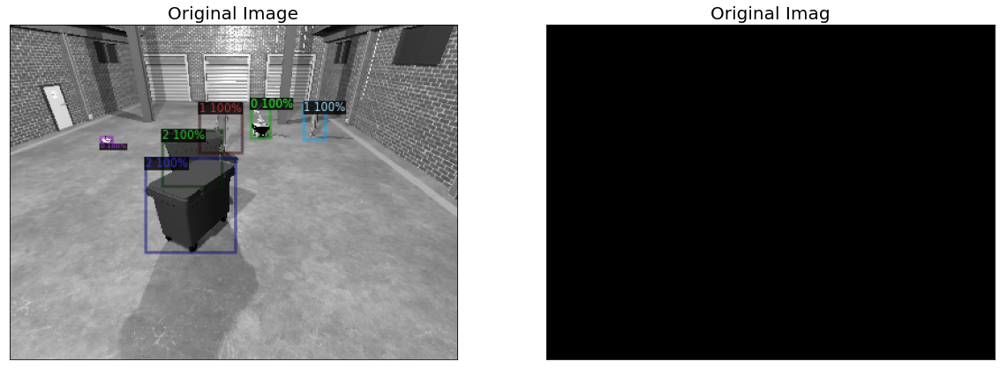

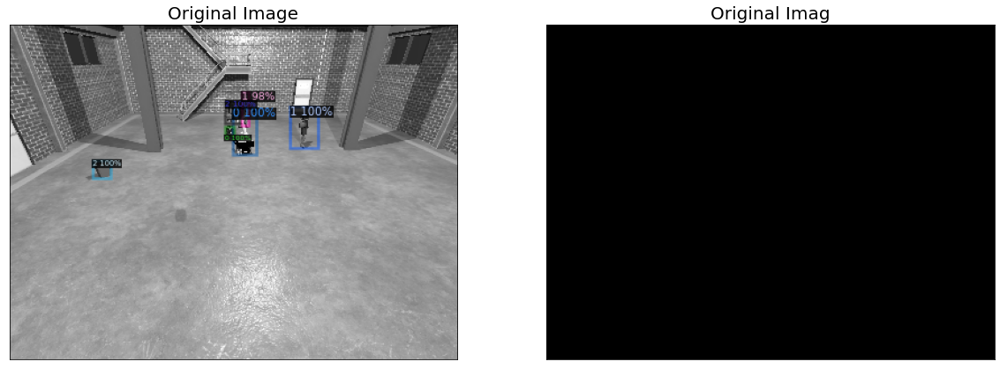

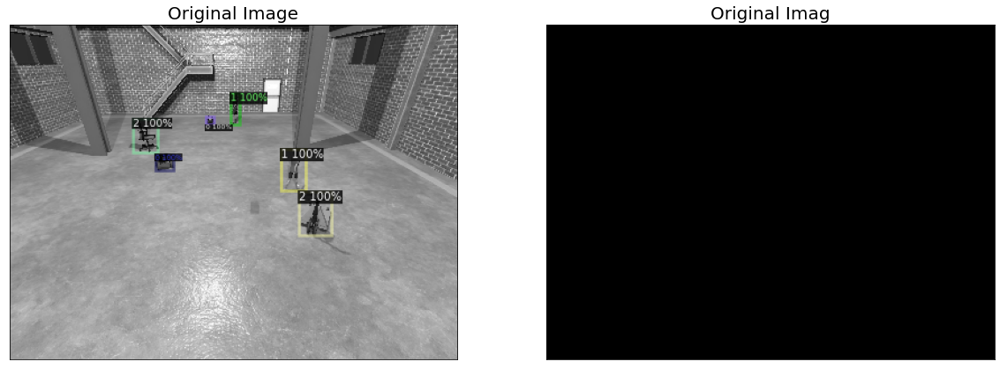

In [471]:
from detectron2.utils.visualizer import ColorMode
dataset_dicts = load_custom_dataset("valid")
for d in random.sample(dataset_dicts, 3):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    v = Visualizer(im[:, :, ::-1],
                   metadata=simulation_metadata, 
                   scale=0.5, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    visualize(
        original_image = out.get_image()[:, :, ::-1],
        original_imag = Image.new('1', (800,600))
    )

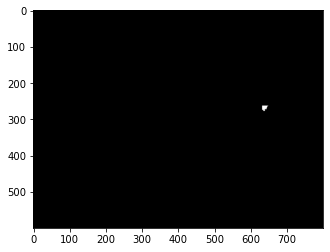

{'size': [600, 800], 'counts': b'Wbb;<\\b000O13M1O0000Kh]OIYb074O12NO1N2M3N2N20QWh2'}
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


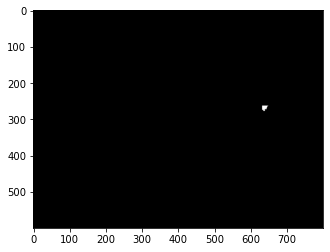

340.036316


In [440]:
from PIL import Image
import numpy as np

# Define the bbox coordinates in XYWH_ABS mode
x, y, w, h = 632, 263, 36, 32

# Load the PNG image
img = Image.open('labels_0000000.png')

# Crop the image to the bbox
bbox = (x, y, x+w, y+h)
img_crop = img.crop(bbox)

# Convert the cropped image to a numpy array
img_arr = np.array(img_crop)

# Find the indices of pixels with the specific RGB value
b = 10
mask1 = np.all(img_arr == [2, 0, b], axis=-1)
mask2 = np.all(img_arr == [1, 0, b], axis=-1)
mask = mask1 | mask2


# Create a binary mask of the whole image with the found pixels as 1s
full_mask = np.zeros((600,800), dtype=np.uint8)
full_mask[y:y+h, x:x+w] = mask.astype(np.uint8) * 255


# Plot the binary mask
# Plot the binary mask using matplotlib
plt.imshow(full_mask, cmap='gray')
plt.show()
rle = mask_utils.encode(np.asfortranarray(full_mask))
print(rle)
binary_mask = mask_util.decode(rle)

# Display the binary mask
print(binary_mask)
plt.imshow(binary_mask, cmap='gray')
plt.show()
print(ann_df['x_center'][index])


In [380]:
from pycocotools import mask as mask_util
import numpy as np
import cv2
from detectron2.utils.visualizer import Visualizer

# Load RLE-encoded masks
rle_masks = [{'size': [600, 800], 'counts': b'Wbb;<\\b000O13M1O0000Kh]OIYb074O12NO1N2M3N2N20QWh2'}]  # replace with your RLE-encoded masks

# Decode the RLE-encoded masks
binary_masks = []
for rle_mask in rle_masks:
    binary_mask = mask_util.decode(rle_mask)
    binary_masks.append(binary_mask)

# Convert the binary masks to a numpy array
binary_masks = np.stack(binary_masks)

# Create a visualizer to display the masks
visualizer = Visualizer(img_rgb, metadata=metadata, scale=1.0)

# Display the masks
visualizer.overlay_instances(
    masks=binary_masks,    # binary masks
    metadata=metadata
)

# Show the image with masks overlaid
cv2.imshow("image with masks", visualizer.output.get_image()[:, :, ::-1])
cv2.waitKey(0)

NameError: name 'img_rgb' is not defined